In [65]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
from scipy import stats

hirid = pd.read_csv('./dataset/HiRID_ARDS_12H_SPLIT.csv.gz')
picu = pd.read_csv('./dataset/PICU_ARDS_12H_SPLIT.csv.gz')
mimic = pd.read_csv('./dataset/MIMIC_ARDS_12H_SPLIT.csv.gz')

cat_cols = ['Creatinine_up', 'Lactate_up', 'Platelet_Count_up', 'Bilirubin_up', 'INR_up', 'pH_up', 'Antibiotics', 'Vasopressor', 'Sex']

cont_cols = ['Time_since_ICU_admission', 'ABPd', 'ABPs', 'FiO2', 'HR', 'MAP', 'PaO2', 'Respiratory_rate', 'SpO2',
                        'Temperature', 'Urine_Output', 'FiO2_returns', 'FiO2_max_3h', 'FiO2_min_3h', 'FiO2_5MA', 'FiO2_10MA',
                        'FiO2_20MA', 'FiO2_RSI_3h', 'PaO2_returns', 'PaO2_max_3h', 'PaO2_min_3h', 'PaO2_5MA', 'PaO2_10MA', 'PaO2_20MA',
                        'PaO2_RSI_3h', 'MAP_returns', 'MAP_max_3h', 'MAP_min_3h', 'MAP_5MA', 'MAP_10MA', 'MAP_20MA', 'MAP_RSI_3h', 
                        'Respiratory_rate_returns', 'Respiratory_rate_max_3h', 'Respiratory_rate_min_3h','Respiratory_rate_5MA',
                        'Respiratory_rate_10MA', 'Respiratory_rate_20MA', 'Respiratory_rate_RSI_3h', 'PP', 'Creatinine', 'Lactate',
                        'Platelet_Count', 'Bilirubin', 'INR', 'pH', 'Fluid_Bolus', 'PaO2/FiO2', 'Age']

raw_cols = ['ABPd', 'ABPs', 'FiO2', 'HR', 'MAP', 'PaO2', 'Respiratory_rate', 'SpO2', 'Temperature', 'Urine_Output', 'PP', 'Creatinine', 'Lactate',
            'Platelet_Count', 'Bilirubin', 'INR', 'pH', 'Fluid_Bolus', 'PaO2/FiO2', 'Age']

use_cols = cont_cols + cat_cols

print(hirid.SUBJECT_ID.nunique()  + picu.SUBJECT_ID.nunique())

8005


In [71]:
len(['Time_since_ICU_admission', 'ABPd', 'ABPs', 'FiO2', 'HR', 'MAP', 'PaO2', 'Respiratory_rate', 'SpO2','Temperature', 
                                'Urine_Output', 'FiO2_returns', 'PP', 'Creatinine', 'Lactate', 'Platelet_Count', 'Bilirubin', 'INR', 'pH', 'Fluid_Bolus', 'PaO2/FiO2', 'Age'])

22

In [31]:
### MMD (Maximum Mean Discrepancy)
# Compute MMD (maximum mean discrepancy) using numpy and scikit-learn.
import numpy as np
from sklearn import metrics


def mmd_linear(X, Y):
    """MMD using linear kernel (i.e., k(x,y) = <x,y>)
    Note that this is not the original linear MMD, only the reformulated and faster version.
    The original version is:
        def mmd_linear(X, Y):
            XX = np.dot(X, X.T)
            YY = np.dot(Y, Y.T)
            XY = np.dot(X, Y.T)
            return XX.mean() + YY.mean() - 2 * XY.mean()

    Arguments:
        X {[n_sample1, dim]} -- [X matrix]
        Y {[n_sample2, dim]} -- [Y matrix]

    Returns:
        [scalar] -- [MMD value]
    """
    delta = X.mean(0) - Y.mean(0)
    return delta.dot(delta.T)


def mmd_rbf(X, Y, gamma=1.0):
    """MMD using rbf (gaussian) kernel (i.e., k(x,y) = exp(-gamma * ||x-y||^2 / 2))

    Arguments:
        X {[n_sample1, dim]} -- [X matrix]
        Y {[n_sample2, dim]} -- [Y matrix]

    Keyword Arguments:
        gamma {float} -- [kernel parameter] (default: {1.0})

    Returns:
        [scalar] -- [MMD value]
    """
    XX = metrics.pairwise.rbf_kernel(X, X, gamma)
    YY = metrics.pairwise.rbf_kernel(Y, Y, gamma)
    XY = metrics.pairwise.rbf_kernel(X, Y, gamma)
    return XX.mean() + YY.mean() - 2 * XY.mean()


def mmd_poly(X, Y, degree=2, gamma=1, coef0=0):
    """MMD using polynomial kernel (i.e., k(x,y) = (gamma <X, Y> + coef0)^degree)

    Arguments:
        X {[n_sample1, dim]} -- [X matrix]
        Y {[n_sample2, dim]} -- [Y matrix]

    Keyword Arguments:
        degree {int} -- [degree] (default: {2})
        gamma {int} -- [gamma] (default: {1})
        coef0 {int} -- [constant item] (default: {0})

    Returns:
        [scalar] -- [MMD value]
    """
    XX = metrics.pairwise.polynomial_kernel(X, X, degree, gamma, coef0)
    YY = metrics.pairwise.polynomial_kernel(Y, Y, degree, gamma, coef0)
    XY = metrics.pairwise.polynomial_kernel(X, Y, degree, gamma, coef0)
    return XX.mean() + YY.mean() - 2 * XY.mean()

In [45]:
## Random Sampling으로 200개의 Stay를 추출해 계산 -> Raw Columns
## 결측치(-100)제거 전 
import random
random.seed(42)

hirid_id = random.sample(hirid.SUBJECT_ID.unique().tolist(),200)
picu_id = random.sample(picu.SUBJECT_ID.unique().tolist(),200)
mimic_id = random.sample(mimic.SUBJECT_ID.unique().tolist(),200)

### HIRID vs PICU
print(f' MMD Lienar Value : {mmd_linear(hirid[hirid.SUBJECT_ID.isin(hirid_id)][raw_cols].values, picu[picu.SUBJECT_ID.isin(picu_id)][raw_cols].values)}')  # 6.0
print(f' MMD RBF Value : {mmd_rbf(hirid[hirid.SUBJECT_ID.isin(hirid_id)][raw_cols].values, picu[picu.SUBJECT_ID.isin(picu_id)][raw_cols].values)}')  # 0.5822
print(f' MMD Poly Value : {mmd_poly(hirid[hirid.SUBJECT_ID.isin(hirid_id)][raw_cols].values, picu[picu.SUBJECT_ID.isin(picu_id)][raw_cols].values)}')  # 2436.5

### HIRID vs MIMIC
print(f' MMD Lienar Value : {mmd_linear(hirid[hirid.SUBJECT_ID.isin(hirid_id)][raw_cols].values, mimic[mimic.SUBJECT_ID.isin(mimic_id)][raw_cols].values)}')  # 6.0
print(f' MMD RBF Value : {mmd_rbf(hirid[hirid.SUBJECT_ID.isin(hirid_id)][raw_cols].values, mimic[mimic.SUBJECT_ID.isin(mimic_id)][raw_cols].values)}')  # 0.5822
print(f' MMD Poly Value : {mmd_poly(hirid[hirid.SUBJECT_ID.isin(hirid_id)][raw_cols].values, mimic[mimic.SUBJECT_ID.isin(mimic_id)][raw_cols].values)}')  # 2436.5

 MMD Lienar Value : 120398.55391133693
 MMD RBF Value : 0.0006379430034262859
 MMD Poly Value : 59318075633.18715
 MMD Lienar Value : 25819.505522081683
 MMD RBF Value : 0.00044594295713831273
 MMD Poly Value : 17977943436.444138


In [47]:
## Random Sampling으로 200개의 Stay를 추출해 계산 -> Continuous Columns
## 결측치(-100)제거 전 
import random
random.seed(42)

hirid_id = random.sample(hirid.SUBJECT_ID.unique().tolist(),200)
picu_id = random.sample(picu.SUBJECT_ID.unique().tolist(),200)
mimic_id = random.sample(mimic.SUBJECT_ID.unique().tolist(),200)

### HIRID vs PICU
print(f' MMD Lienar Value : {mmd_linear(hirid[hirid.SUBJECT_ID.isin(hirid_id)][cont_cols].values, picu[picu.SUBJECT_ID.isin(picu_id)][cont_cols].values)}')  # 6.0
print(f' MMD RBF Value : {mmd_rbf(hirid[hirid.SUBJECT_ID.isin(hirid_id)][cont_cols].values, picu[picu.SUBJECT_ID.isin(picu_id)][cont_cols].values)}')  # 0.5822
print(f' MMD Poly Value : {mmd_poly(hirid[hirid.SUBJECT_ID.isin(hirid_id)][cont_cols].values, picu[picu.SUBJECT_ID.isin(picu_id)][cont_cols].values)}')  # 2436.5

### HIRID vs MIMIC
print(f' MMD Lienar Value : {mmd_linear(hirid[hirid.SUBJECT_ID.isin(hirid_id)][cont_cols].values, mimic[mimic.SUBJECT_ID.isin(mimic_id)][cont_cols].values)}')  # 6.0
print(f' MMD RBF Value : {mmd_rbf(hirid[hirid.SUBJECT_ID.isin(hirid_id)][cont_cols].values, mimic[mimic.SUBJECT_ID.isin(mimic_id)][cont_cols].values)}')  # 0.5822
print(f' MMD Poly Value : {mmd_poly(hirid[hirid.SUBJECT_ID.isin(hirid_id)][cont_cols].values, mimic[mimic.SUBJECT_ID.isin(mimic_id)][cont_cols].values)}')  # 2436.5

 MMD Lienar Value : 338660.7379999278
 MMD RBF Value : 0.0001949496937926779
 MMD Poly Value : 423804948274.77423
 MMD Lienar Value : 41917.96950069704
 MMD RBF Value : 0.00042697311887273054
 MMD Poly Value : 36279623736.88284


In [68]:
## Random Sampling으로 200 Stay를 추출해 계산 -> Vital Columns
## 결측치(-100)제거 전 
import random
random.seed(42)

vital_cols = ['ABPd','ABPs','FiO2', 'HR', 'MAP', 'PaO2', 'Respiratory_rate', 'SpO2', 'Temperature']

hirid_id = random.sample(hirid.SUBJECT_ID.unique().tolist(),200)
picu_id = random.sample(picu.SUBJECT_ID.unique().tolist(),200)
mimic_id = random.sample(mimic.SUBJECT_ID.unique().tolist(),200)

### HIRID vs PICU
print(f' MMD Lienar Value : {mmd_linear(hirid[hirid.SUBJECT_ID.isin(hirid_id)][vital_cols].values, picu[picu.SUBJECT_ID.isin(picu_id)][vital_cols].values)}')  # 6.0
print(f' MMD RBF Value : {mmd_rbf(hirid[hirid.SUBJECT_ID.isin(hirid_id)][vital_cols].values, picu[picu.SUBJECT_ID.isin(picu_id)][vital_cols].values)}')  # 0.5822
print(f' MMD Poly Value : {mmd_poly(hirid[hirid.SUBJECT_ID.isin(hirid_id)][vital_cols].values, picu[picu.SUBJECT_ID.isin(picu_id)][vital_cols].values)}')  # 2436.5

### HIRID vs MIMIC
print(f' MMD Lienar Value : {mmd_linear(hirid[hirid.SUBJECT_ID.isin(hirid_id)][vital_cols].values, mimic[mimic.SUBJECT_ID.isin(mimic_id)][vital_cols].values)}')  # 6.0
print(f' MMD RBF Value : {mmd_rbf(hirid[hirid.SUBJECT_ID.isin(hirid_id)][vital_cols].values, mimic[mimic.SUBJECT_ID.isin(mimic_id)][vital_cols].values)}')  # 0.5822
print(f' MMD Poly Value : {mmd_poly(hirid[hirid.SUBJECT_ID.isin(hirid_id)][vital_cols].values, mimic[mimic.SUBJECT_ID.isin(mimic_id)][vital_cols].values)}')  # 2436.5

 MMD Lienar Value : 30165.819454614197
 MMD RBF Value : 0.0006962613026851295
 MMD Poly Value : 2646424664.4969497
 MMD Lienar Value : 9295.40932304005
 MMD RBF Value : 0.0009305452001478136
 MMD Poly Value : 696342982.8863344


In [66]:
## vital Columns
## 결측치(-100)제거 후
import random
random.seed(42)

vital_cols = ['ABPd','ABPs','FiO2', 'HR', 'MAP', 'PaO2', 'Respiratory_rate', 'SpO2', 'Temperature']
mimic_check = mimic[vital_cols]
hirid_check = hirid[vital_cols]

drop_mimic = mimic_check.drop(mimic_check[mimic_check.eq(-100).any(axis = 1)].index)
drop_hirid = hirid_check.drop(hirid_check[hirid_check.eq(-100).any(axis = 1)].index)


## HIRID vs MIMIC
print(f' MMD Lienar Value : {mmd_linear(drop_hirid.values, drop_mimic.values)}')  # 6.0
print(f' MMD RBF Value : {mmd_rbf(drop_hirid.values, drop_mimic.values)}')  # 0.5822
print(f' MMD Poly Value : {mmd_poly(drop_hirid.values, drop_mimic.values)}')  # 2436.5

 MMD Lienar Value : 7935.447527991953
 MMD RBF Value : 0.0039223719328148
 MMD Poly Value : 2325902862.4333286


=== Time_since_ICU_admission T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | picu normality : 0.0
T-Statistic: 6414086491.5  T_P-Value: 0.0



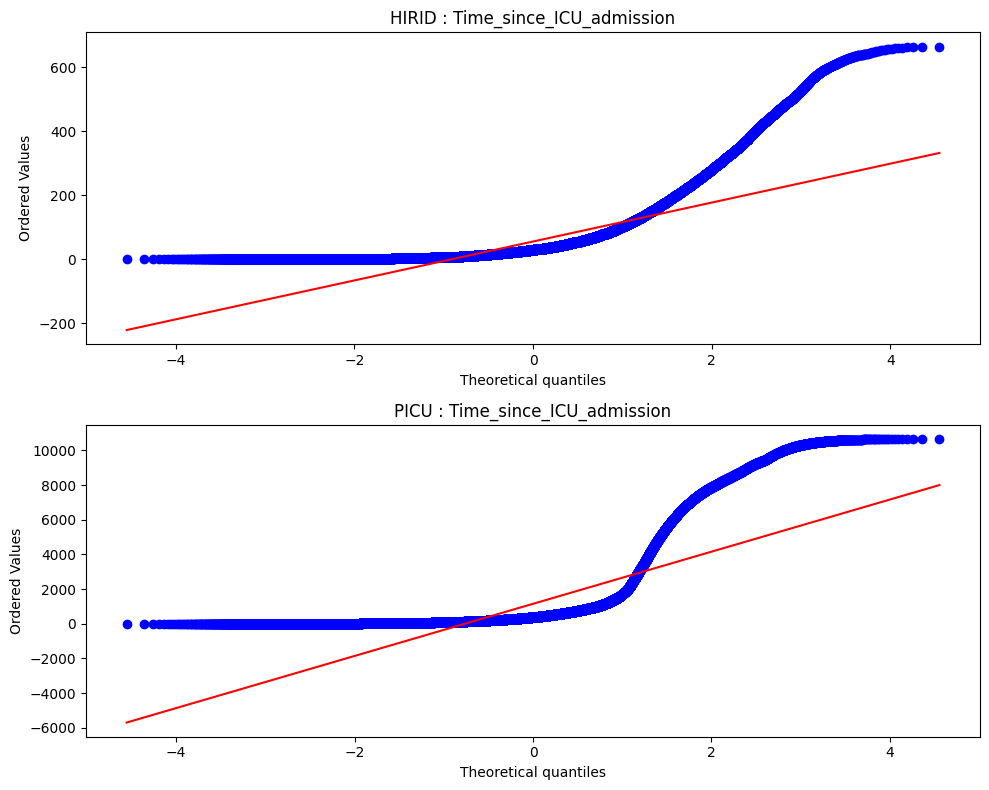

=== ABPd T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | picu normality : 0.0
T-Statistic: 35513658174.0  T_P-Value: 0.0



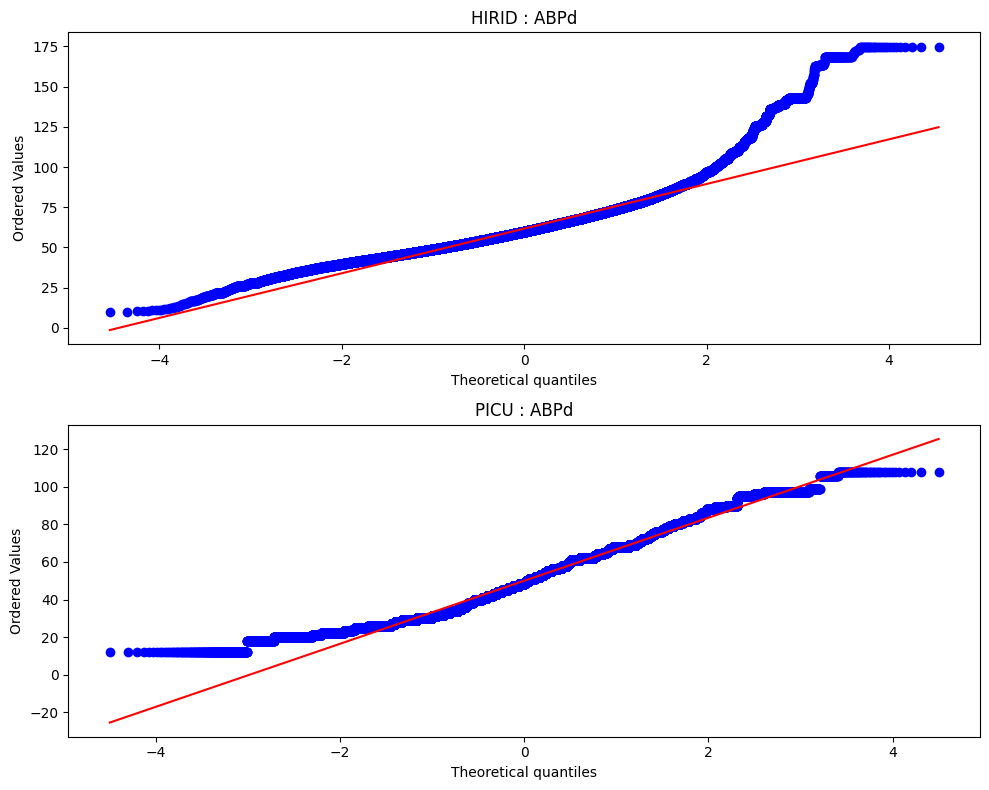

=== ABPs T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | picu normality : 0.0
T-Statistic: 45449886363.5  T_P-Value: 0.0



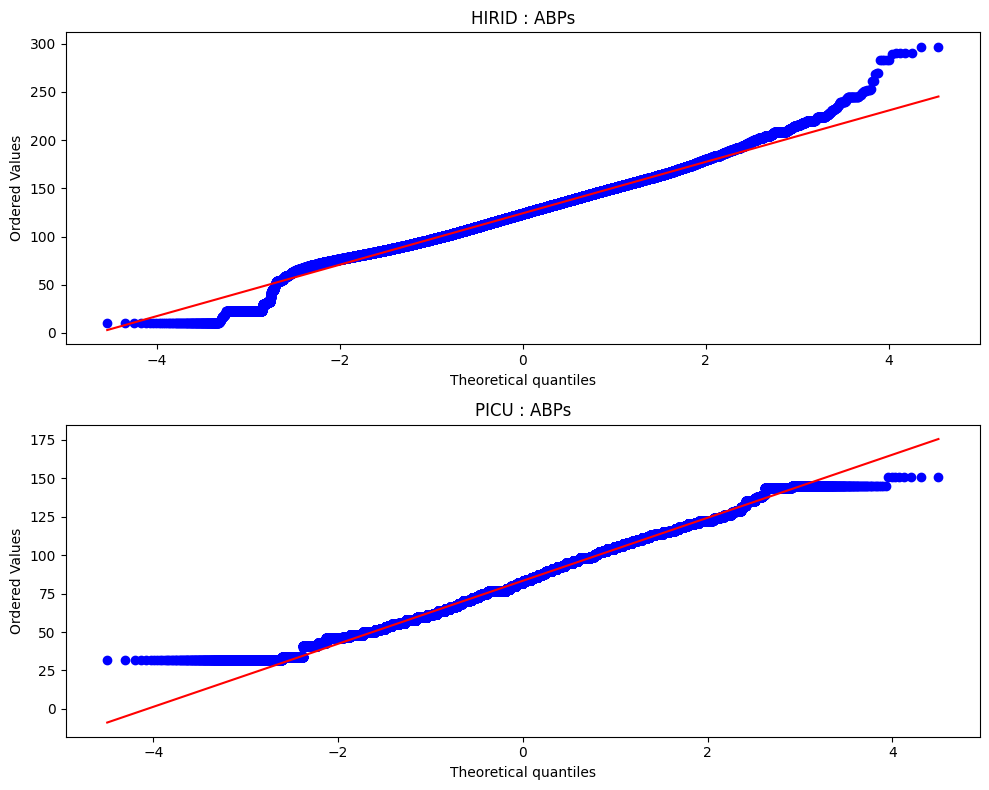

=== FiO2 T-Test Result ===
Normality is satisfied
hirid normality : 0.0 | picu normality : nan
T-Statistic: 712.0713742663769  T_P-Value: 0.0



/home/sdh00/.pyenv/versions/3.9.12/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1584: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  b2 = skew(a, axis)
/home/sdh00/.pyenv/versions/3.9.12/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1786: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  b2 = kurtosis(a, axis, fisher=False)
/home/sdh00/.pyenv/versions/3.9.12/lib/python3.9/site-packages/scipy/stats/_axis_nan_policy.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


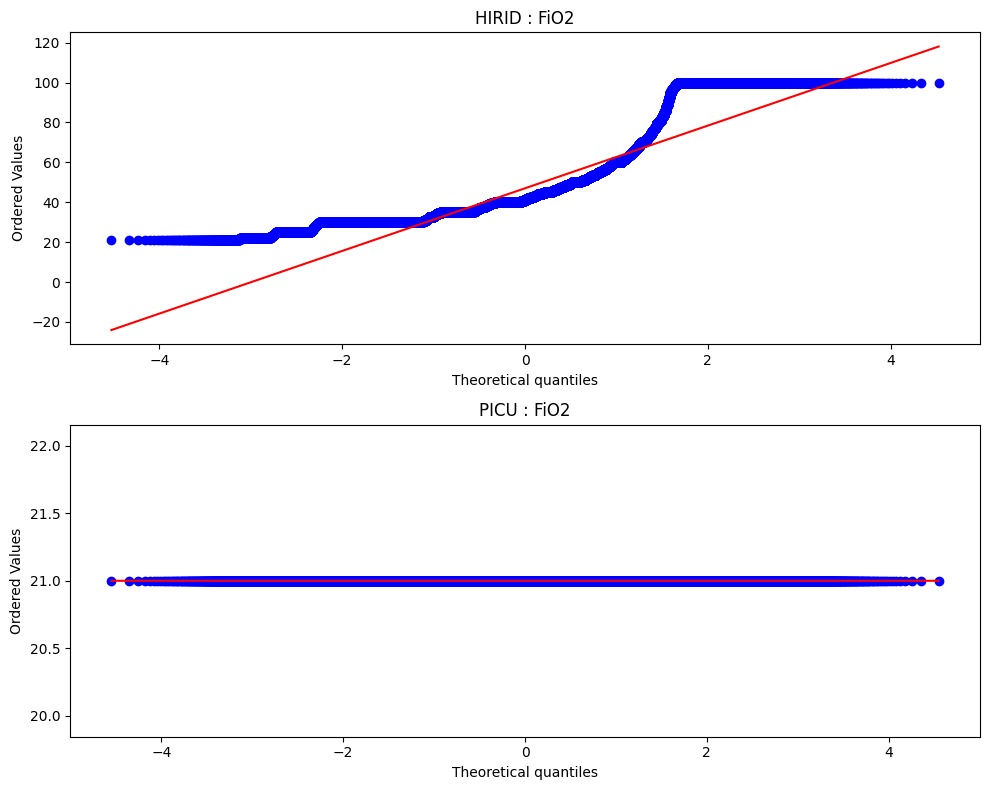

=== HR T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | picu normality : 0.0
T-Statistic: 3335707508.5  T_P-Value: 0.0



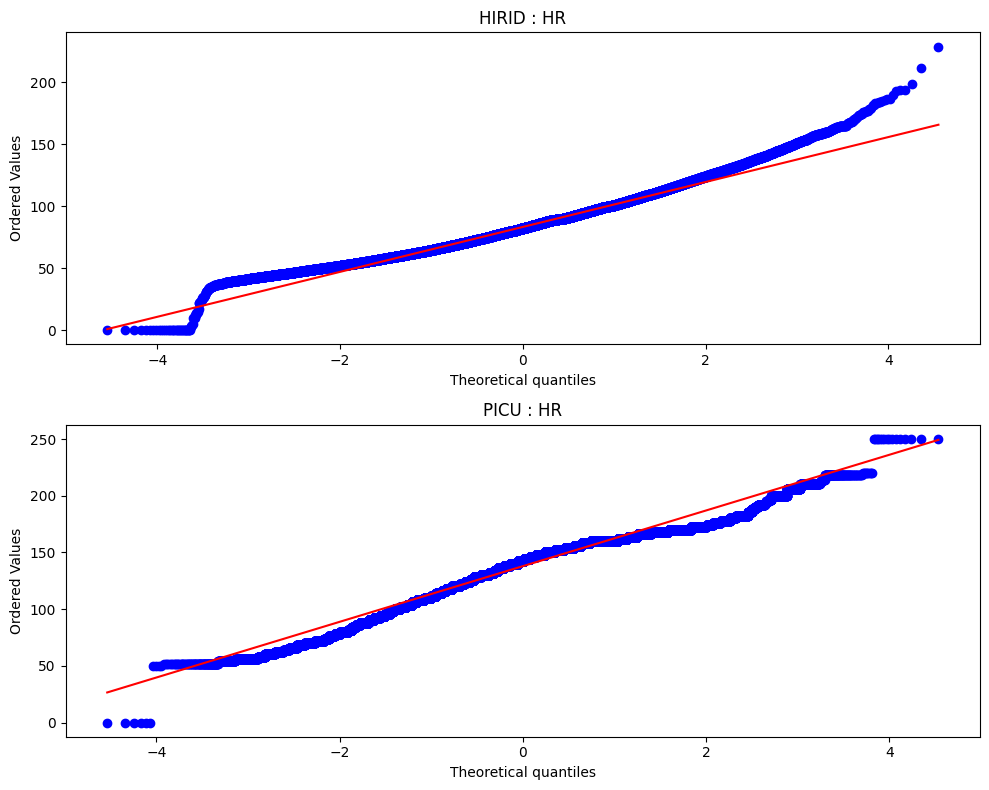

=== MAP T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | picu normality : 0.0
T-Statistic: 41499369866.5  T_P-Value: 0.0



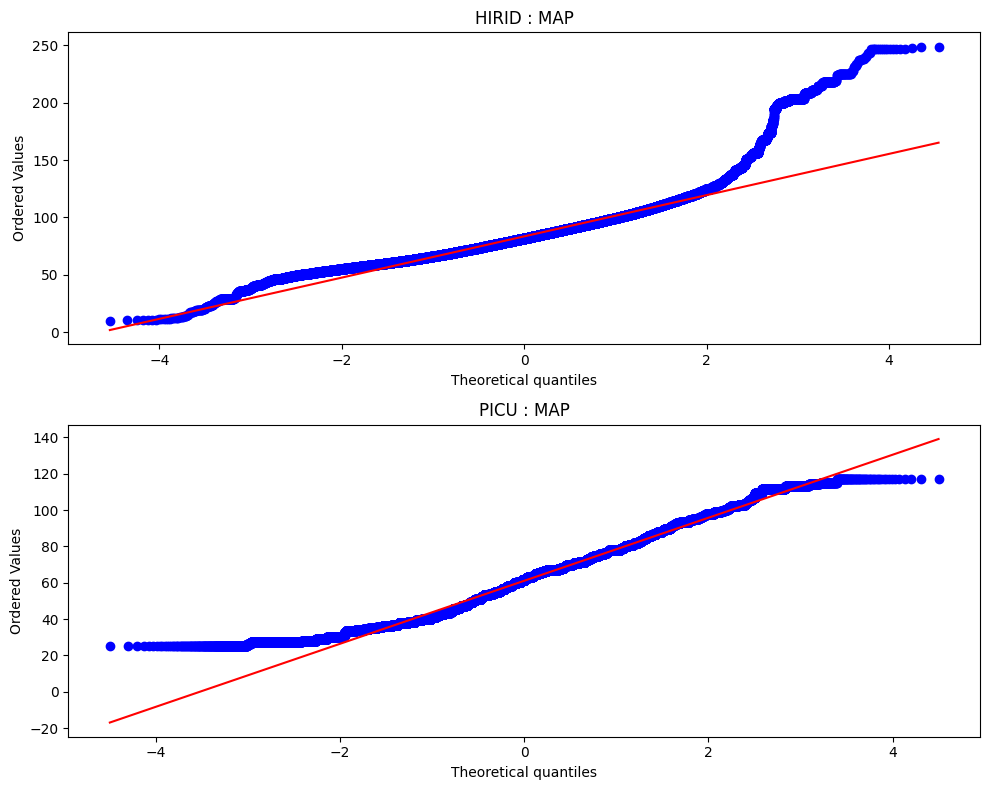

=== PaO2 T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | picu normality : 0.0
T-Statistic: 33208222664.0  T_P-Value: 0.0



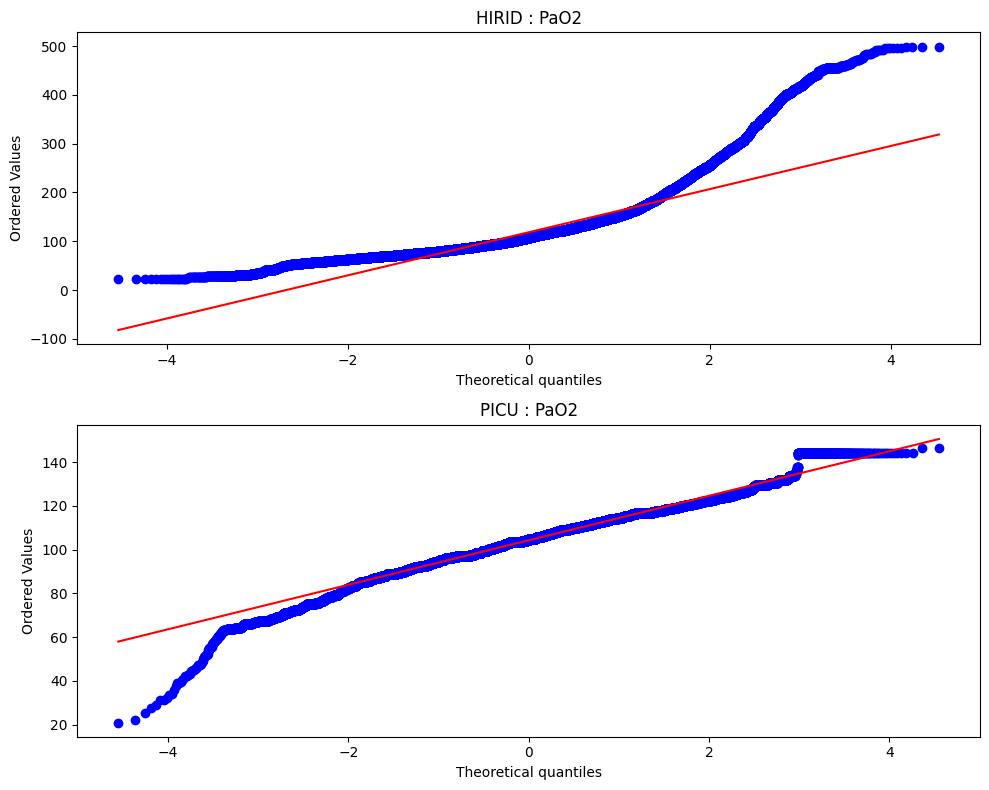

=== Respiratory_rate T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | picu normality : 3.0719792331507e-309
T-Statistic: 3295962049.0  T_P-Value: 0.0



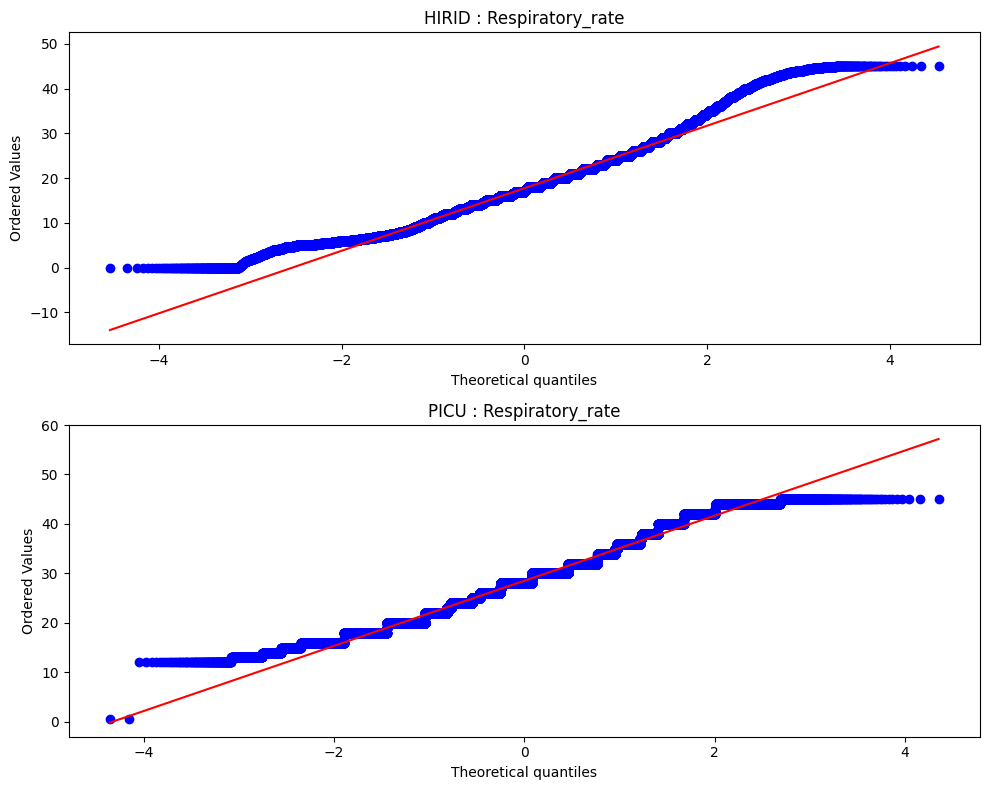

=== SpO2 T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | picu normality : 0.0
T-Statistic: 31200427846.0  T_P-Value: 0.0



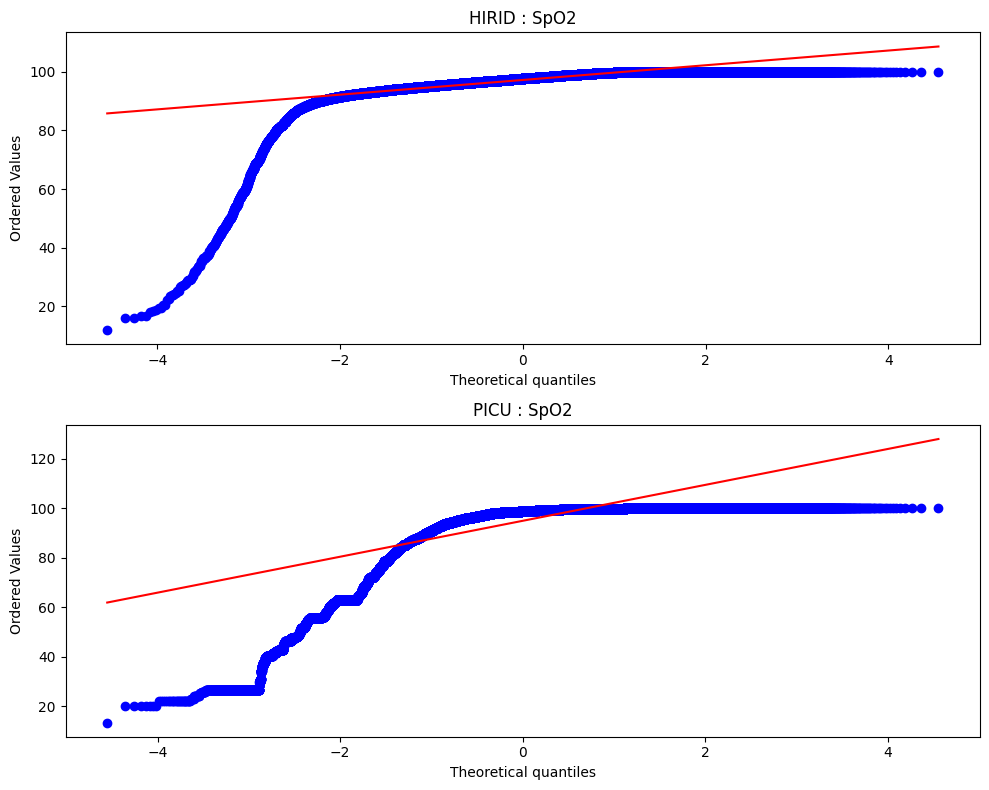

=== Temperature T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | picu normality : 0.0
T-Statistic: 5207344649.5  T_P-Value: 8.790041797261732e-104



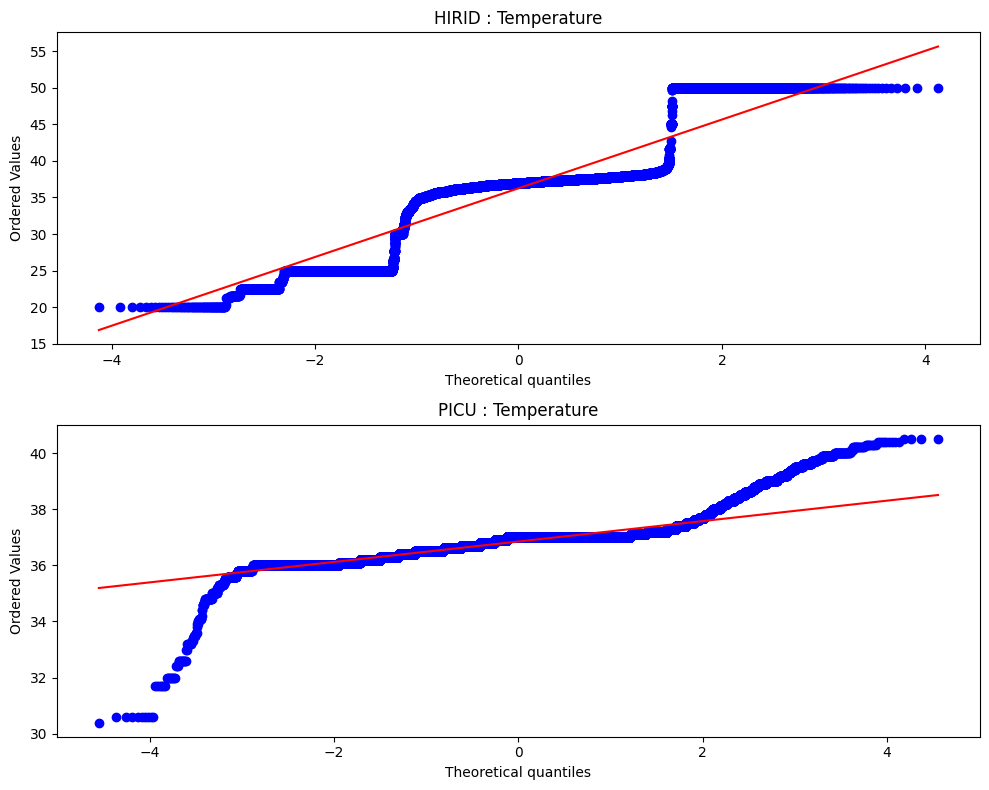

=== Urine_Output T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | picu normality : 0.0
T-Statistic: 426287844.5  T_P-Value: 0.0



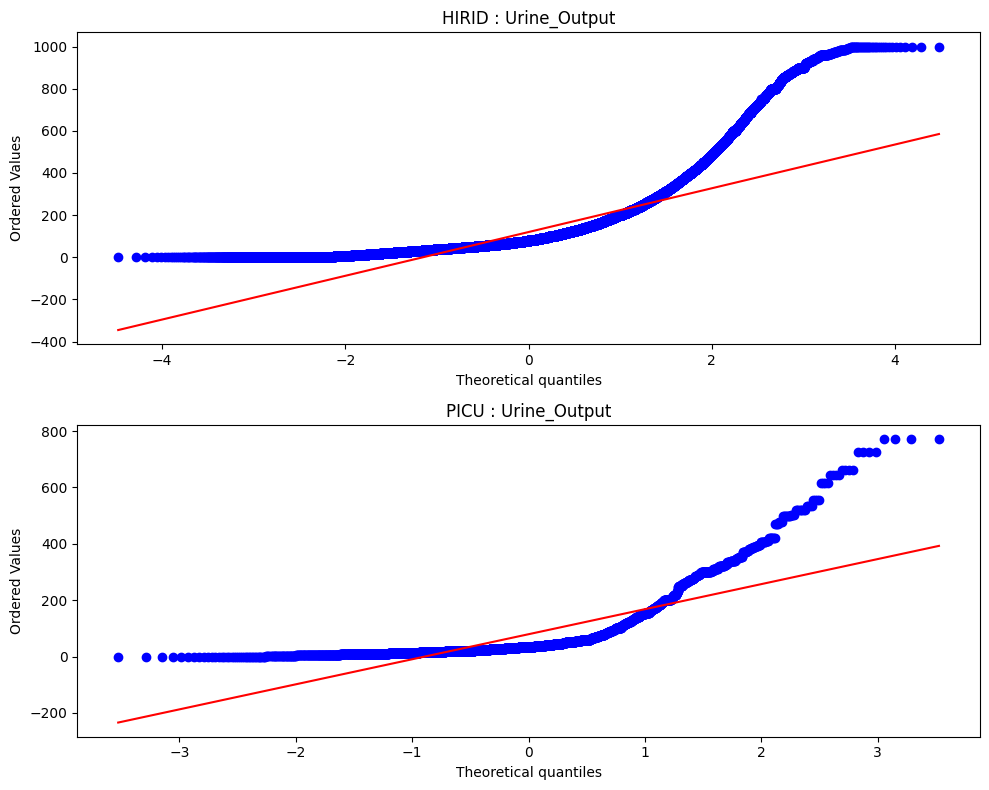

=== FiO2_returns T-Test Result ===
Normality is satisfied
hirid normality : 0.0 | picu normality : nan
T-Statistic: 1.0730940077873736  T_P-Value: 0.28323011028949635



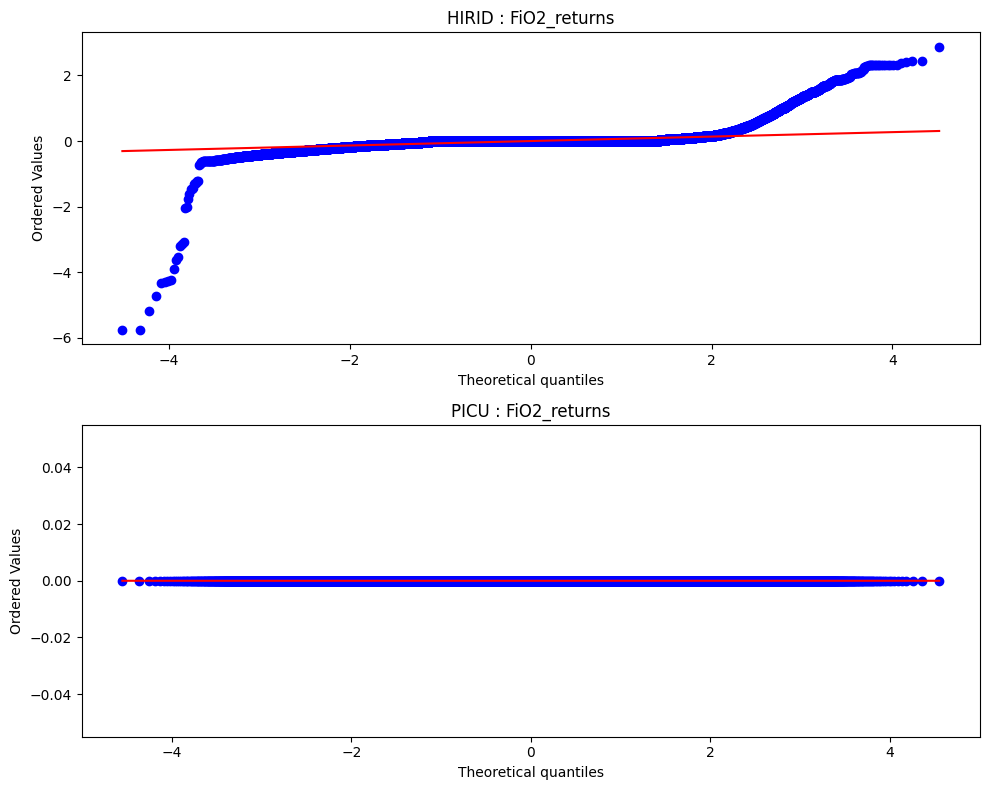

=== FiO2_max_3h T-Test Result ===
Normality is satisfied
hirid normality : 0.0 | picu normality : nan
T-Statistic: 701.6519805001612  T_P-Value: 0.0



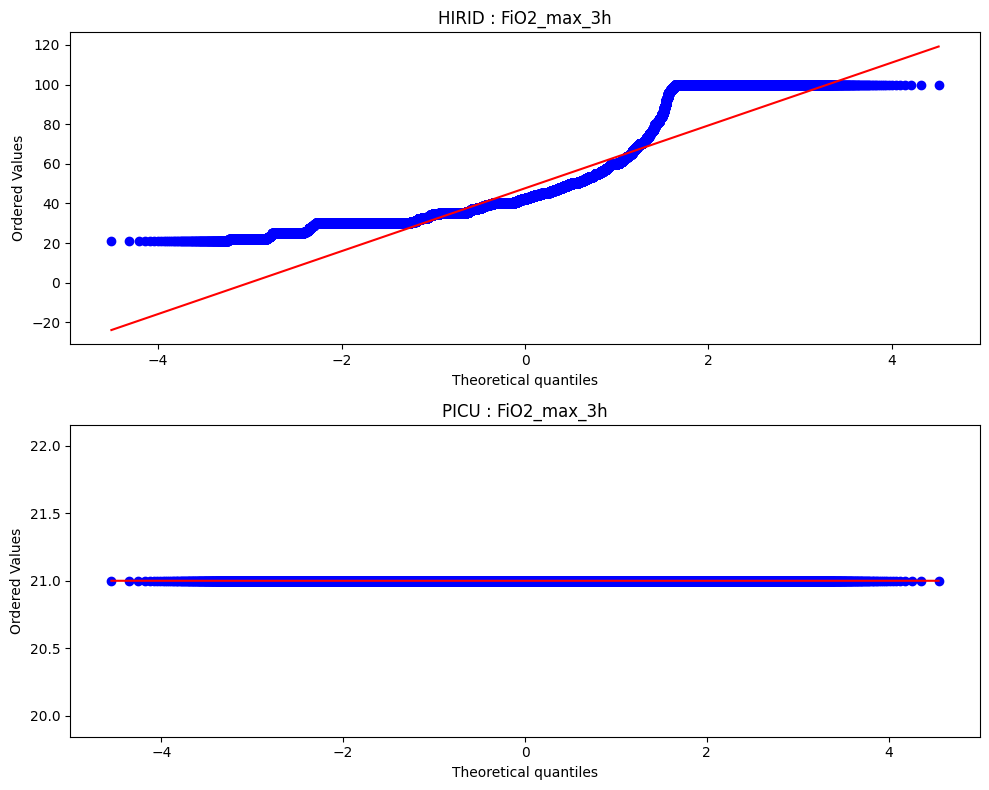

=== FiO2_min_3h T-Test Result ===
Normality is satisfied
hirid normality : 0.0 | picu normality : nan
T-Statistic: 659.4926448130043  T_P-Value: 0.0



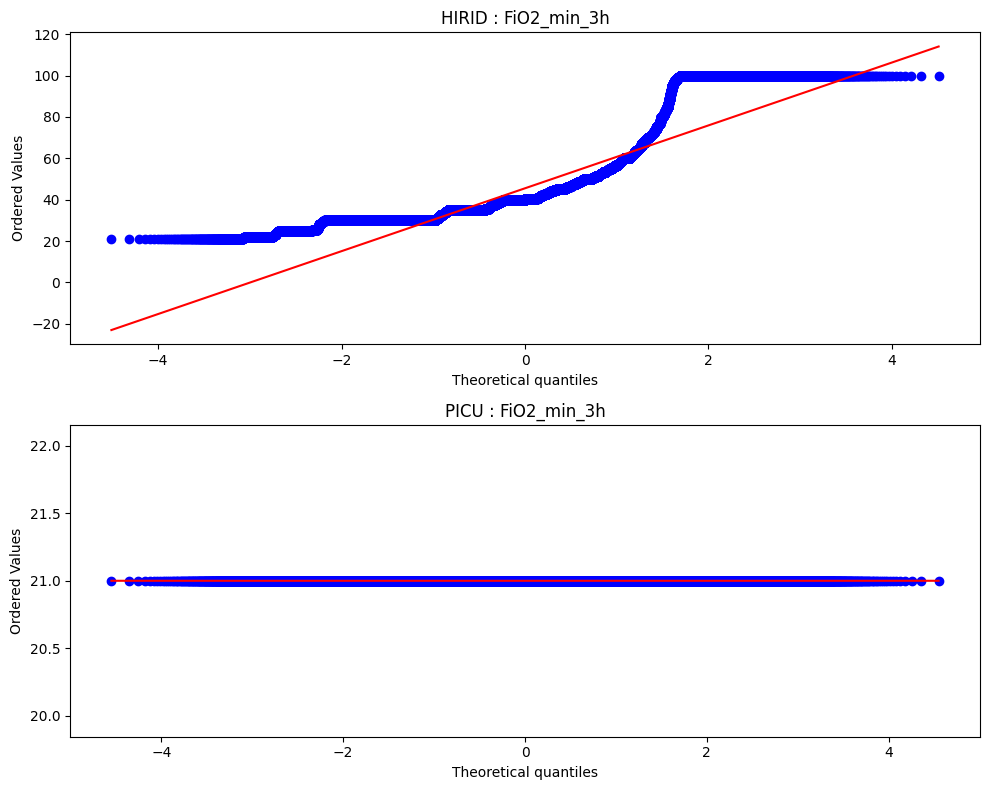

=== FiO2_5MA T-Test Result ===
Normality is satisfied
hirid normality : 0.0 | picu normality : nan
T-Statistic: 664.7589931022238  T_P-Value: 0.0



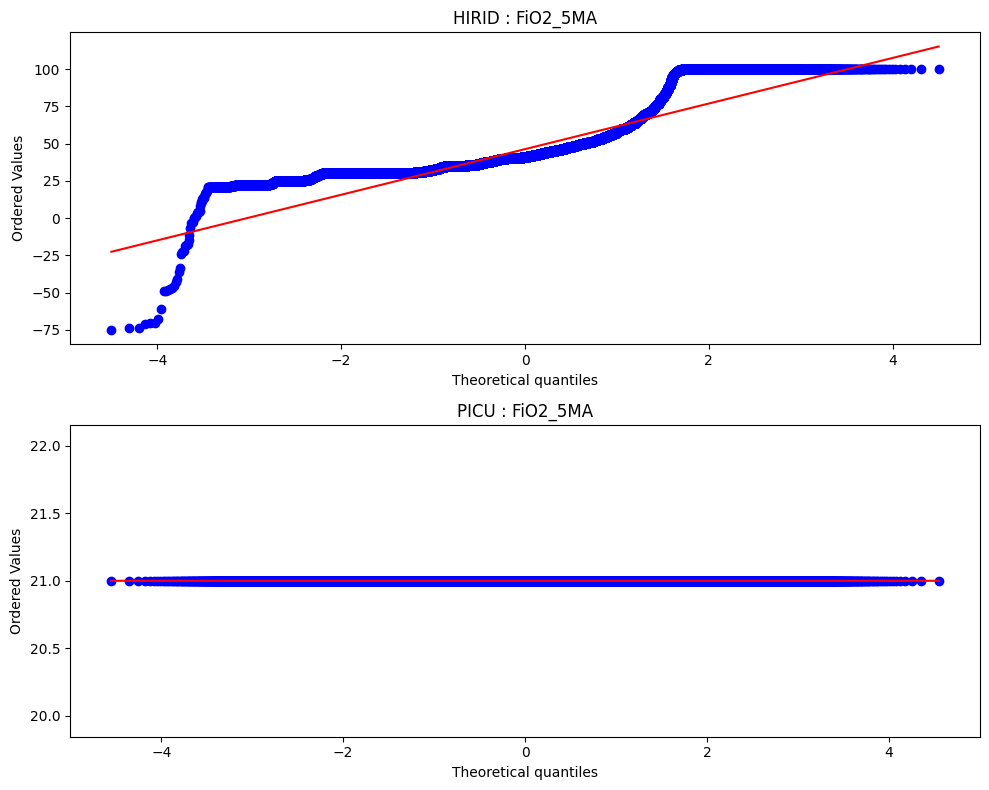

=== FiO2_10MA T-Test Result ===
Normality is satisfied
hirid normality : 0.0 | picu normality : nan
T-Statistic: 619.8197576758365  T_P-Value: 0.0



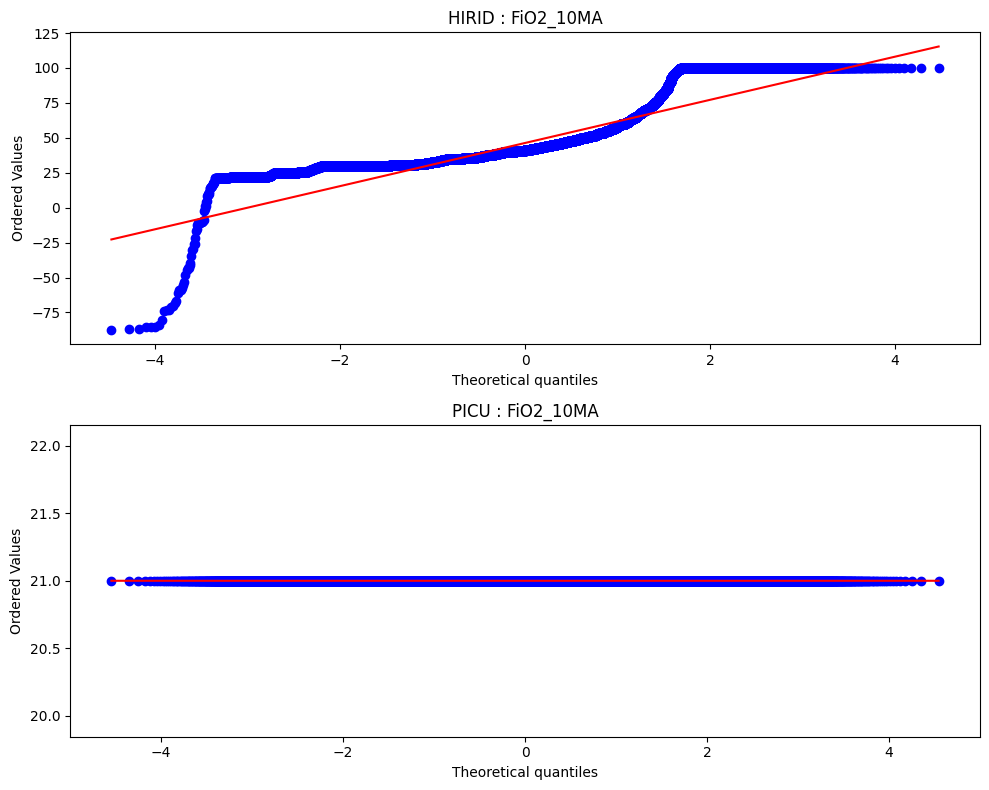

=== FiO2_20MA T-Test Result ===
Normality is satisfied
hirid normality : 0.0 | picu normality : nan
T-Statistic: 546.596695318841  T_P-Value: 0.0



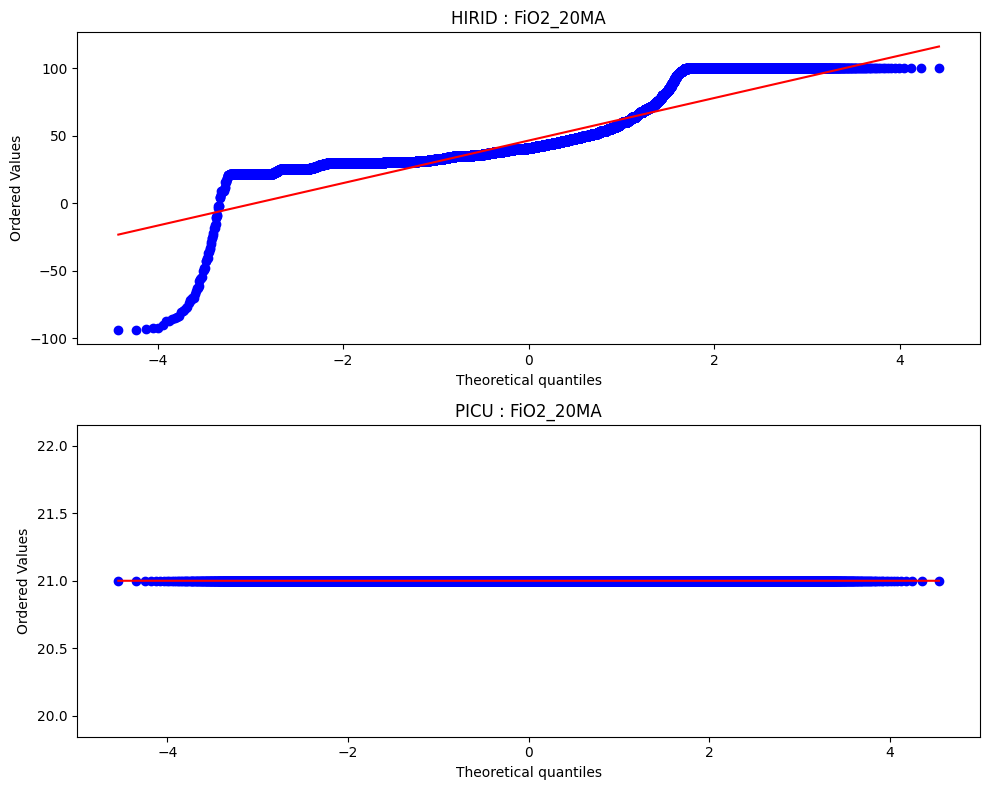

=== FiO2_RSI_3h T-Test Result ===
=== FiO2_RSI_3h T-Test Result Pass!!! ===
=== PaO2_returns T-Test Result ===
Normality is not satisfied


/home/sdh00/.pyenv/versions/3.9.12/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1171: RuntimeWarning: Mean of empty slice.
  mean = a.mean(axis, keepdims=True)
/home/sdh00/.pyenv/versions/3.9.12/lib/python3.9/site-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
/home/sdh00/.pyenv/versions/3.9.12/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/sdh00/.pyenv/versions/3.9.12/lib/python3.9/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


hirid normality : 0.0 | picu normality : 0.0
T-Statistic: 29454866089.0  T_P-Value: 0.0



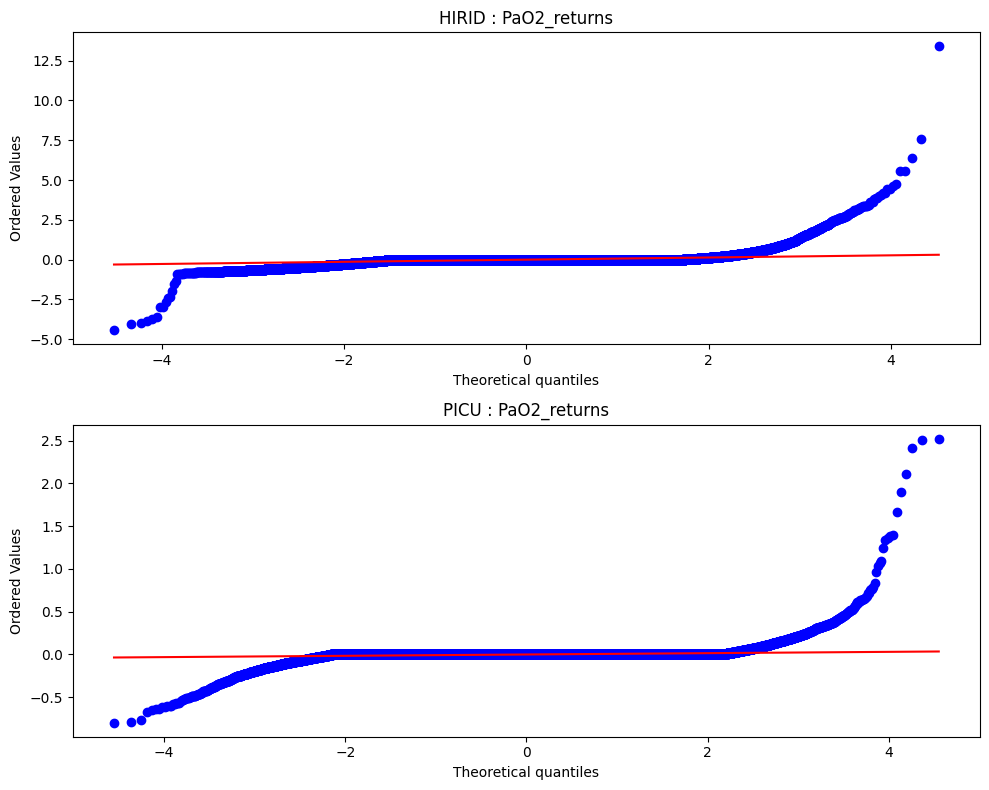

=== PaO2_max_3h T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | picu normality : 0.0
T-Statistic: 32397046089.0  T_P-Value: 0.0



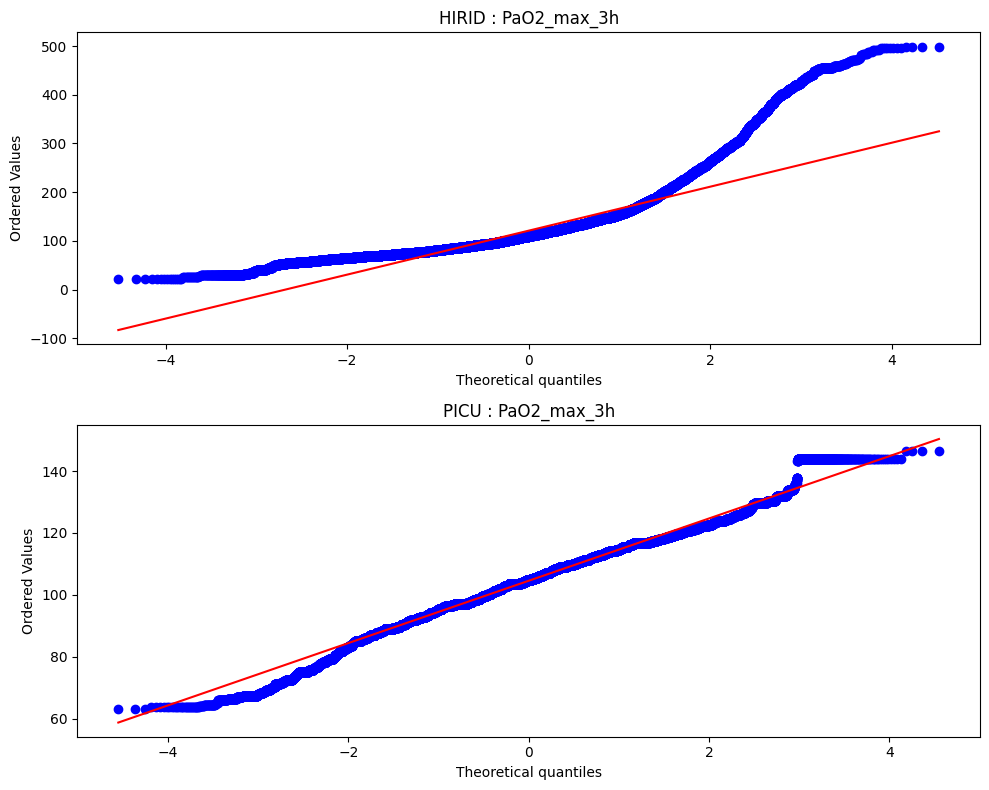

=== PaO2_min_3h T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | picu normality : 0.0
T-Statistic: 29542604563.5  T_P-Value: 1.5202101089644096e-35



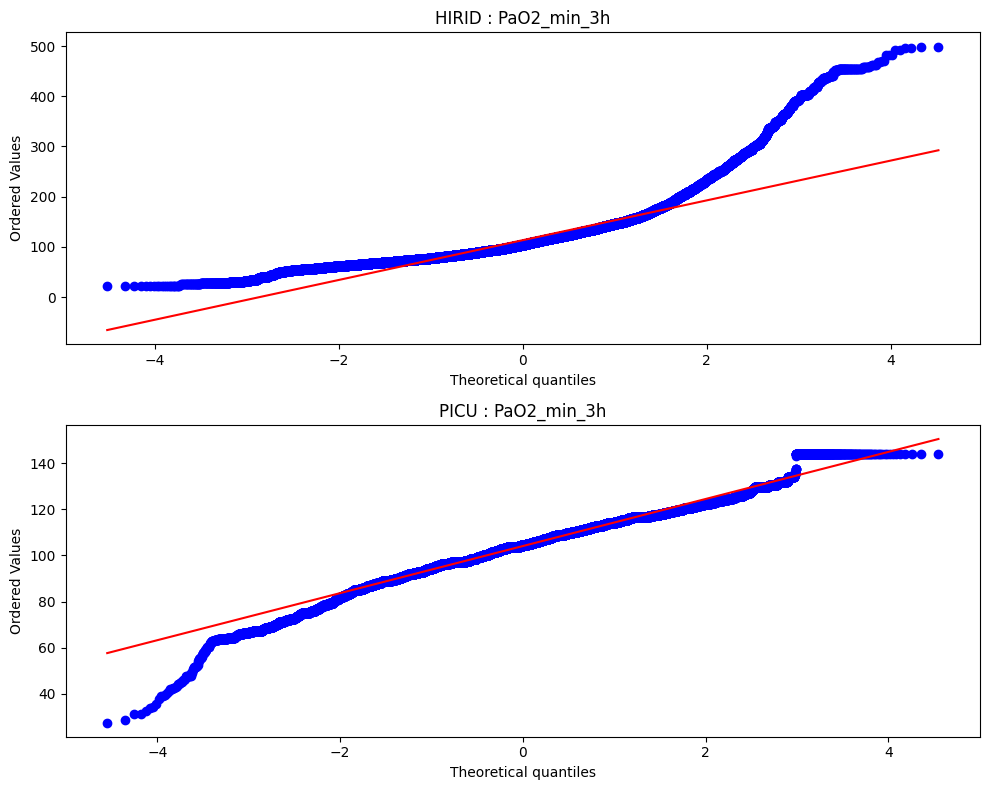

=== PaO2_5MA T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | picu normality : 0.0
T-Statistic: 29410375834.0  T_P-Value: 0.0



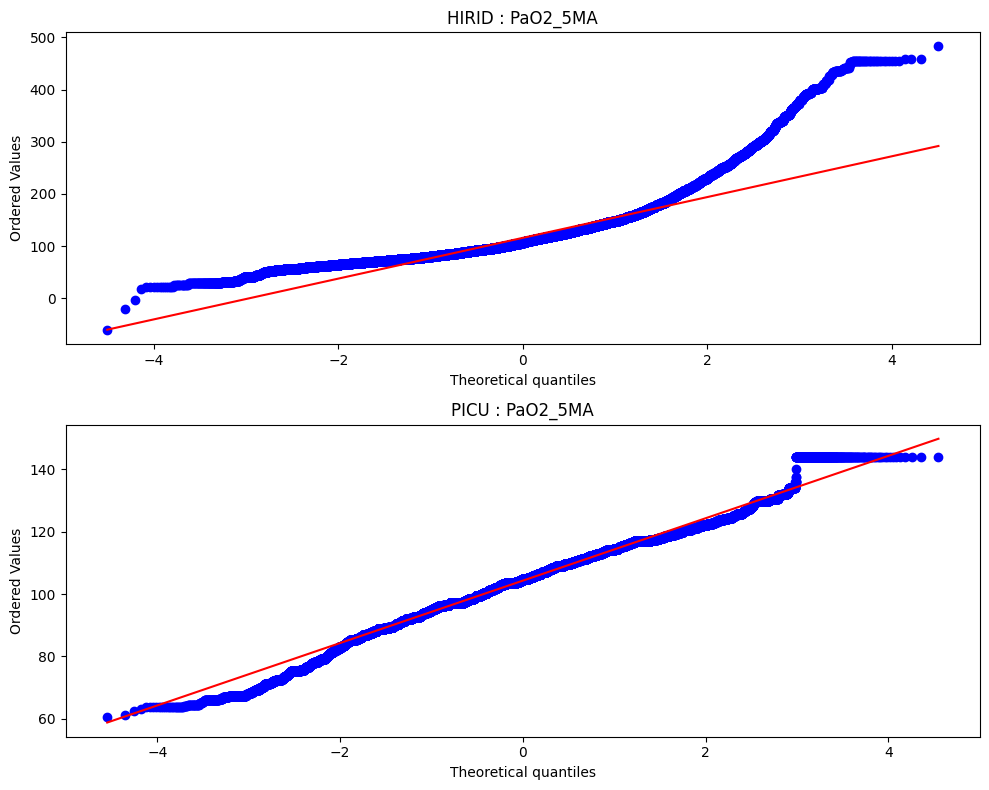

=== PaO2_10MA T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | picu normality : 0.0
T-Statistic: 25576847579.0  T_P-Value: 0.0



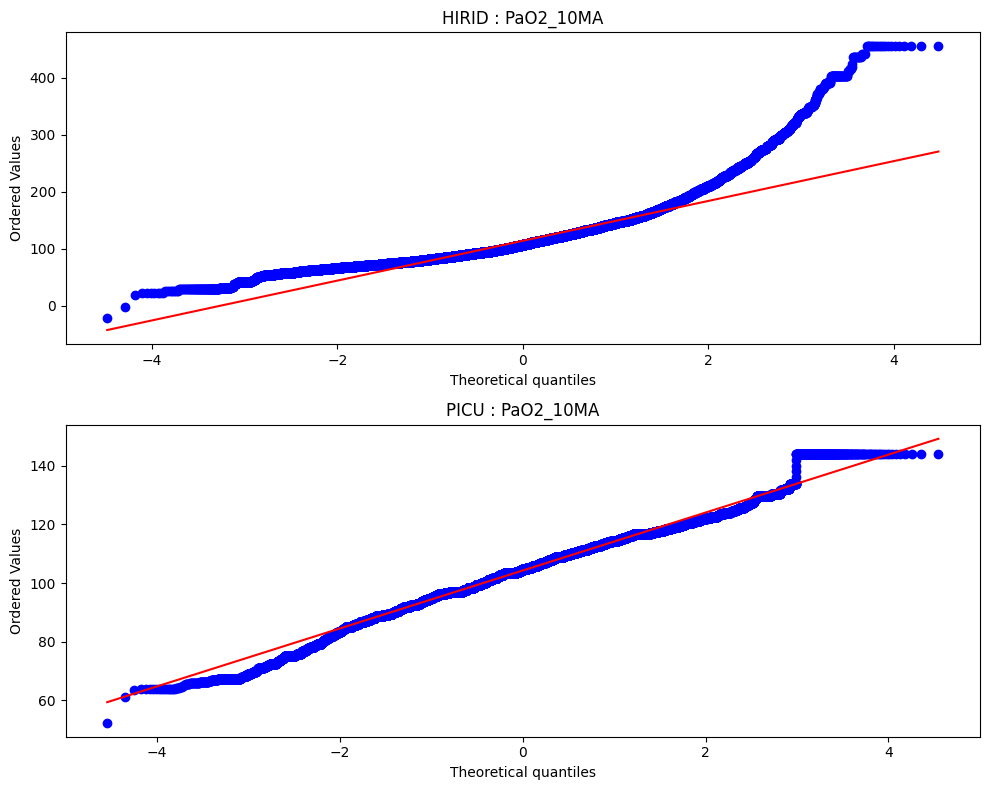

=== PaO2_20MA T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | picu normality : 0.0
T-Statistic: 19707893262.0  T_P-Value: 7.37581746790025e-234



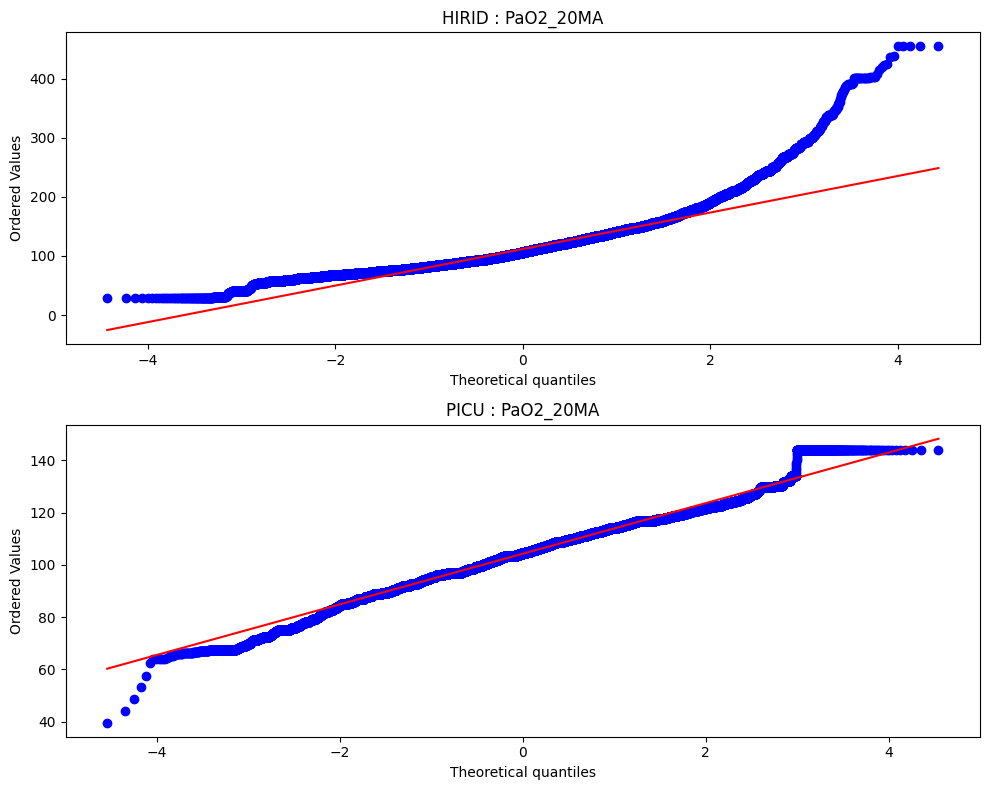

=== PaO2_RSI_3h T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | picu normality : 0.0
T-Statistic: 663147872.5  T_P-Value: 6.0846496375429286e-238



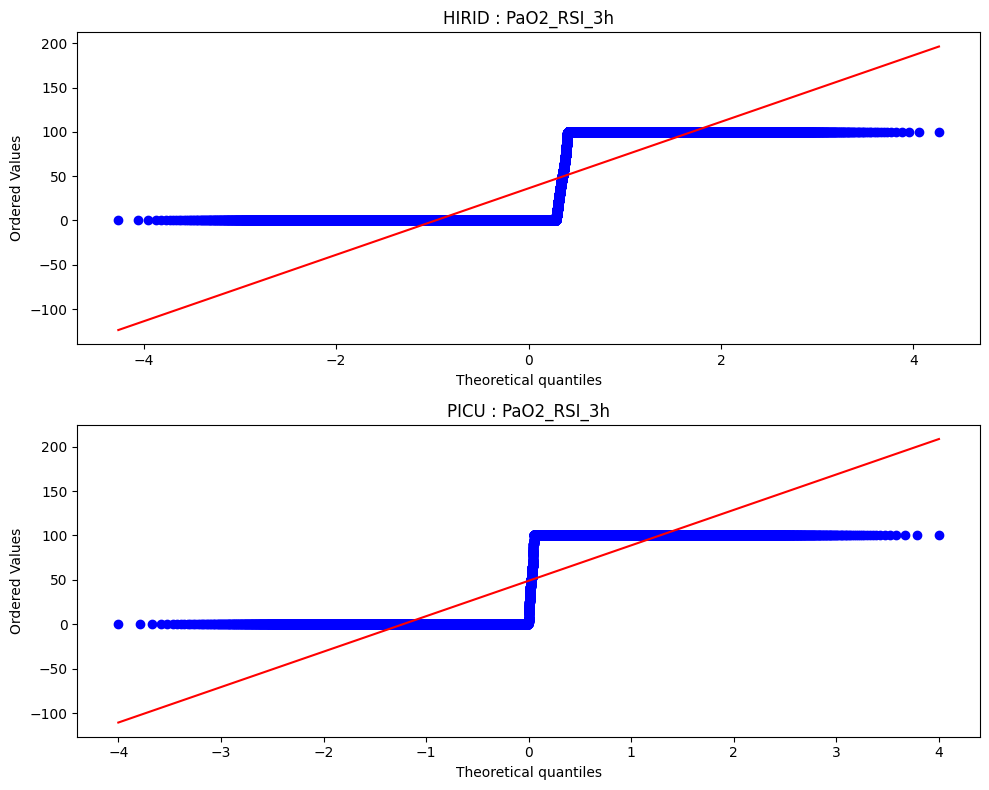

=== MAP_returns T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | picu normality : 0.0
T-Statistic: 32231614722.0  T_P-Value: 0.00030013426012195135



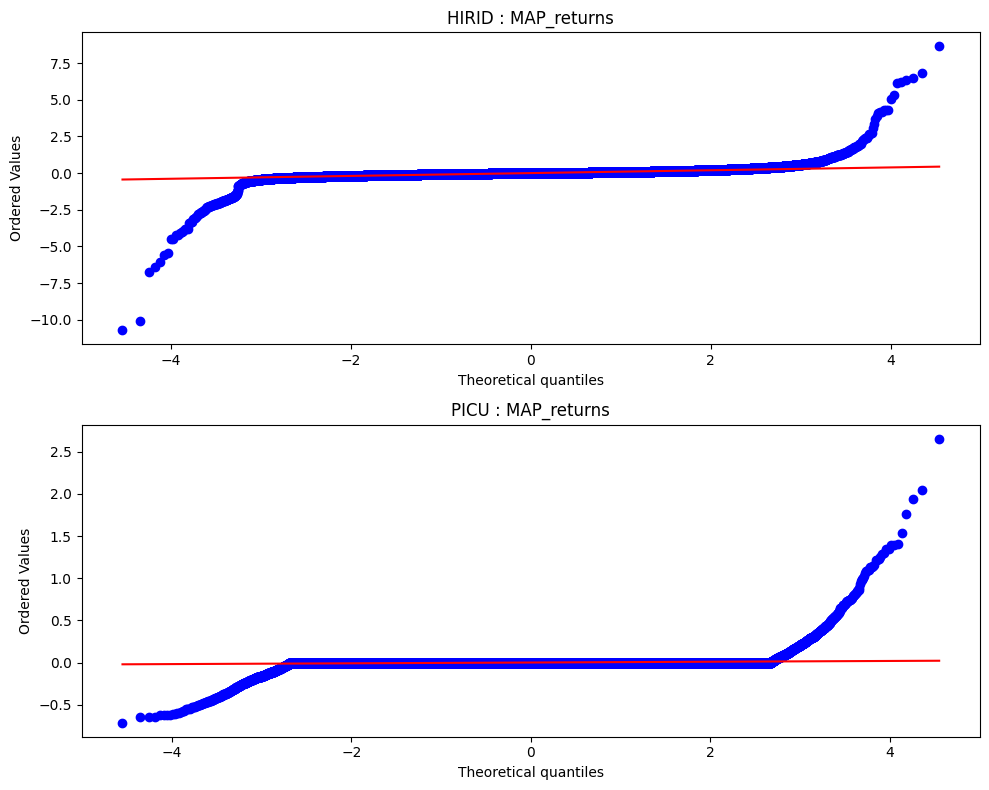

=== MAP_max_3h T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | picu normality : 0.0
T-Statistic: 41106680210.5  T_P-Value: 0.0



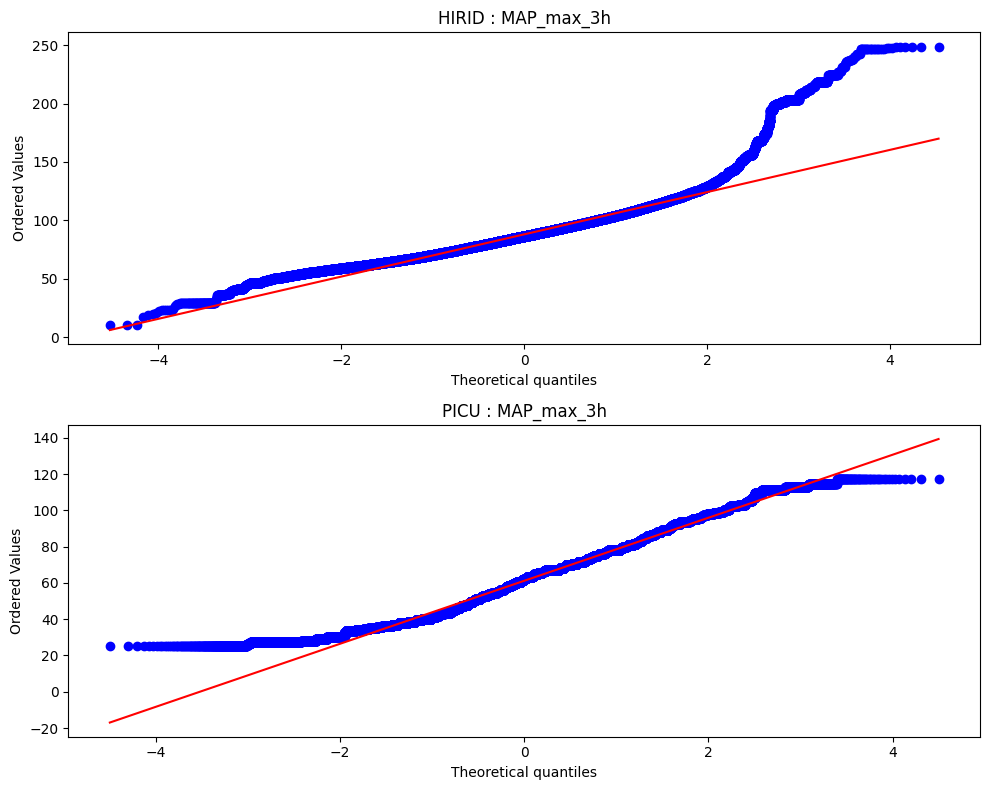

=== MAP_min_3h T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | picu normality : 0.0
T-Statistic: 37028127009.0  T_P-Value: 0.0



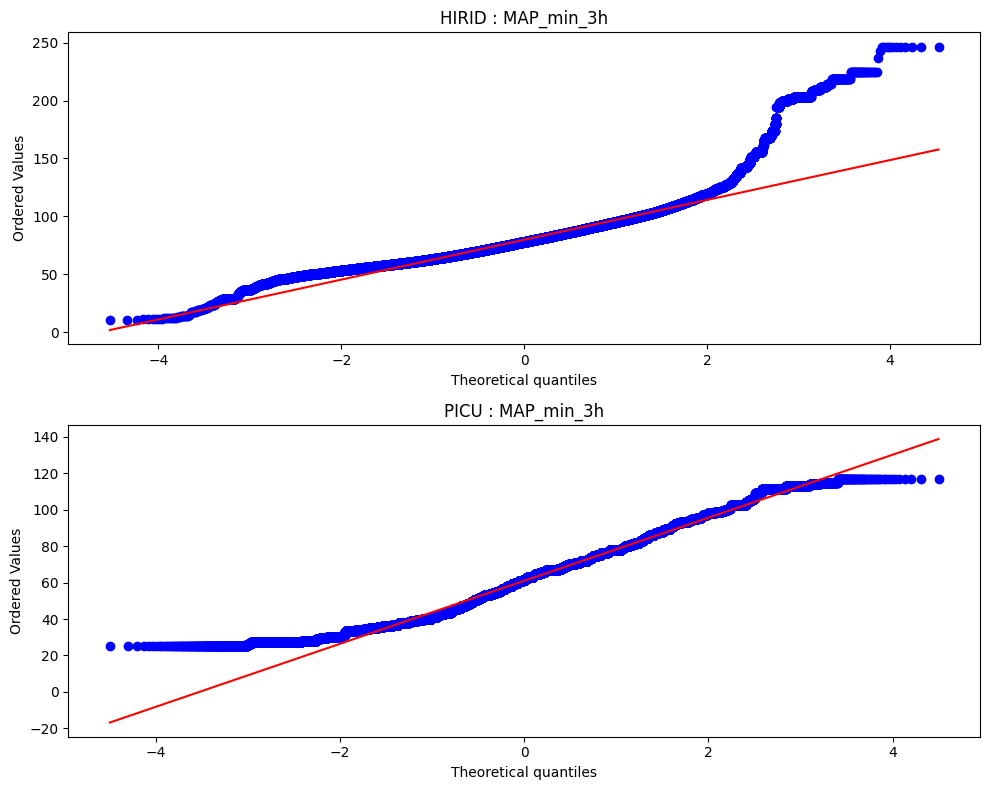

=== MAP_5MA T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | picu normality : 0.0
T-Statistic: 37354888941.5  T_P-Value: 0.0



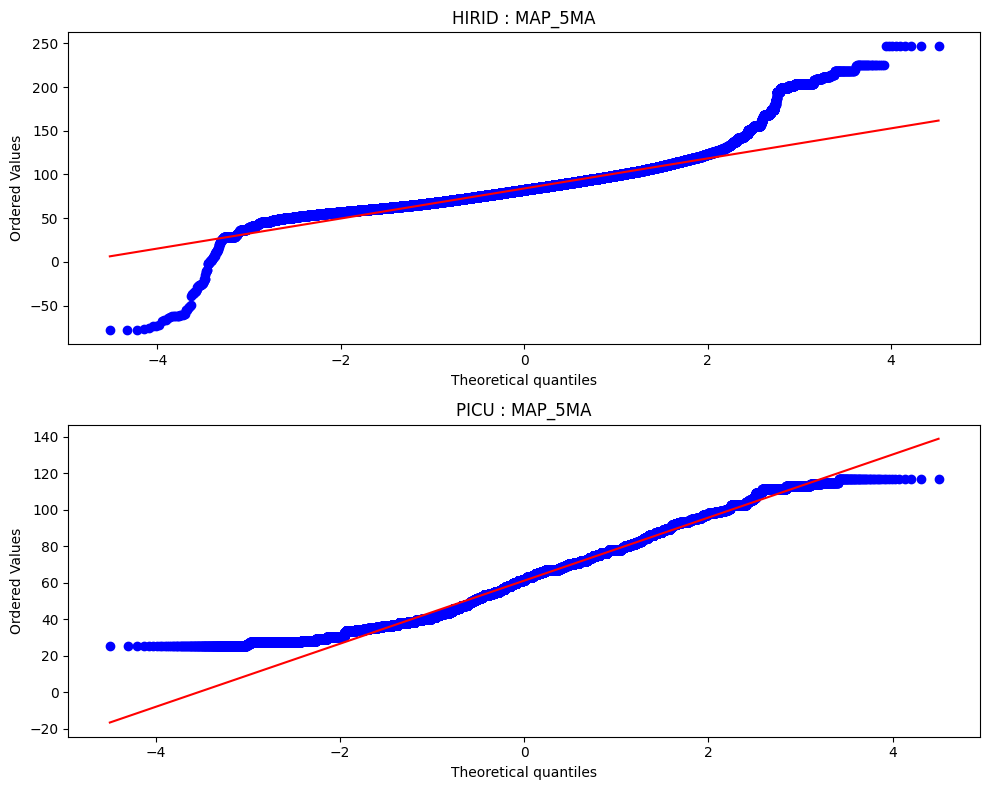

=== MAP_10MA T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | picu normality : 0.0
T-Statistic: 33178931985.5  T_P-Value: 0.0



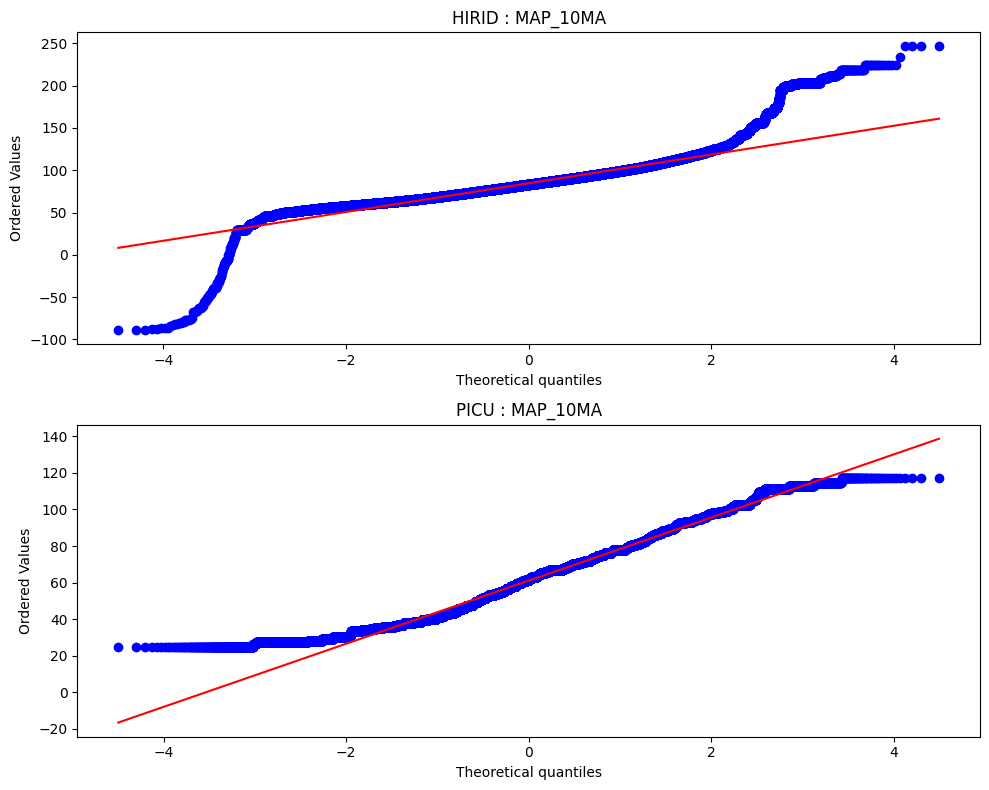

=== MAP_20MA T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | picu normality : 0.0
T-Statistic: 26442113193.5  T_P-Value: 0.0



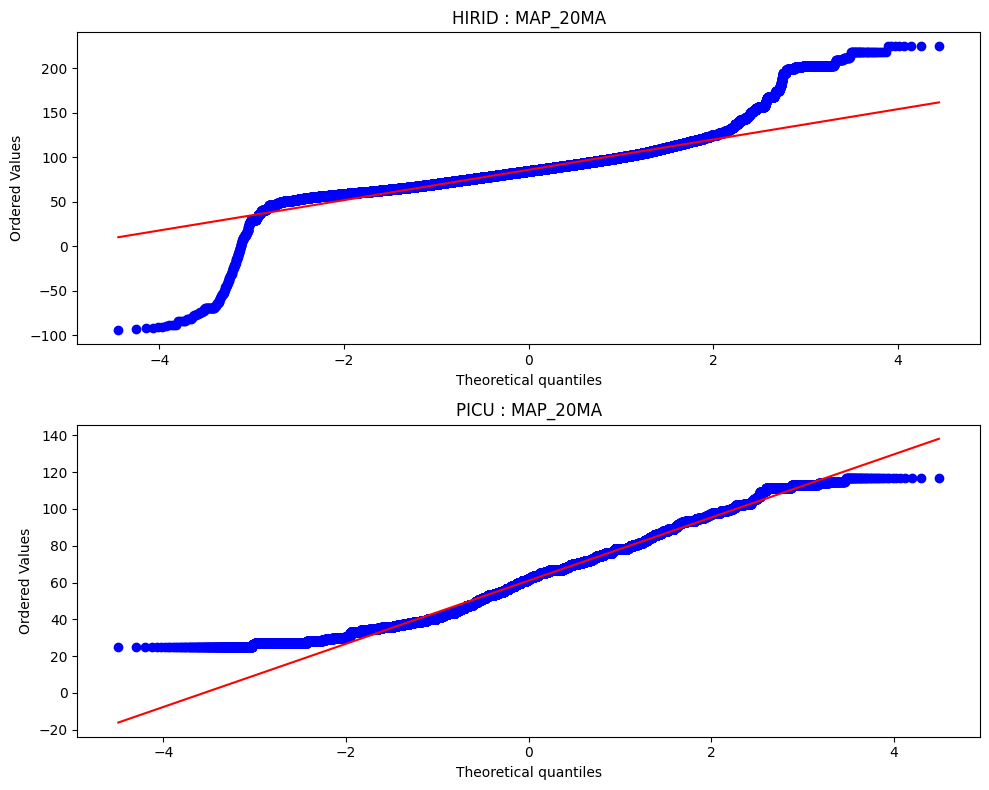

=== MAP_RSI_3h T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | picu normality : 0.0
T-Statistic: 512625858.5  T_P-Value: 0.9020923100525657



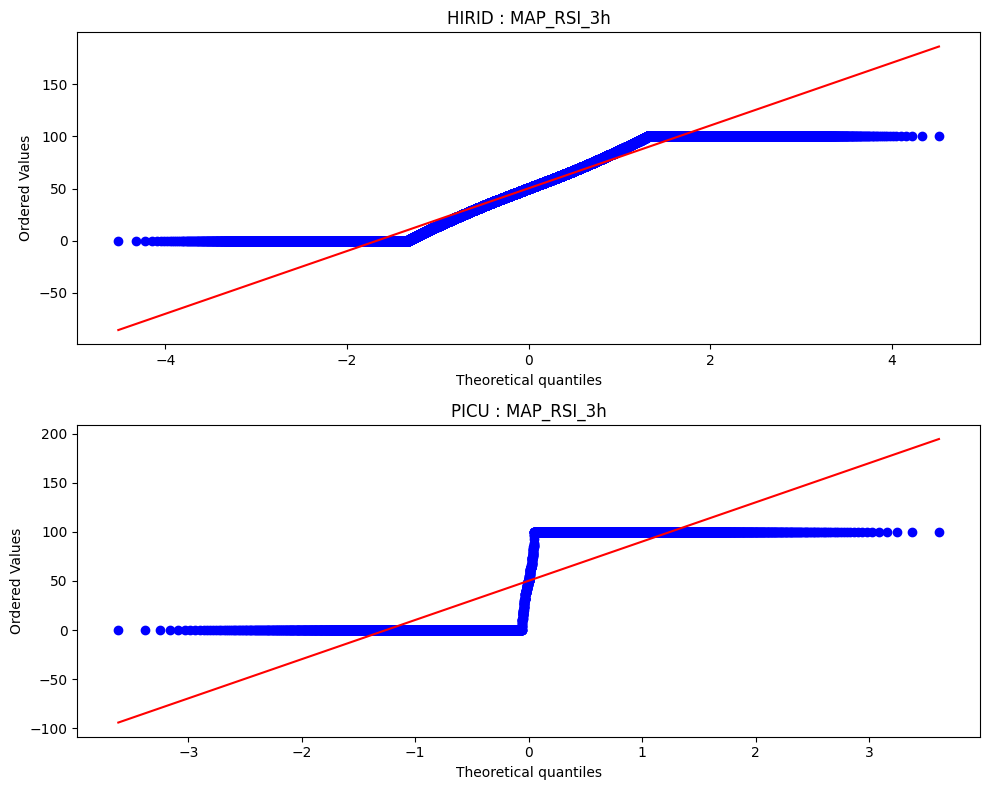

=== Respiratory_rate_returns T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | picu normality : 0.0
T-Statistic: 34225516711.0  T_P-Value: 1.171486775660535e-215



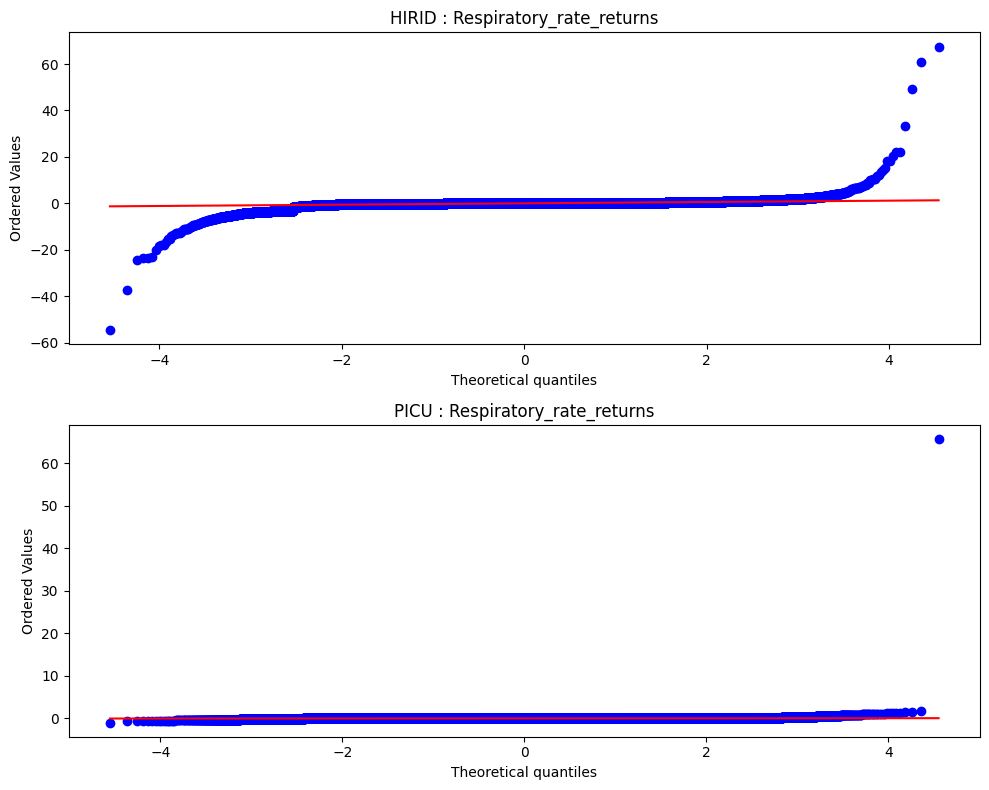

=== Respiratory_rate_max_3h T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | picu normality : 1.336847791076179e-293
T-Statistic: 4254418165.5  T_P-Value: 0.0



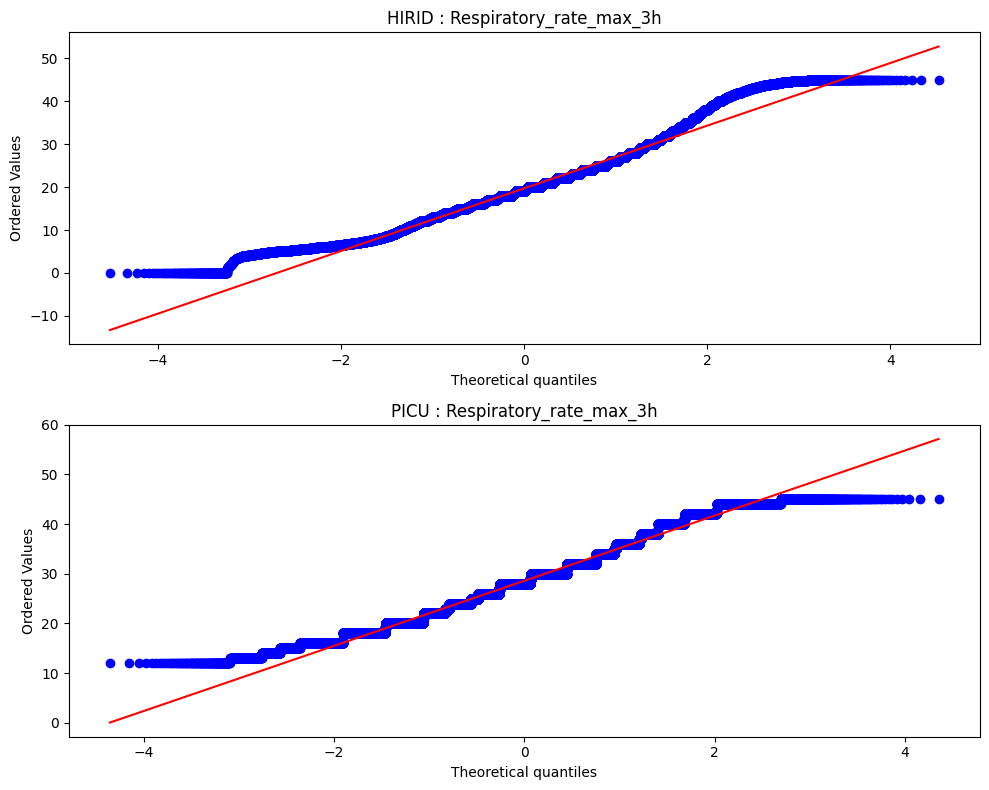

=== Respiratory_rate_min_3h T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | picu normality : 1.3017039283998634e-286
T-Statistic: 2002993509.0  T_P-Value: 0.0



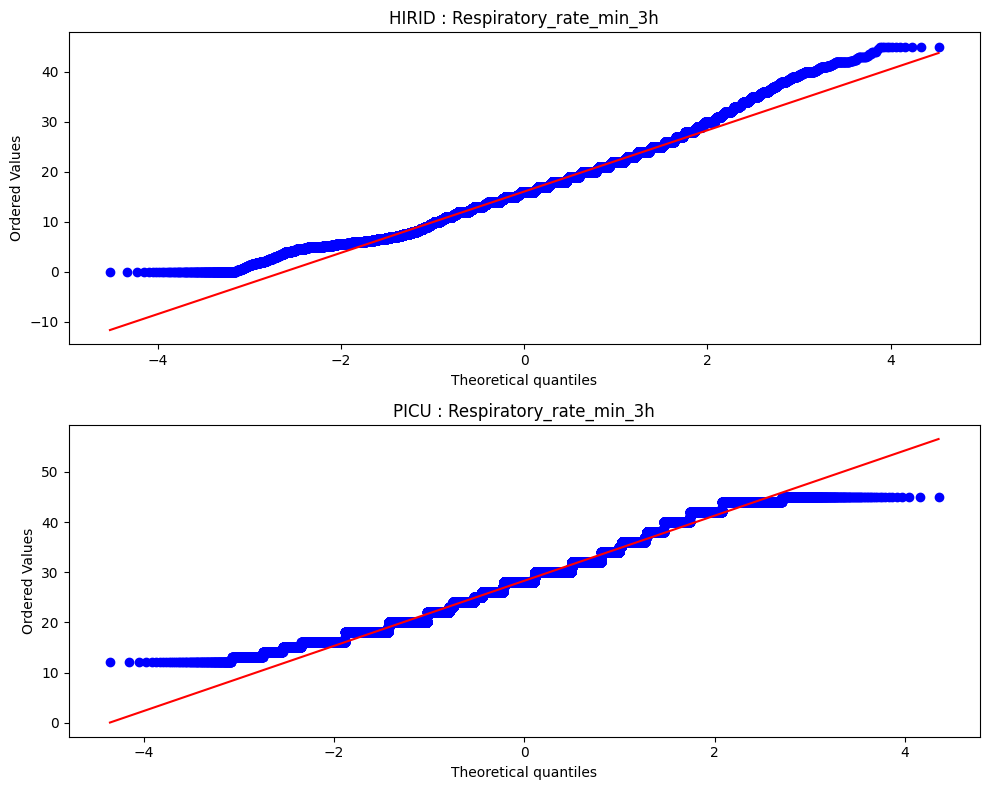

=== Respiratory_rate_5MA T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | picu normality : 9.349438100448784e-250
T-Statistic: 2432486243.5  T_P-Value: 0.0



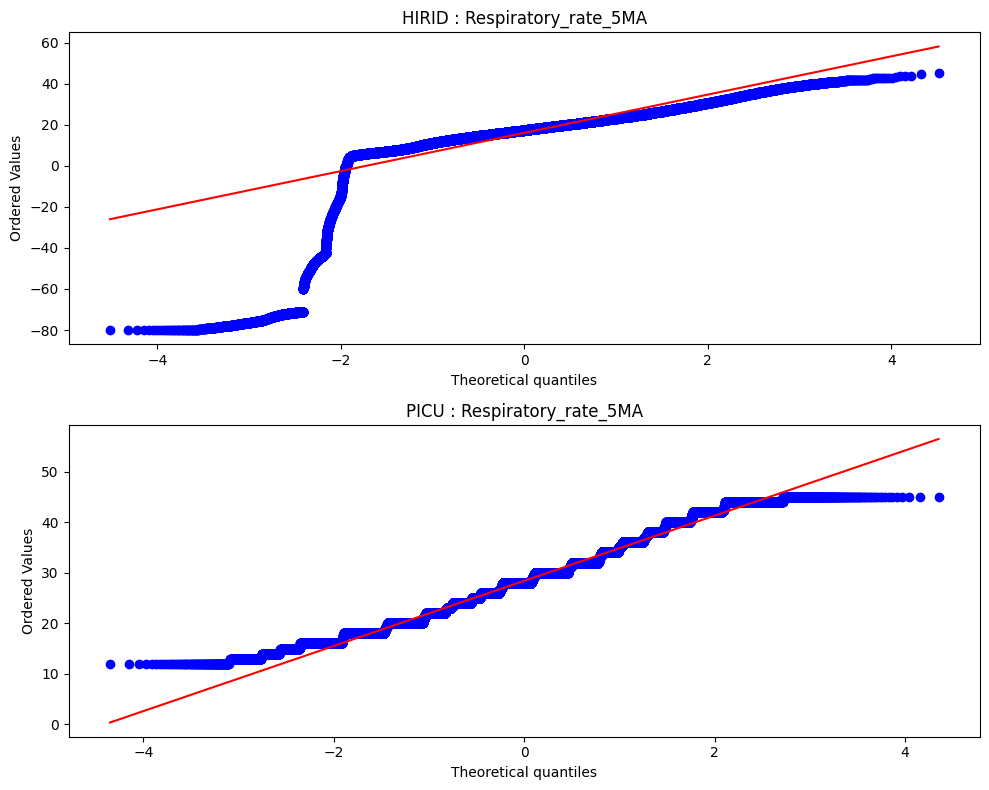

=== Respiratory_rate_10MA T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | picu normality : 1.5837107379082699e-204
T-Statistic: 1916540341.5  T_P-Value: 0.0



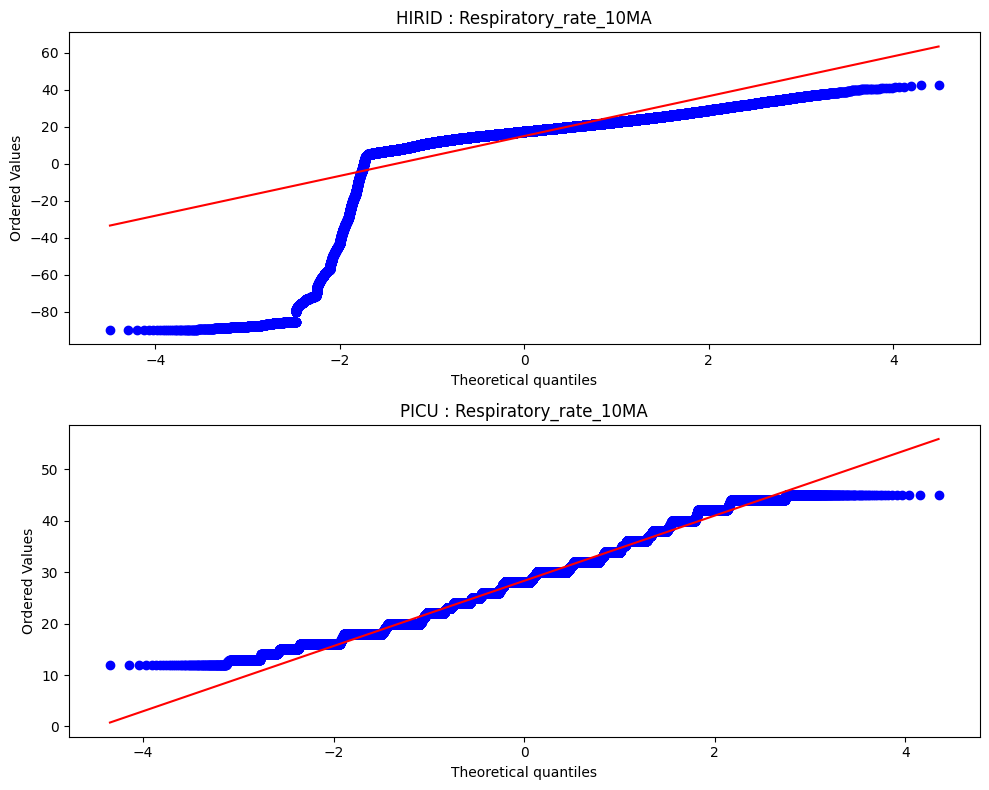

=== Respiratory_rate_20MA T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | picu normality : 6.341978305208154e-141
T-Statistic: 1321216765.5  T_P-Value: 0.0



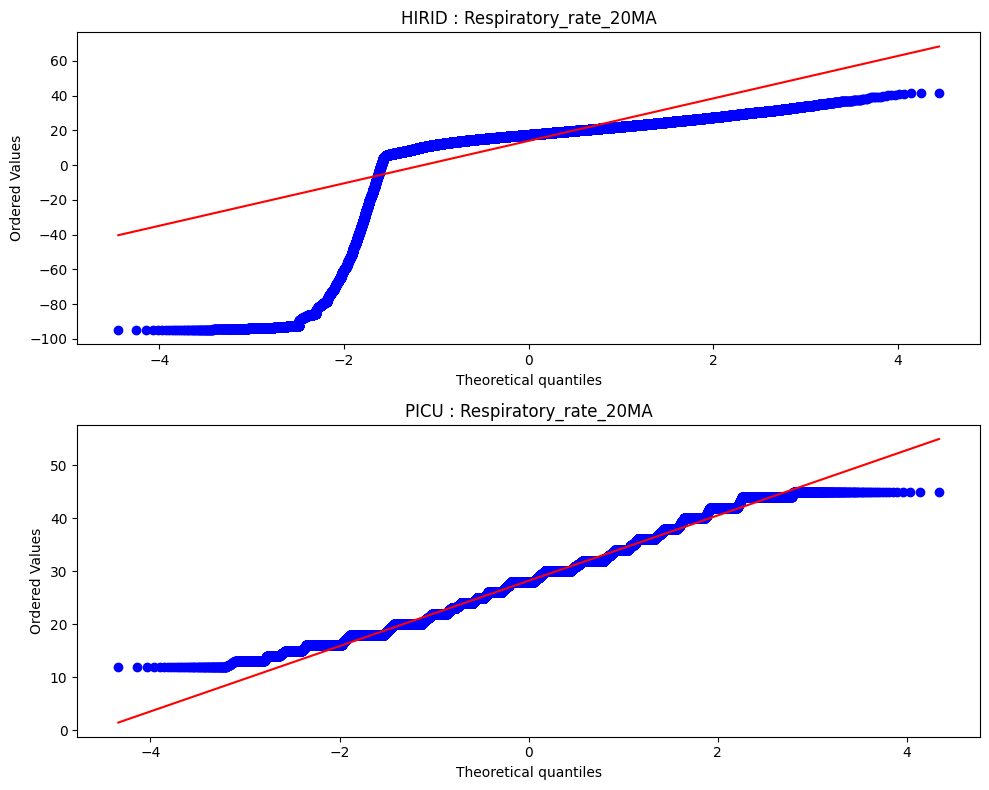

=== Respiratory_rate_RSI_3h T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | picu normality : 0.0
T-Statistic: 998711966.5  T_P-Value: 2.3544831263367922e-06



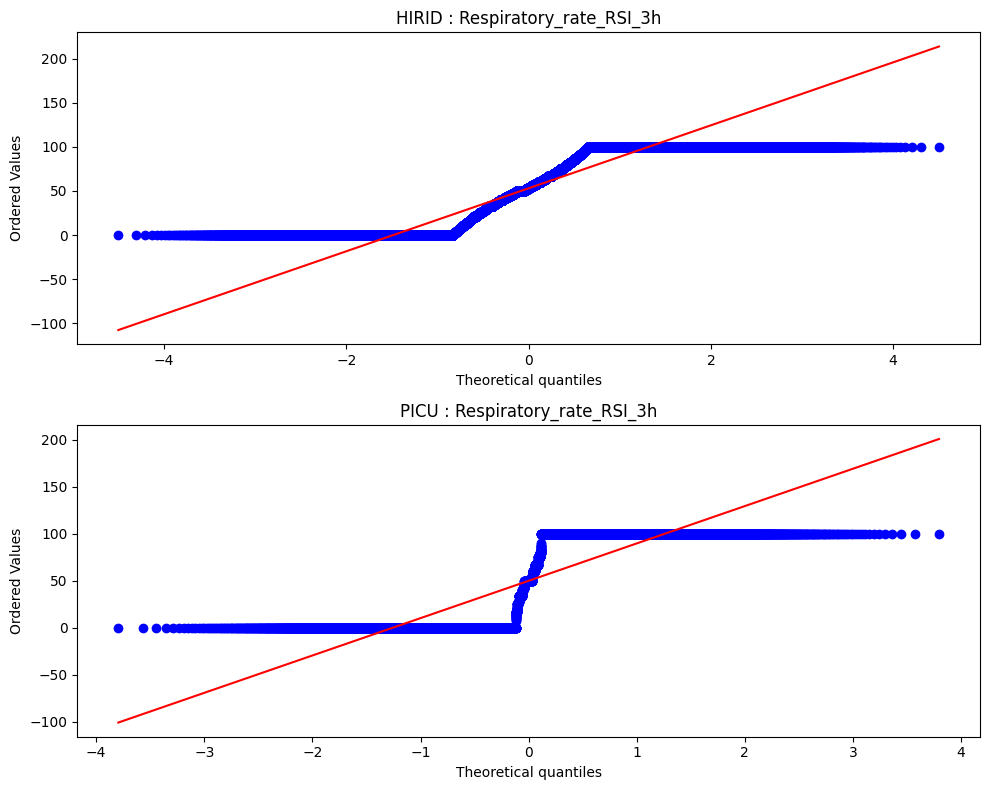

=== PP T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | picu normality : 0.0
T-Statistic: 46104427743.5  T_P-Value: 0.0



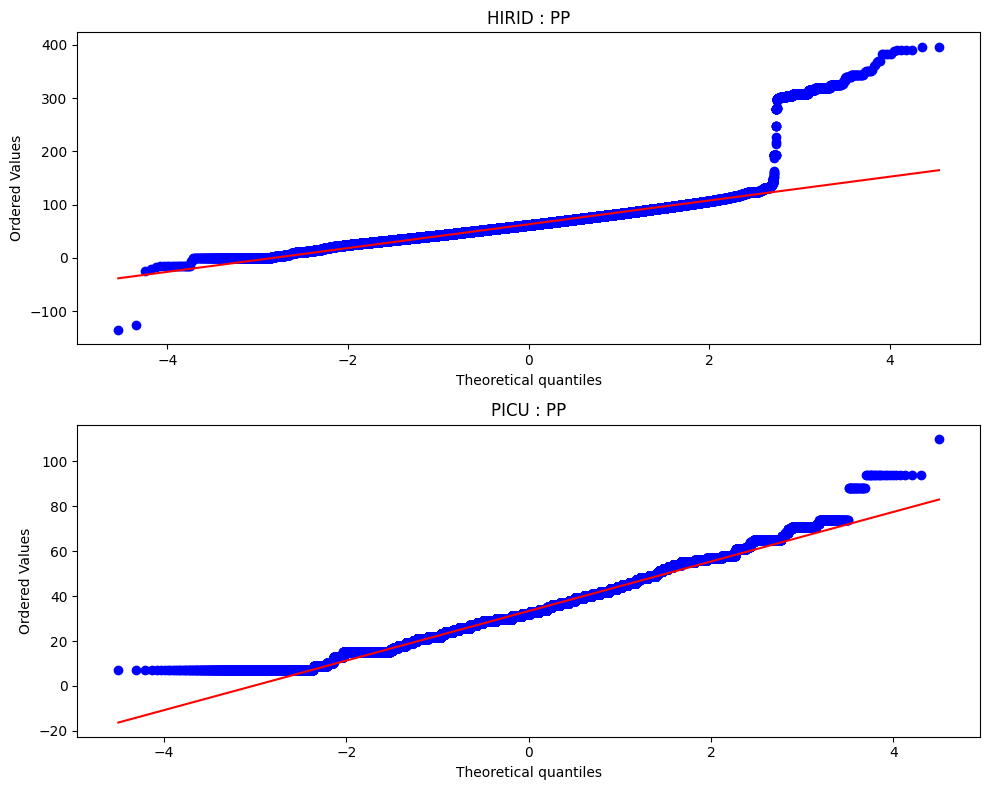

=== Creatinine T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | picu normality : 0.0
T-Statistic: 19033534.0  T_P-Value: 7.765761361458971e-295



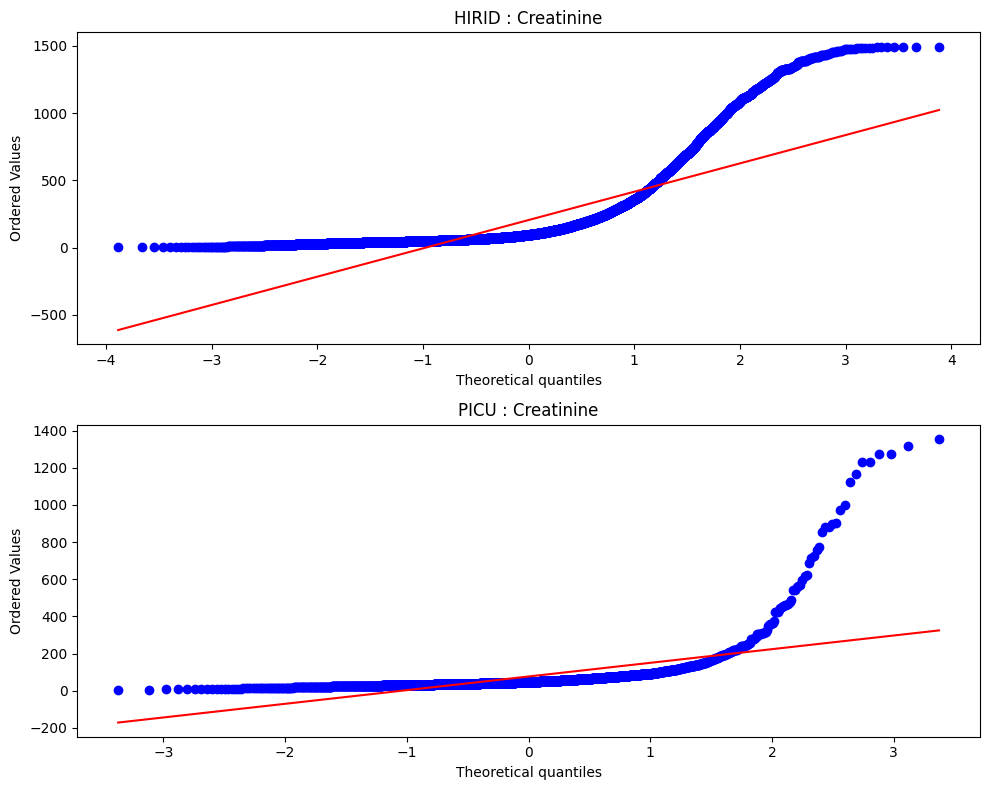

=== Lactate T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | picu normality : 0.0
T-Statistic: 139656464.0  T_P-Value: 1.3587709304747934e-59



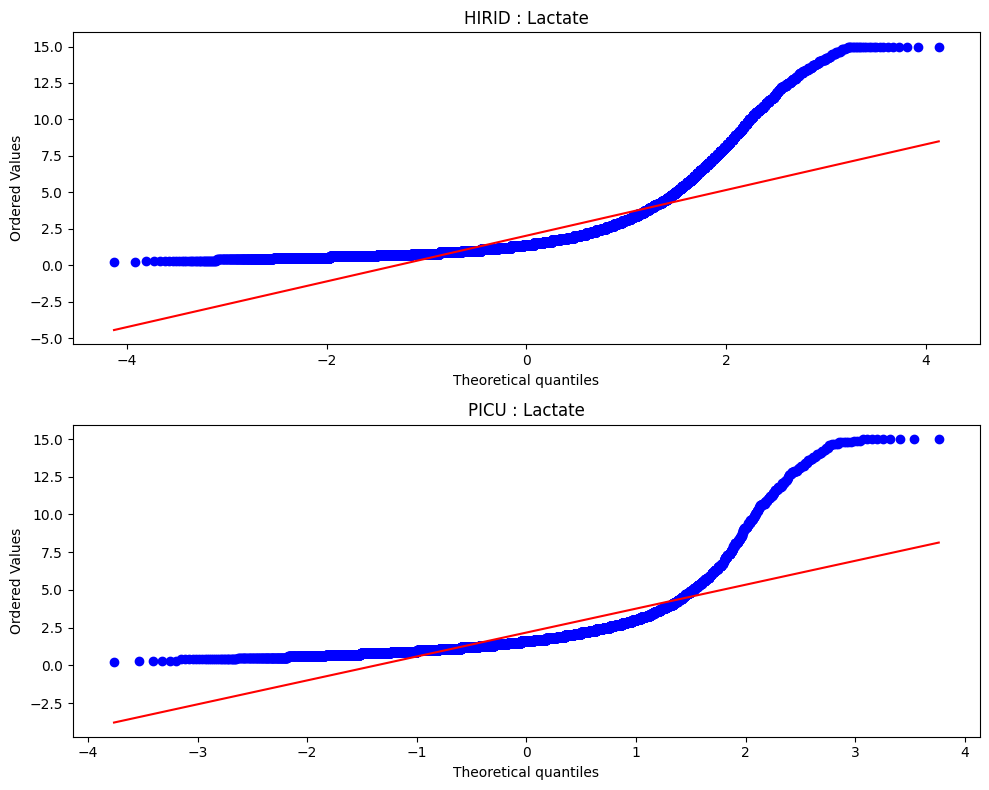

=== Platelet_Count T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | picu normality : 1.855026271687486e-99
T-Statistic: 30261611.5  T_P-Value: 1.5318702194825065e-148



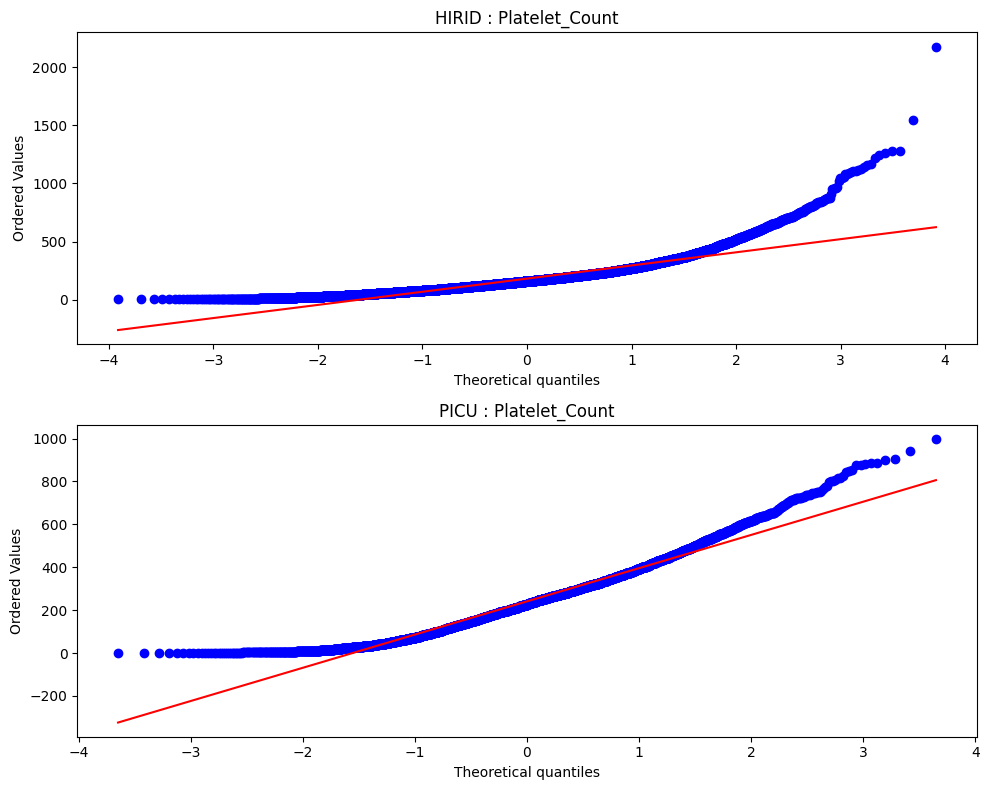

=== Bilirubin T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | picu normality : 3.16585983649598e-205
T-Statistic: 3592847.0  T_P-Value: 4.285290781990958e-196



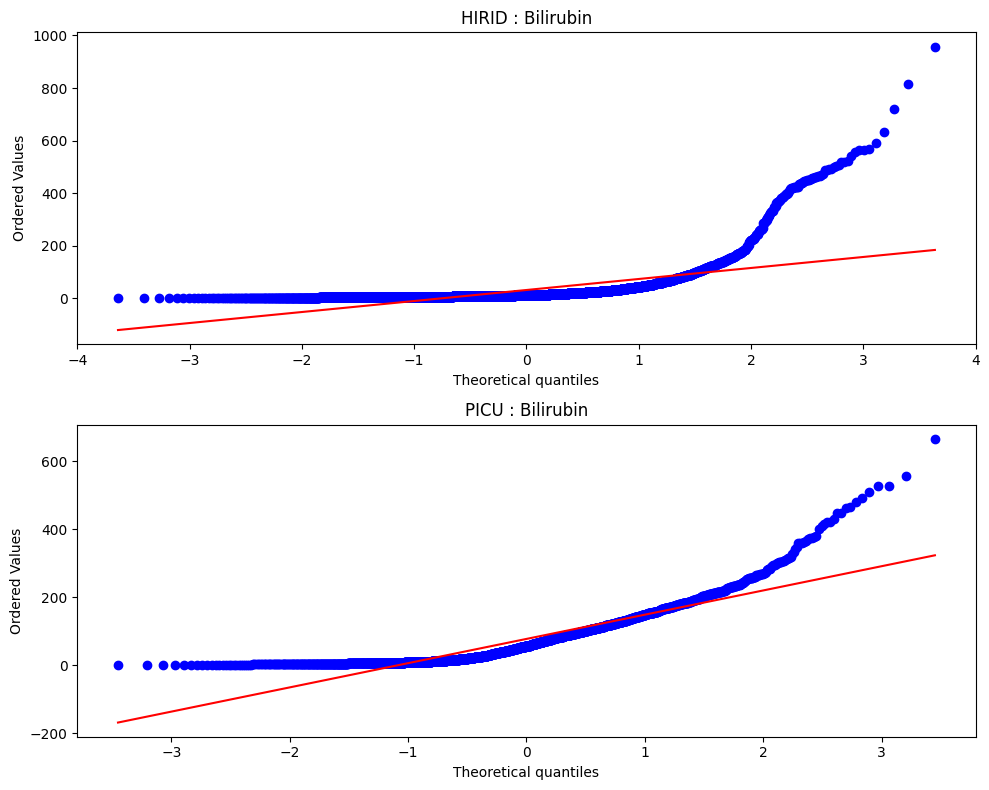

=== INR T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | picu normality : 2.2839778731307376e-296
T-Statistic: 9342400.5  T_P-Value: 3.3940305844124024e-18



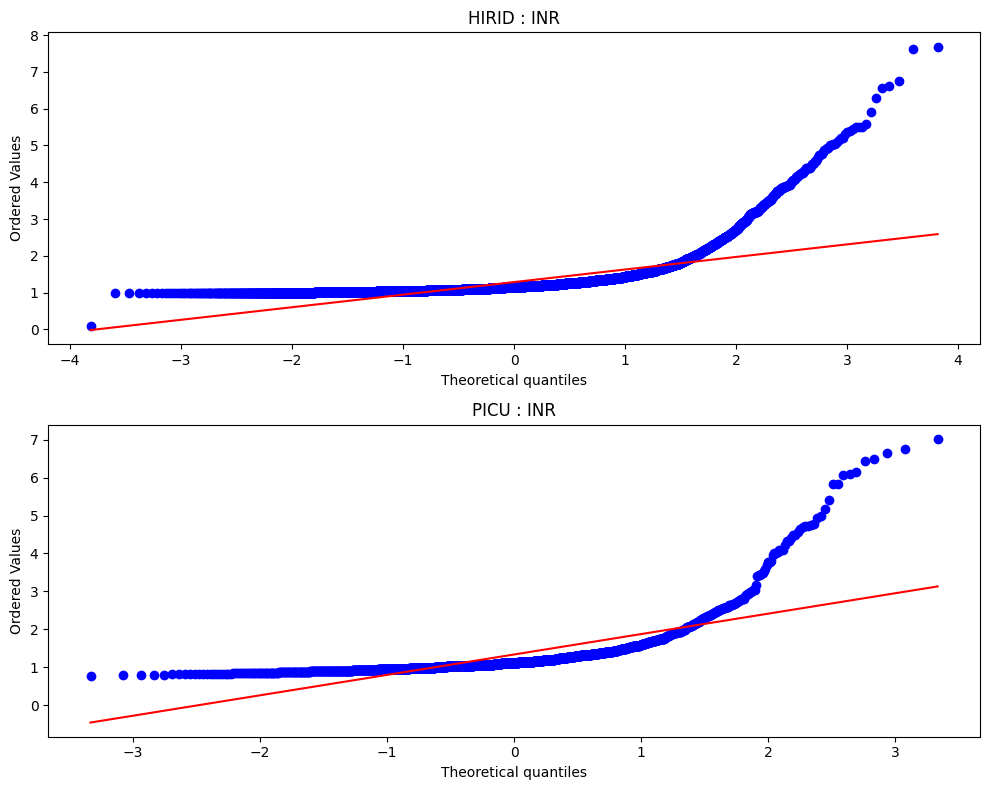

=== pH T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | picu normality : 0.0
T-Statistic: 185989769.5  T_P-Value: 1.1344674320107565e-257



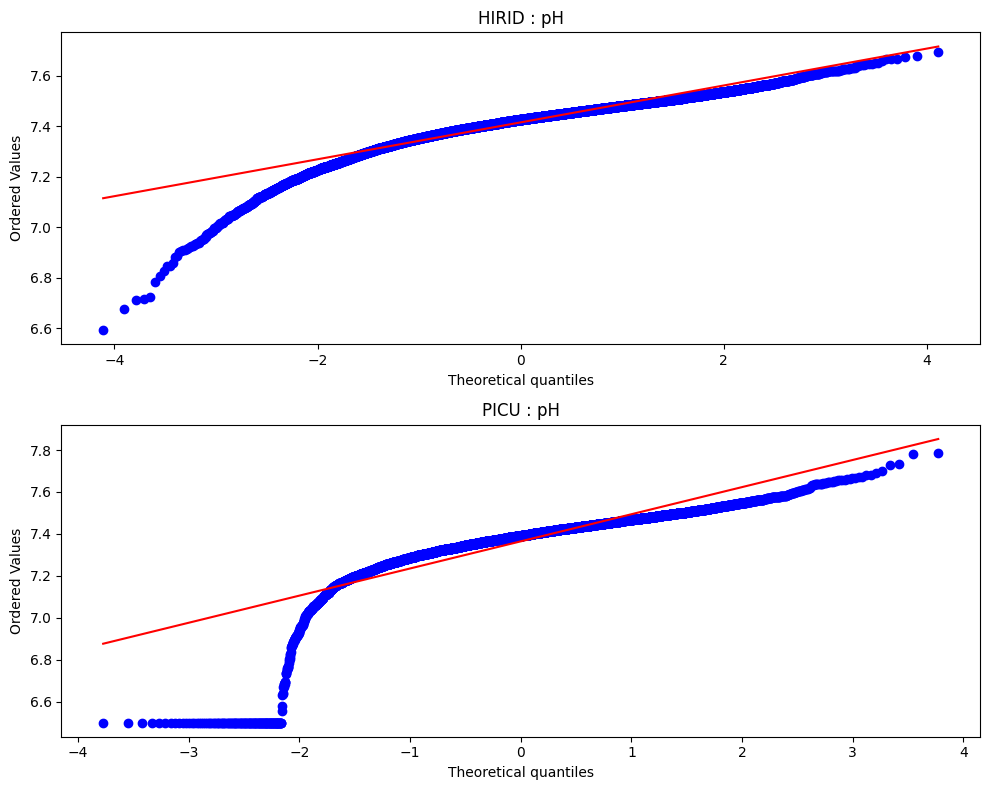

=== Fluid_Bolus T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | picu normality : 0.0
T-Statistic: 35835968505.5  T_P-Value: 0.0



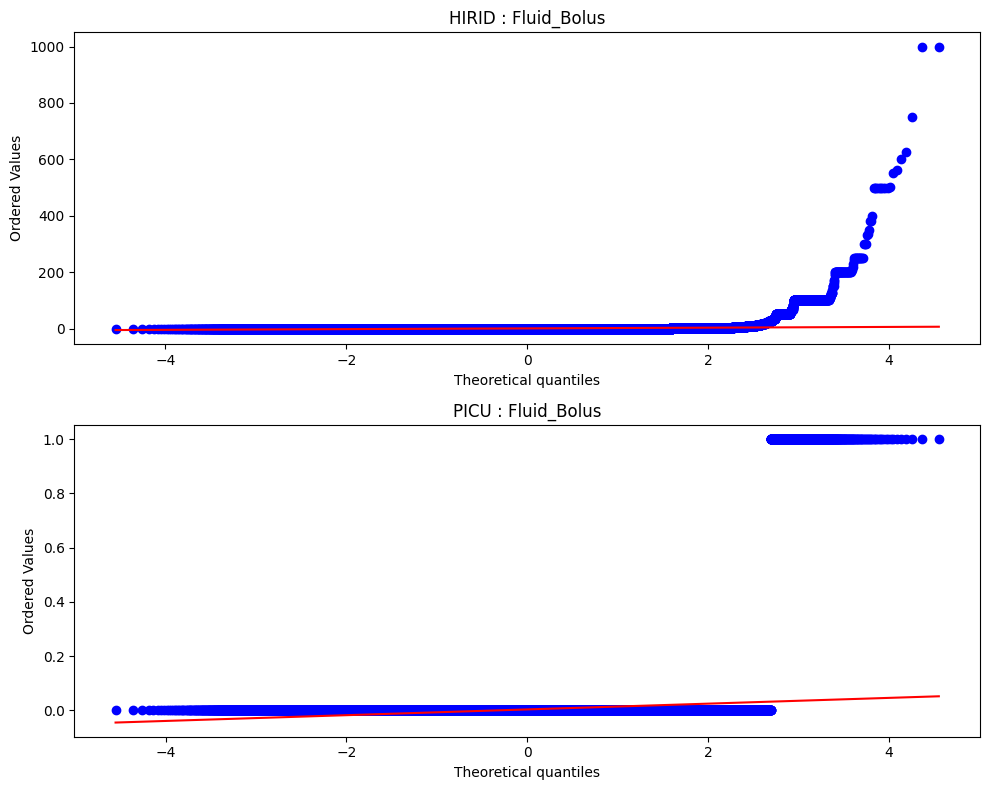

=== PaO2/FiO2 T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | picu normality : 0.0
T-Statistic: 3985270887.0  T_P-Value: 0.0



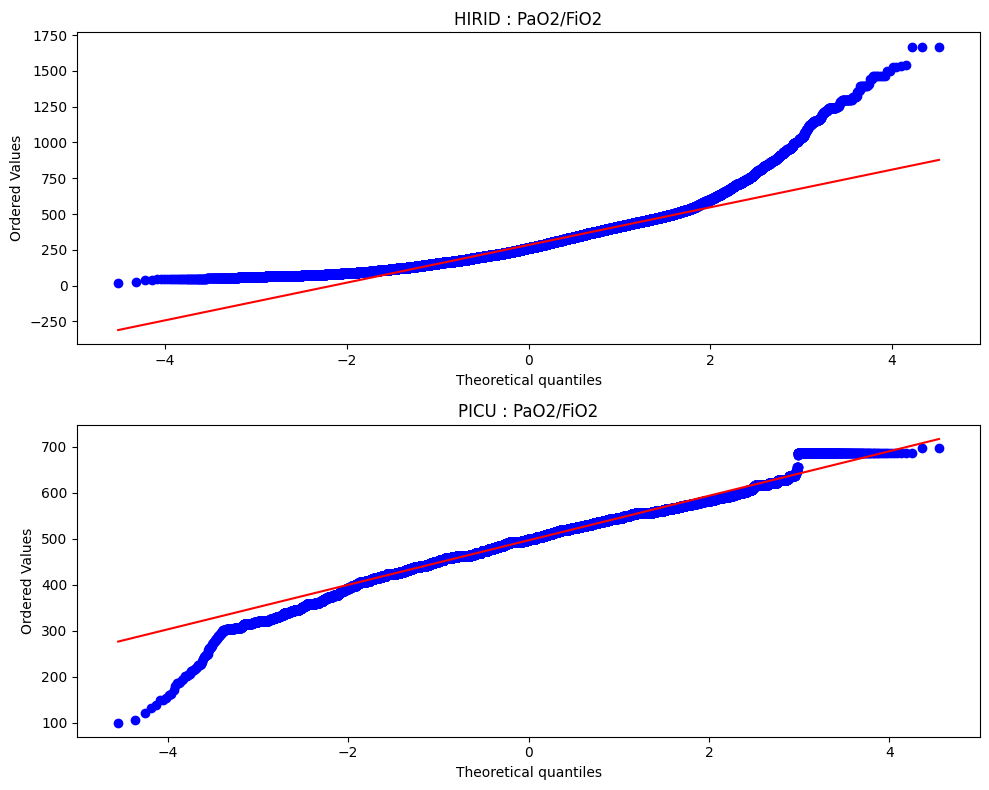

=== Age T-Test Result ===
Normality is satisfied
hirid normality : 0.0 | picu normality : nan
T-Statistic: 1722.4361070204636  T_P-Value: 0.0



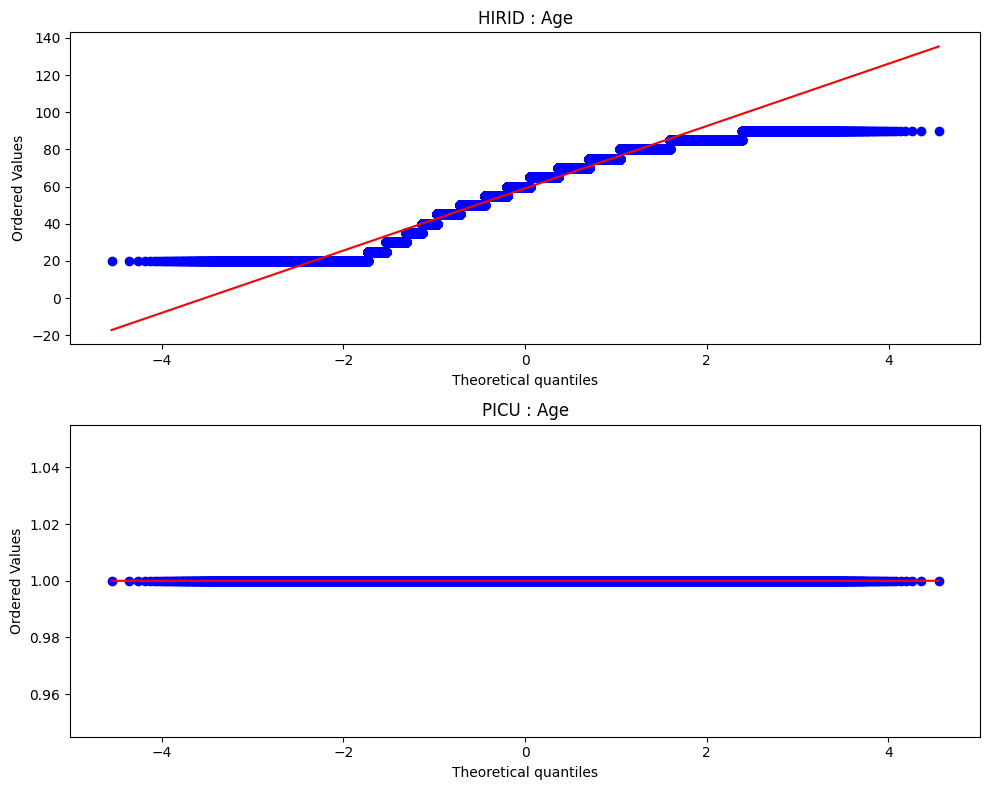

In [19]:
### HIRID vs PICU 가설검정
import matplotlib.pyplot as plt
import seaborn as sns

p_t_values = []
p_levene_values = []
diff_true = {}
diff_false = {}
alpha = 0.05

for i in cont_cols:
    try:
        print(f"=== {i} T-Test Result ===")

        hirid_values = hirid[hirid.loc[:,i] != -100].loc[:,i]
        picu_values = picu[picu.loc[:,i] != -100].loc[:,i]

        # Normality Test (정규성 검정)
        hirid_normal_test_statistic, hirid_normal_test_p_values = stats.normaltest(hirid_values)
        picu_normal_test_statistic, picu_normal_test_p_values = stats.normaltest(picu_values)
        
        if hirid_normal_test_p_values < 0.05 and picu_normal_test_p_values < 0.05:
            ## 정규성을 만족하지 않는다면 맨 휘트니 검정을 수행.
            print('Normality is not satisfied')
            t_statistic,p = stats.mannwhitneyu(hirid_values, picu_values)
            p_t_values.append(p)

        else:
            print('Normality is satisfied')
            f_statistic, p_levene = stats.levene(hirid_values, picu_values) # 등분산성 검정
            p_levene_values.append(p_levene)

            if p_levene < alpha:
                t_statistic,p = stats.ttest_ind(hirid_values, picu_values, equal_var=False) # 독립 표본 t-검정 수행, 이분산 상황
                p_t_values.append(p)
            else:
                t_statistic,p = stats.ttest_ind(hirid_values, picu_values, equal_var=True) # 독립 표본 t-검정 수행, 등분산 상황
                p_t_values.append(p)
        
        print(f'hirid normality : {hirid_normal_test_p_values} | picu normality : {picu_normal_test_p_values}')
        print("T-Statistic:", t_statistic, f' T_P-Value: {p}')
        print()

        fig, ax = plt.subplots(2,1,figsize =(10,8))
        stats.probplot(hirid_values, plot = ax[0])
        stats.probplot(picu_values, plot = ax[1])
        ax[0].set_title(f'HIRID : {i}')
        ax[1].set_title(f'PICU : {i}')
        plt.tight_layout()
        plt.show()

        if p < alpha:
            diff_true[i] = [t_statistic, p]
        else:
            diff_false[i] = [t_statistic, p]
    except:
        print(f"=== {i} T-Test Result Pass!!! ===")
        continue
    
# # 본페로니 교정 적용 
# reject, pvals_corrected, _, _ = sm.stats.multipletests(p_t_values, alpha=0.05, method='bonferroni')

# # 결과 출력
# print(reject)  # 교정 후 기각 여부: True는 귀무 가설이 기각됨을 의미, False는 기각되지 않음을 의미
# print(pvals_corrected)  # 교정된 p-값

# # 기각되지 않은 column 확인
# for col,i in zip(cont_cols,reject):
#     if not i:
#         print(f'After bonferroni the {col} is failed to add null hypothesis')
    


In [20]:
# Sofa_Cardiovascular 컬럼은 mimic과 eicu 모두 값이 동일함.
print(f'이상치 제거 전 분포의 차이가 존재함을 보이는 변수의 개수 {len(diff_true)} / {len(cont_cols)} 개')

p_list = np.mean([p for t,p in diff_true.values()])
print(f'p-value의 평균 값 : {p_list}')

이상치 제거 전 분포의 차이가 존재함을 보이는 변수의 개수 46 / 49 개
p-value의 평균 값 : 6.575842244528077e-06


=== Time_since_ICU_admission T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | mimic normality : 0.0
T-Statistic: 12295563871.0  T_P-Value: 0.0



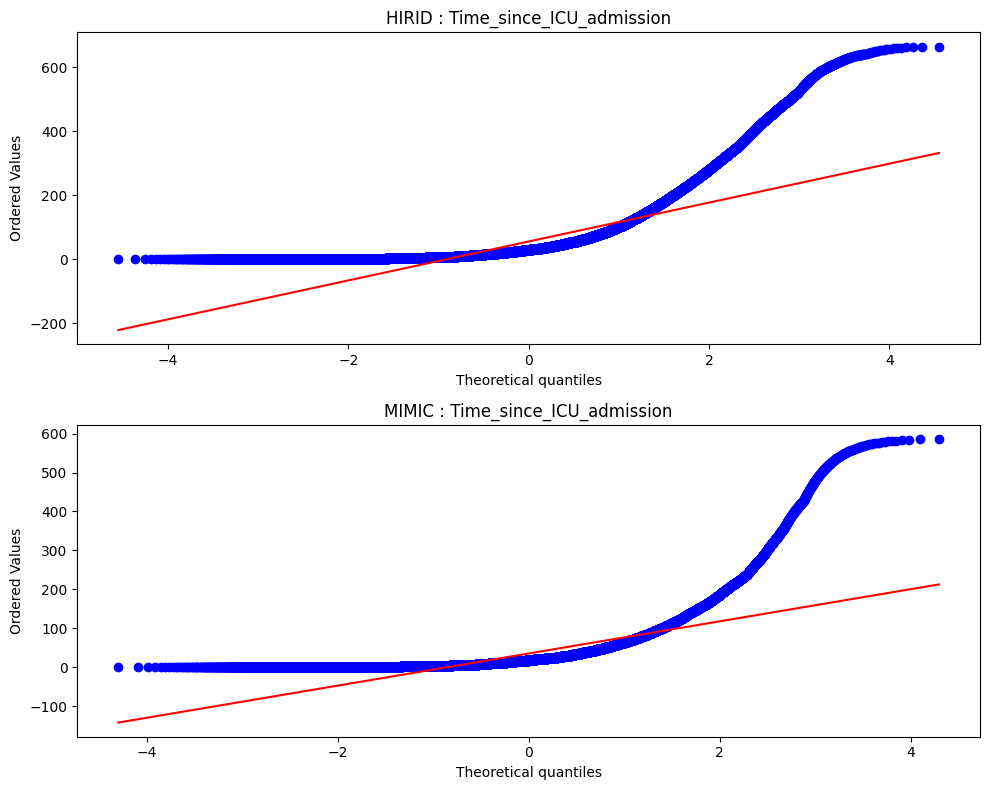

=== ABPd T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | mimic normality : 0.0
T-Statistic: 8024165519.0  T_P-Value: 0.0



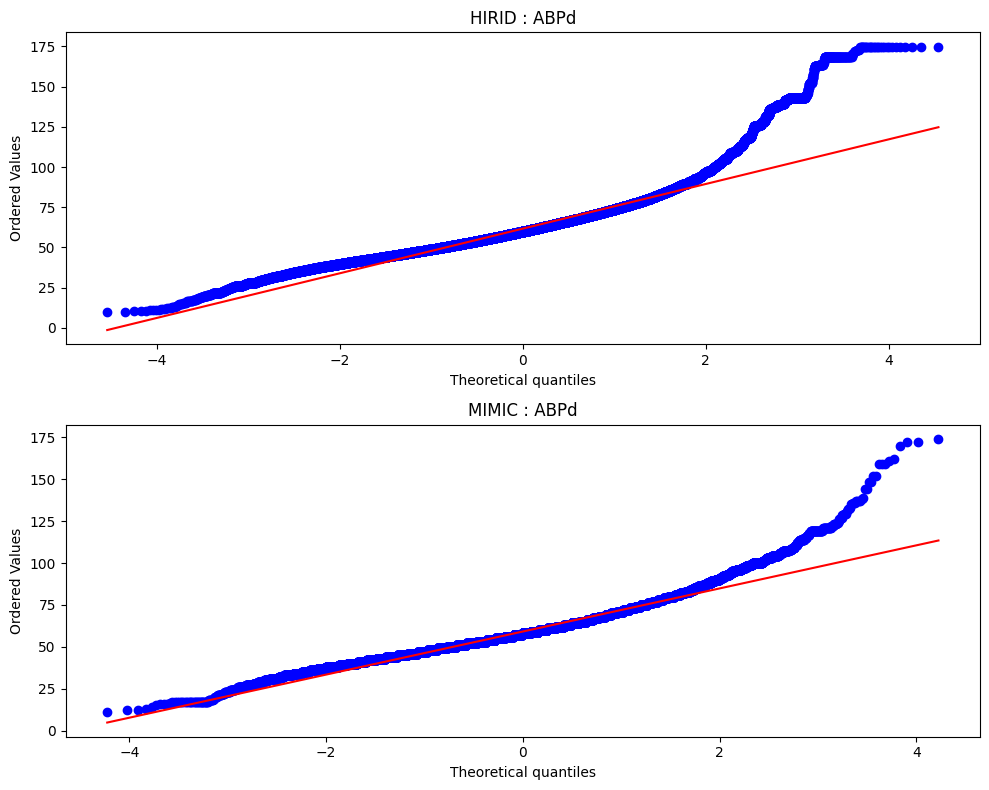

=== ABPs T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | mimic normality : 0.0
T-Statistic: 8969202381.0  T_P-Value: 0.0



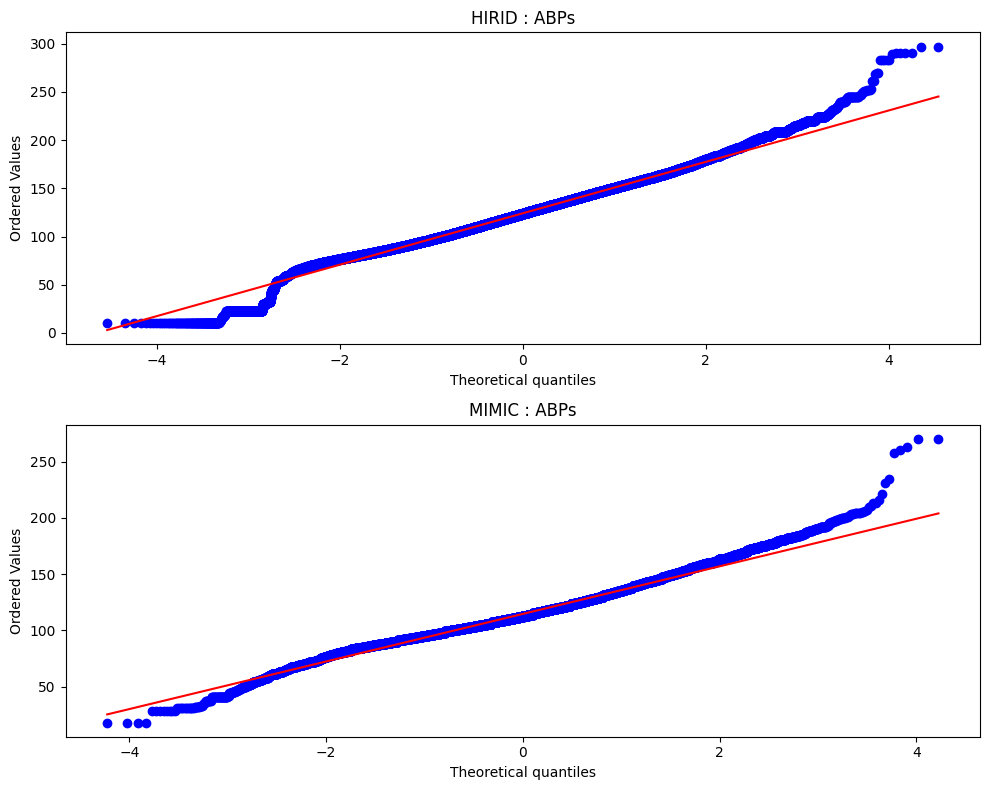

=== FiO2 T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | mimic normality : 0.0
T-Statistic: 6141070679.5  T_P-Value: 0.0



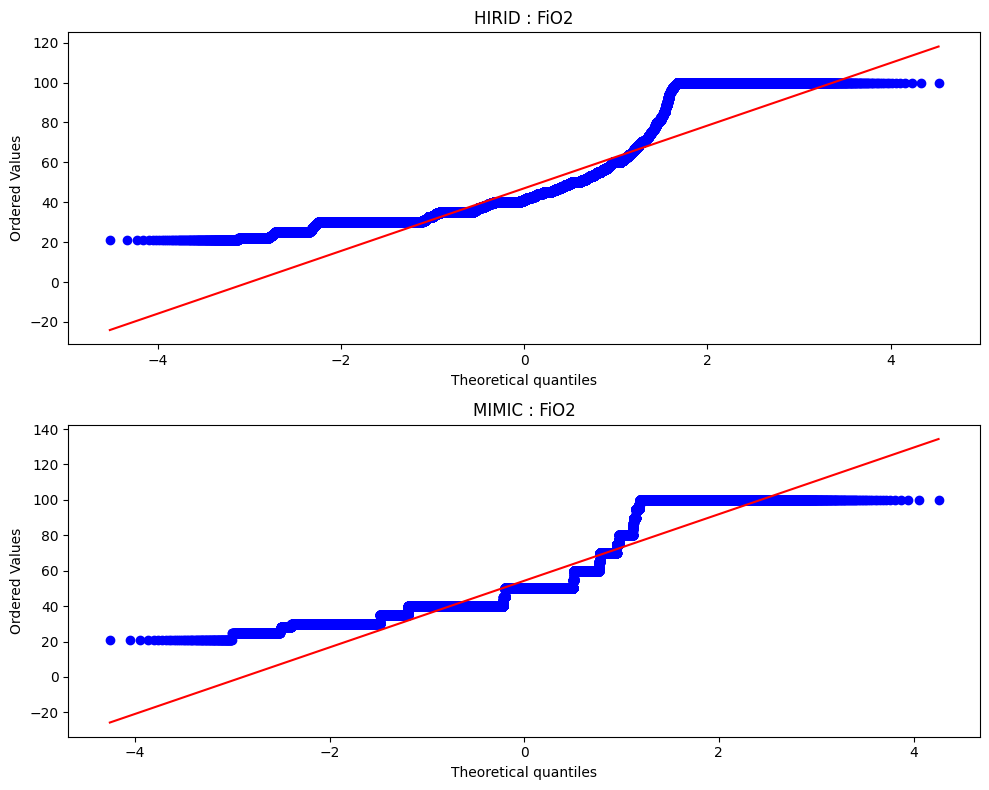

=== HR T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | mimic normality : 0.0
T-Statistic: 7965379873.5  T_P-Value: 0.0



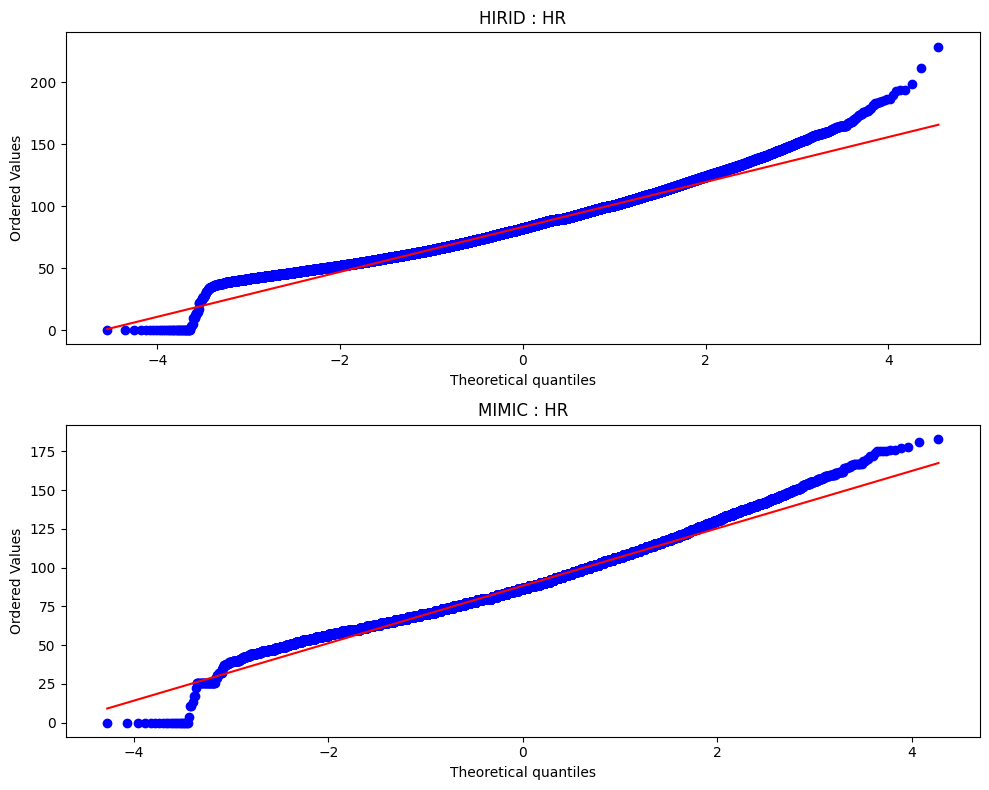

=== MAP T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | mimic normality : 0.0
T-Statistic: 8724207375.0  T_P-Value: 0.0



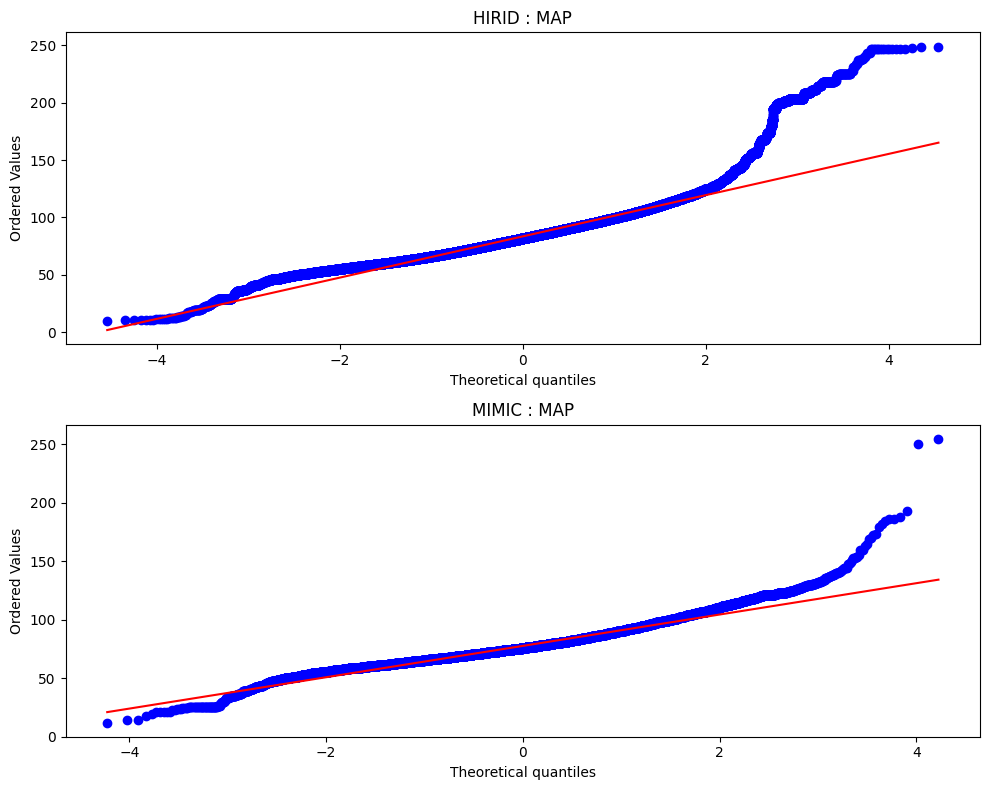

=== PaO2 T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | mimic normality : 0.0
T-Statistic: 6463724127.5  T_P-Value: 0.0



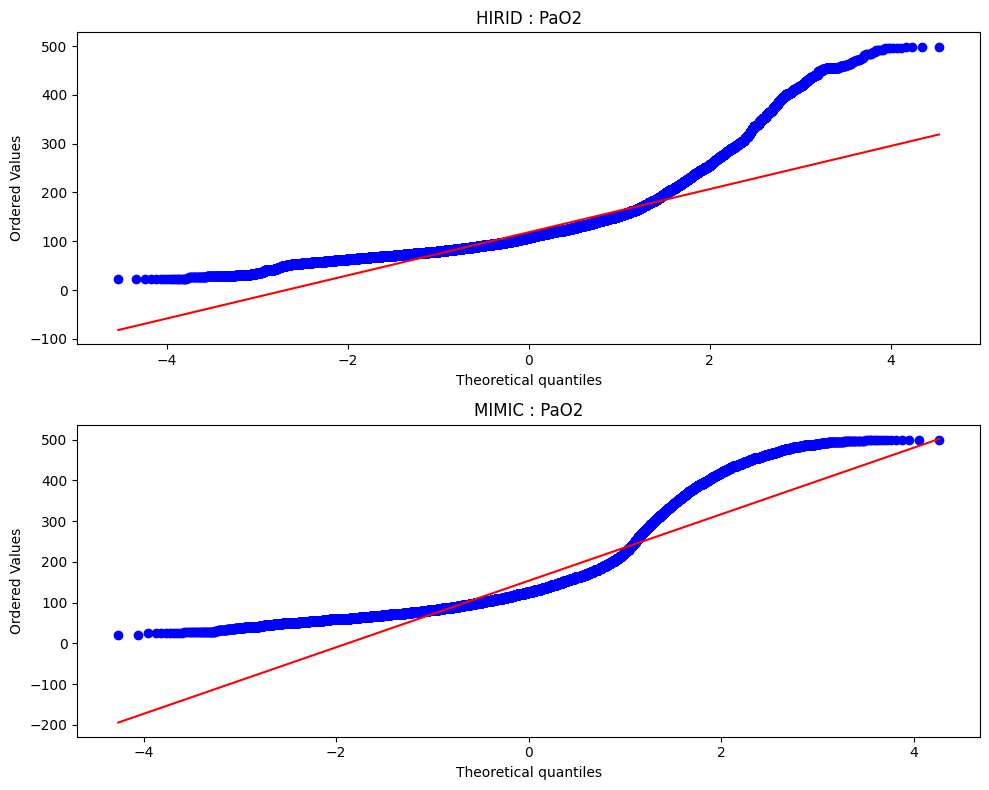

=== Respiratory_rate T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | mimic normality : 0.0
T-Statistic: 7116280142.0  T_P-Value: 0.0



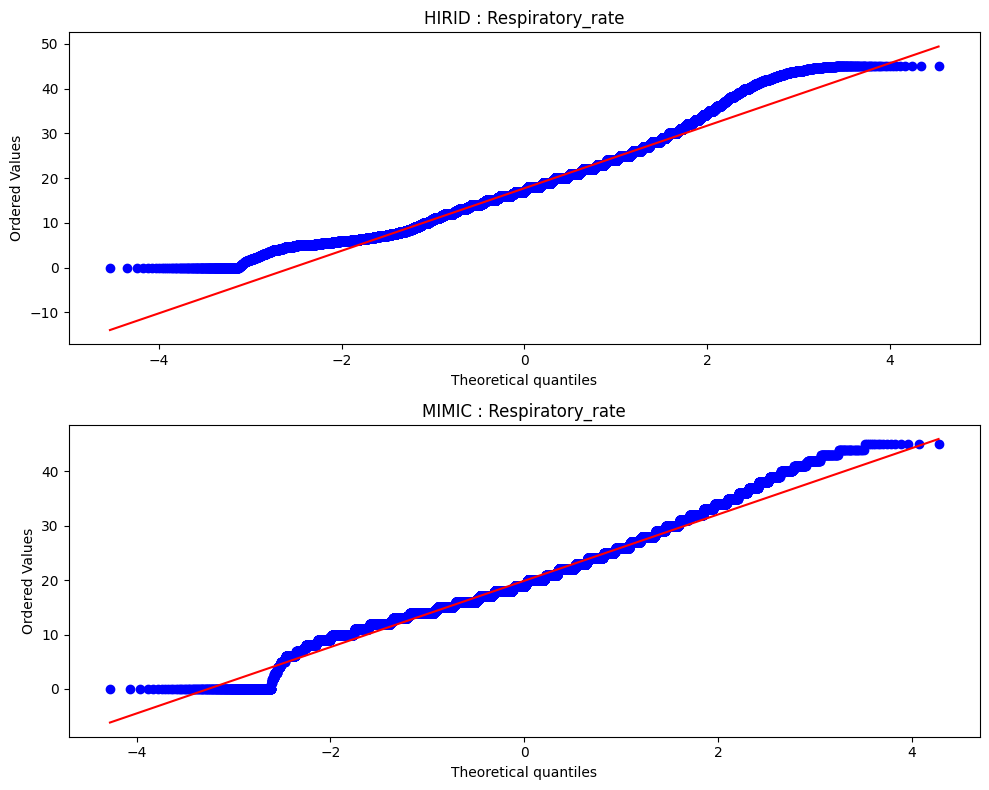

=== SpO2 T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | mimic normality : 0.0
T-Statistic: 8980566491.5  T_P-Value: 7.8259281036368155e-59



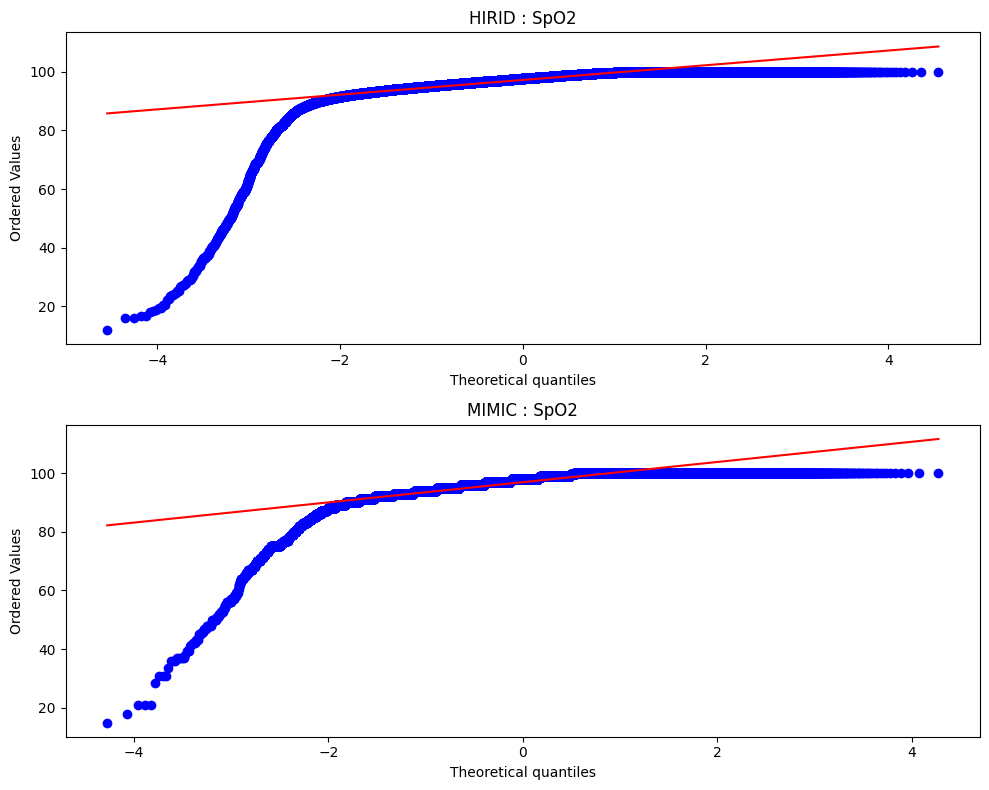

=== Temperature T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | mimic normality : 3.2299052804213656e-106
T-Statistic: 7742437.5  T_P-Value: 1.2942026292428521e-08



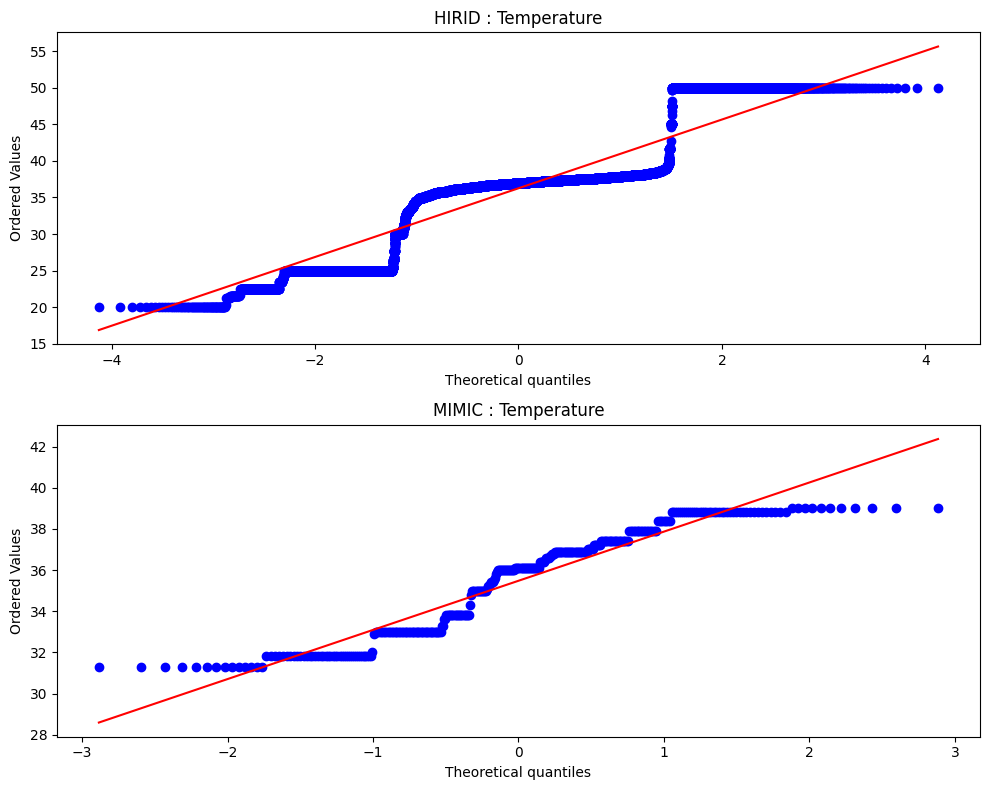

=== Urine_Output T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | mimic normality : 0.0
T-Statistic: 14413054323.5  T_P-Value: 0.0



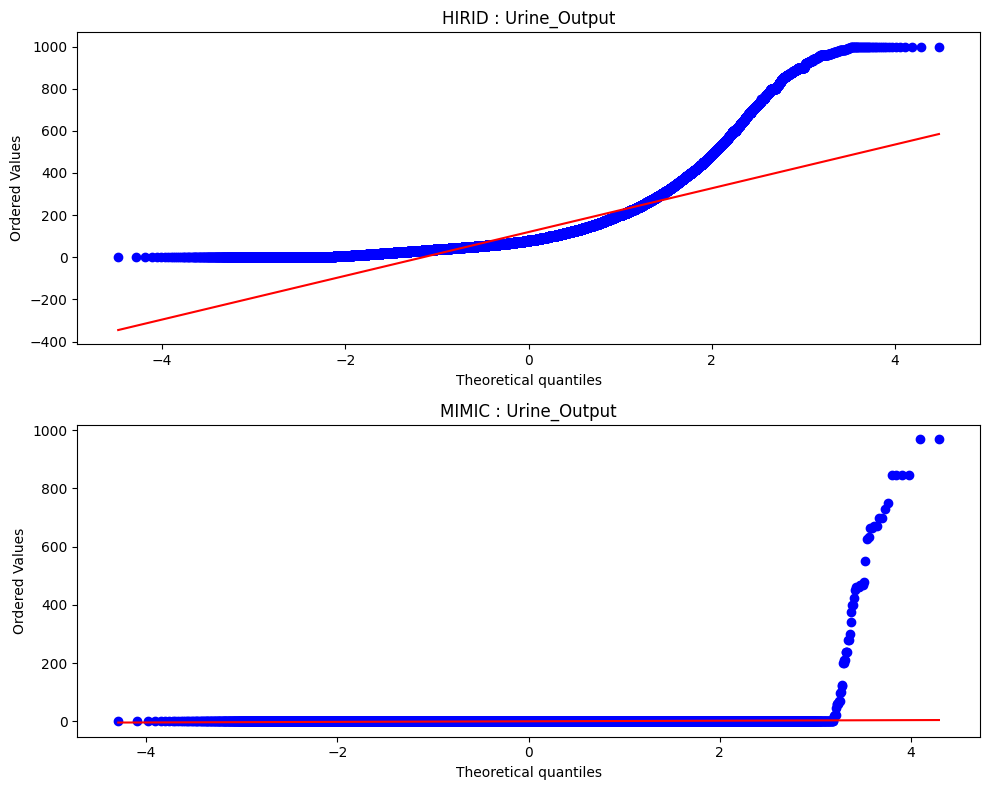

=== FiO2_returns T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | mimic normality : 0.0
T-Statistic: 6950481600.0  T_P-Value: 2.3446807083709152e-14



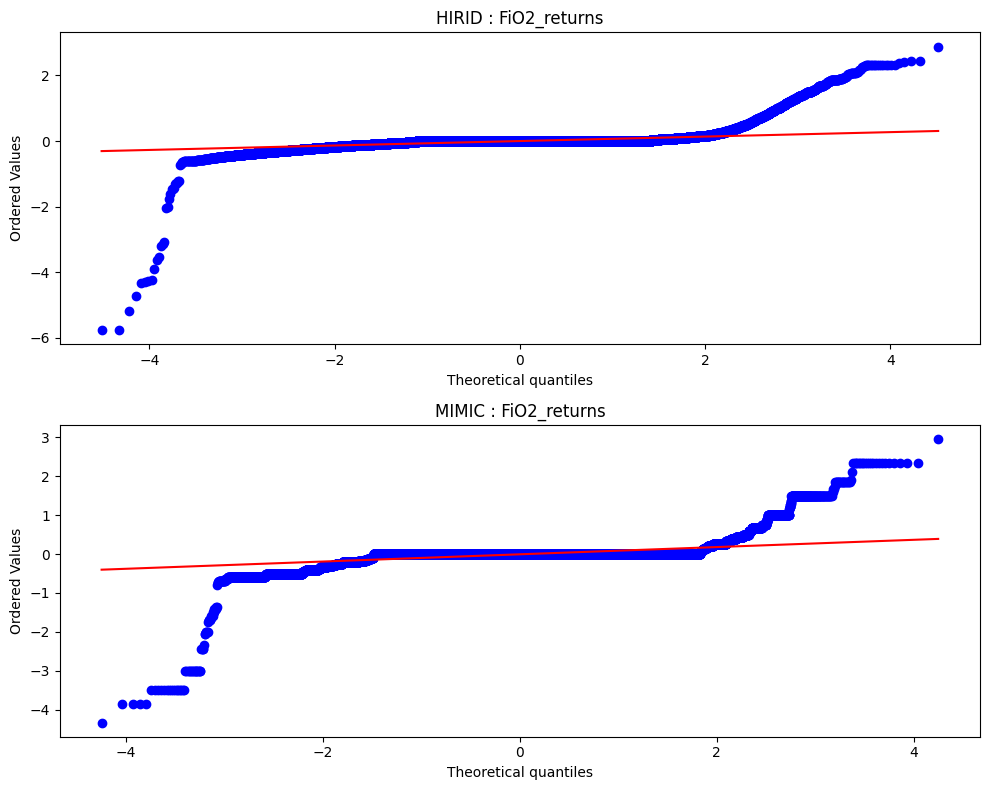

=== FiO2_max_3h T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | mimic normality : 0.0
T-Statistic: 5309368435.0  T_P-Value: 0.0



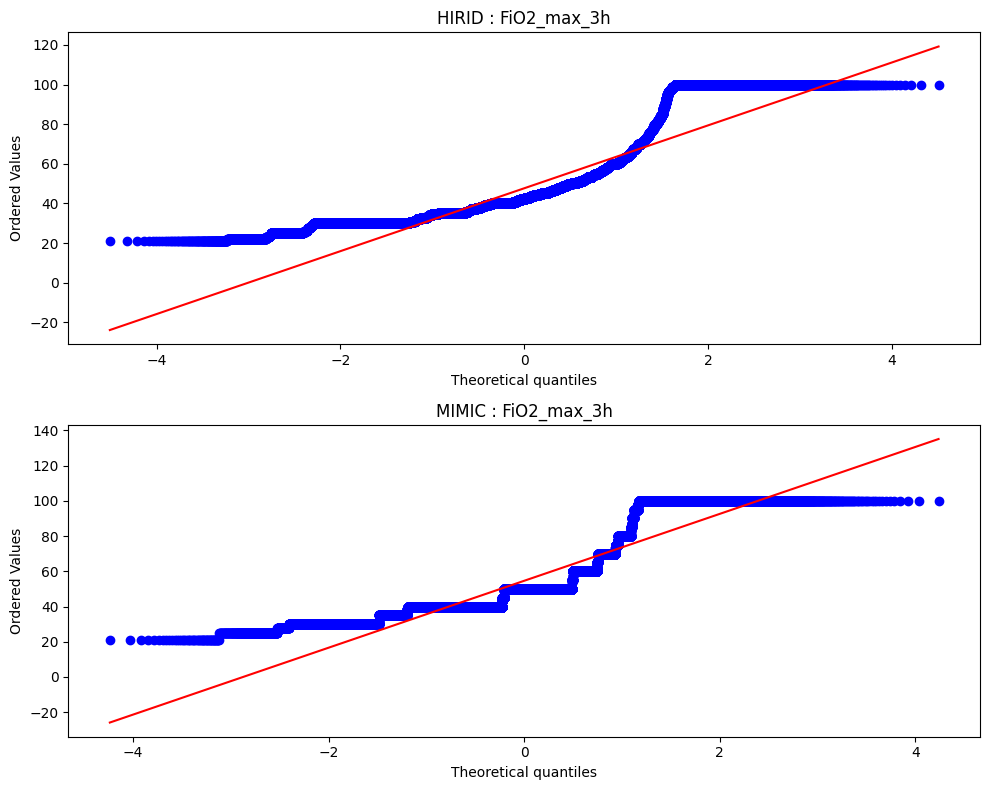

=== FiO2_min_3h T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | mimic normality : 0.0
T-Statistic: 5357585254.5  T_P-Value: 0.0



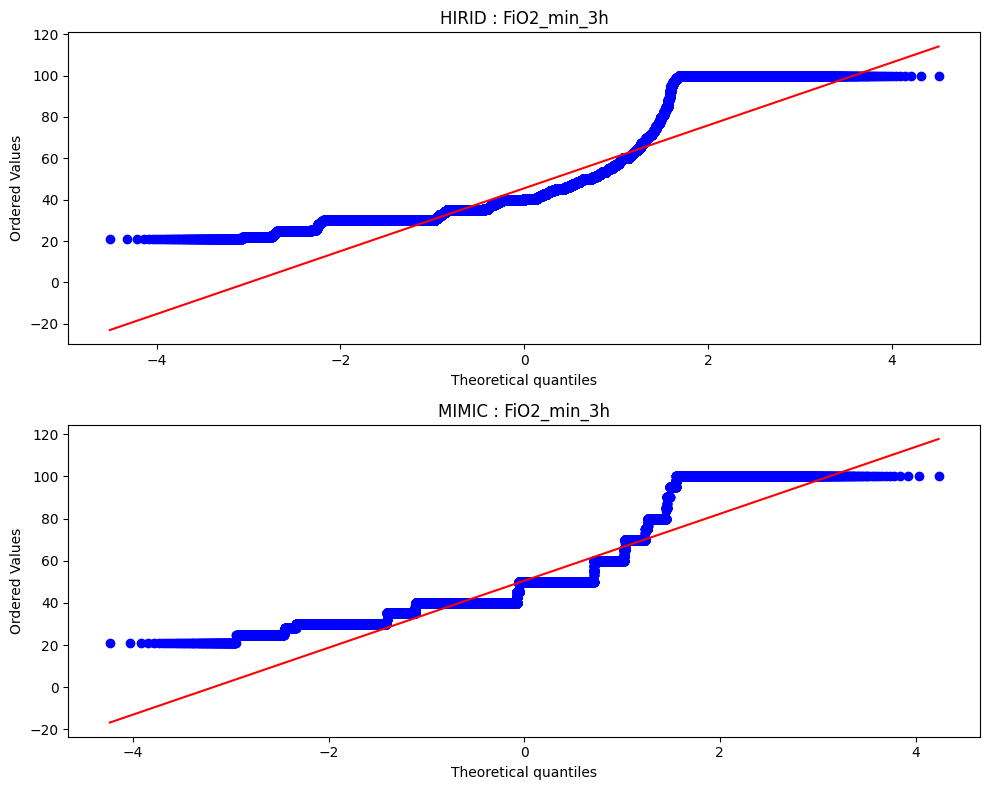

=== FiO2_5MA T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | mimic normality : 0.0
T-Statistic: 4571614684.5  T_P-Value: 0.0



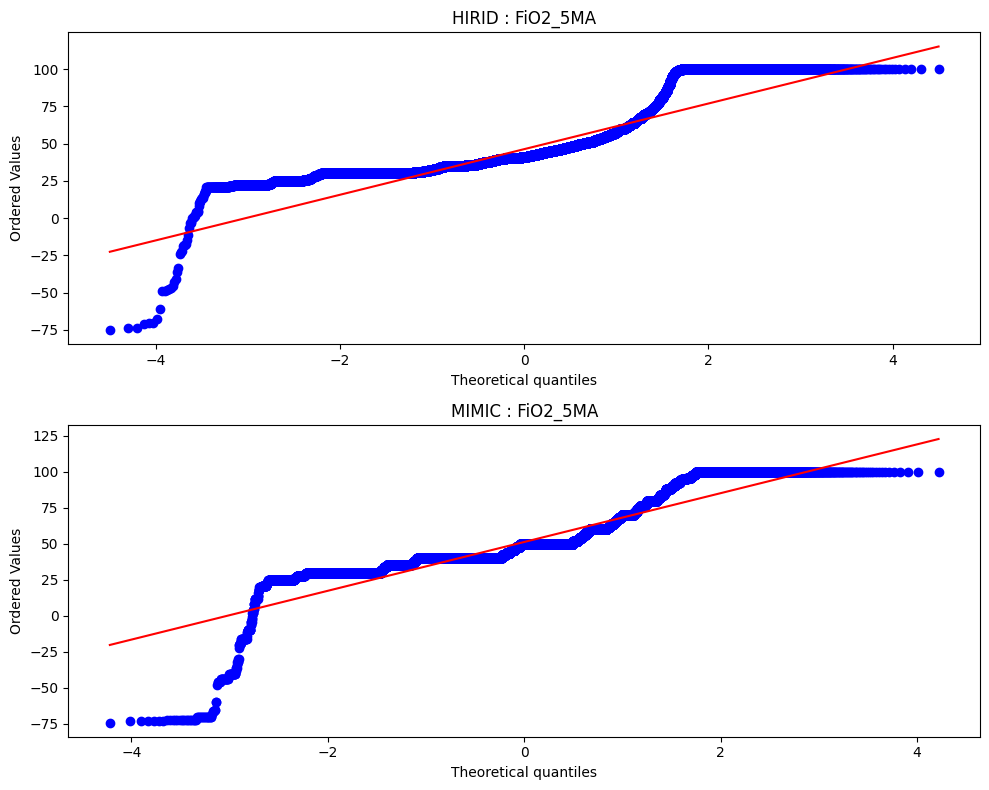

=== FiO2_10MA T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | mimic normality : 0.0
T-Statistic: 3437853972.5  T_P-Value: 0.0



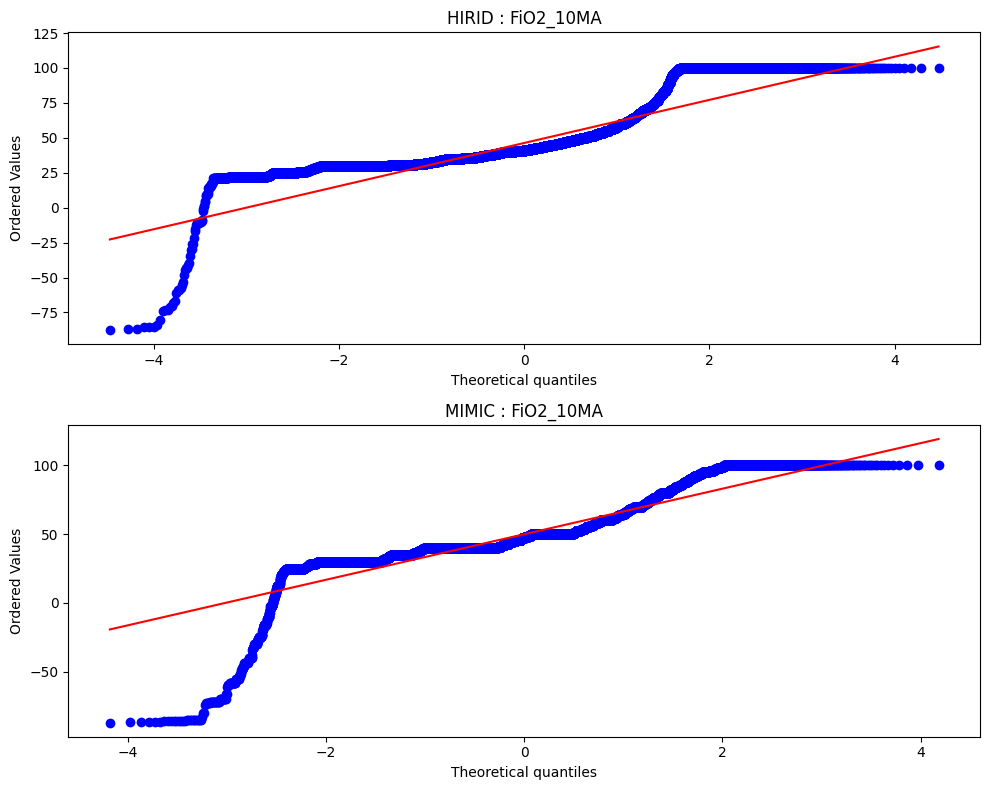

=== FiO2_20MA T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | mimic normality : 0.0
T-Statistic: 1989151372.5  T_P-Value: 0.0



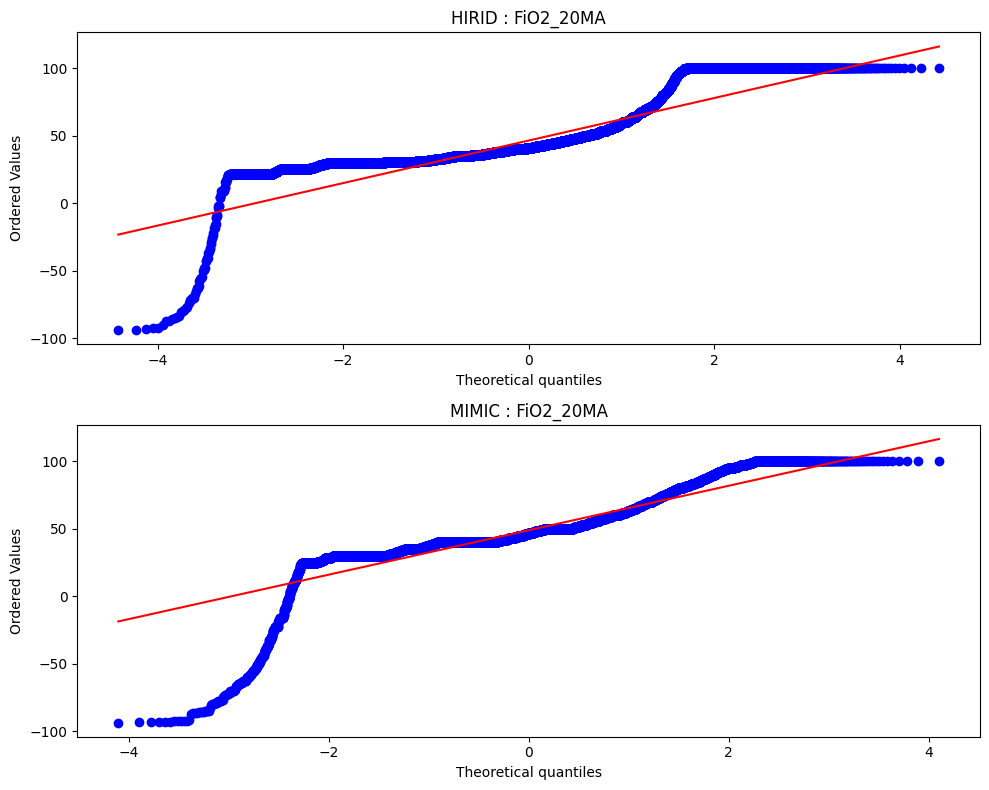

=== FiO2_RSI_3h T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | mimic normality : 0.0
T-Statistic: 937374023.0  T_P-Value: 7.661468782646556e-207



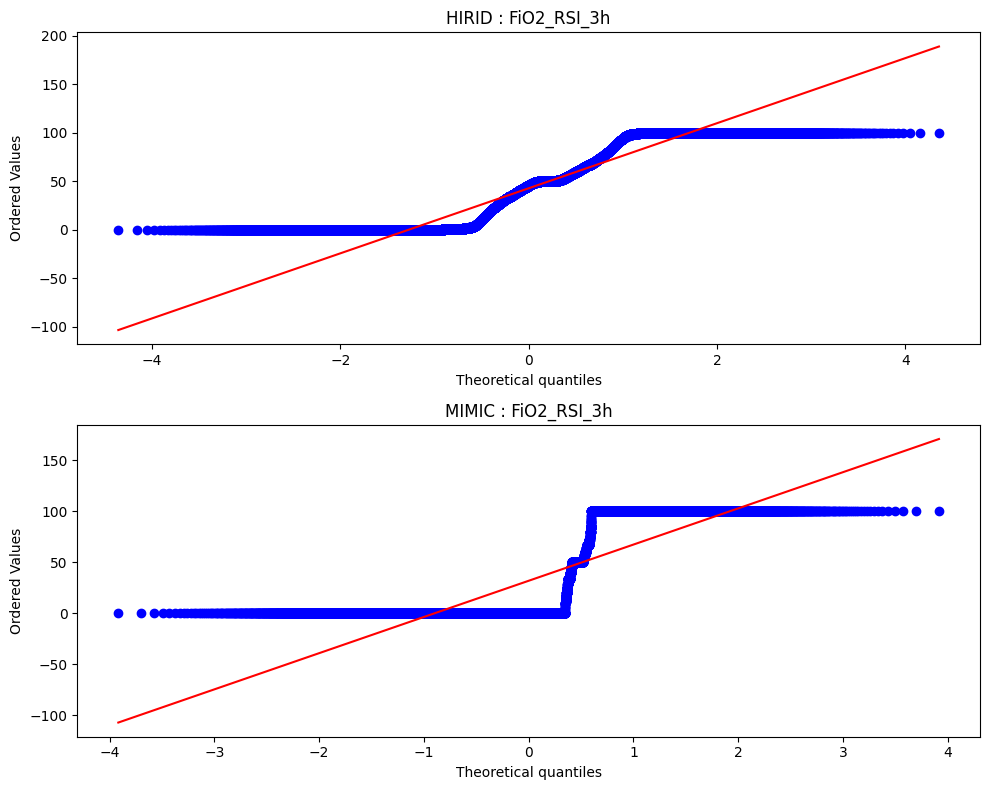

=== PaO2_returns T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | mimic normality : 0.0
T-Statistic: 7752326683.5  T_P-Value: 2.7495890395269056e-35



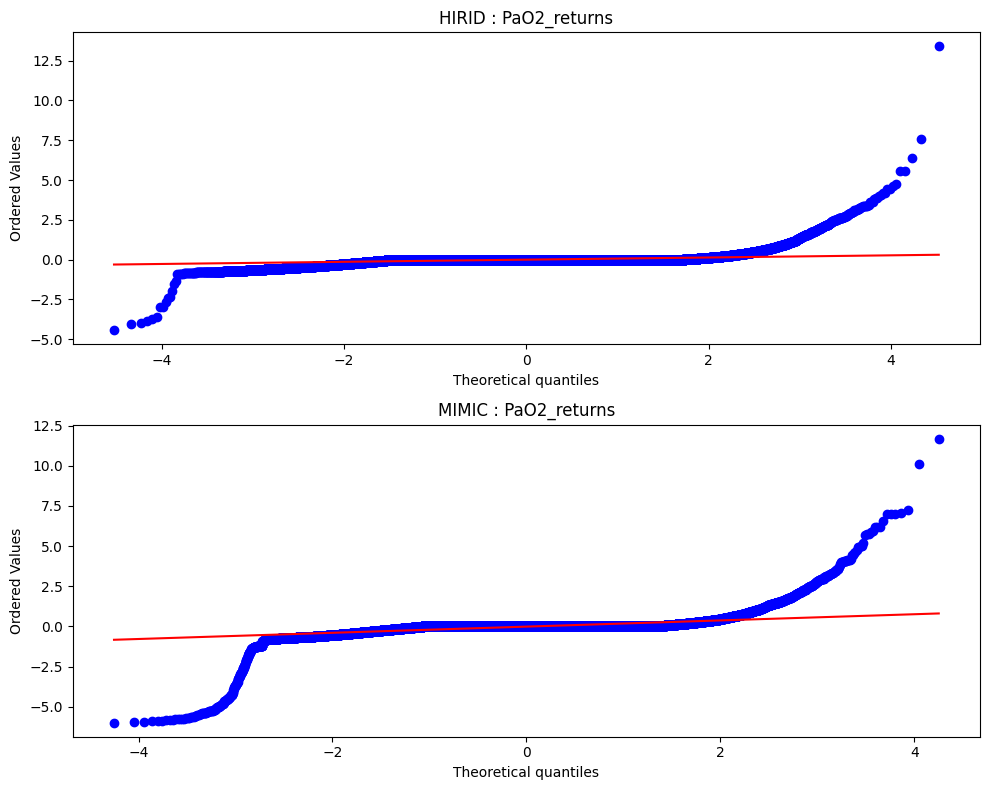

=== PaO2_max_3h T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | mimic normality : 0.0
T-Statistic: 5169037886.5  T_P-Value: 0.0



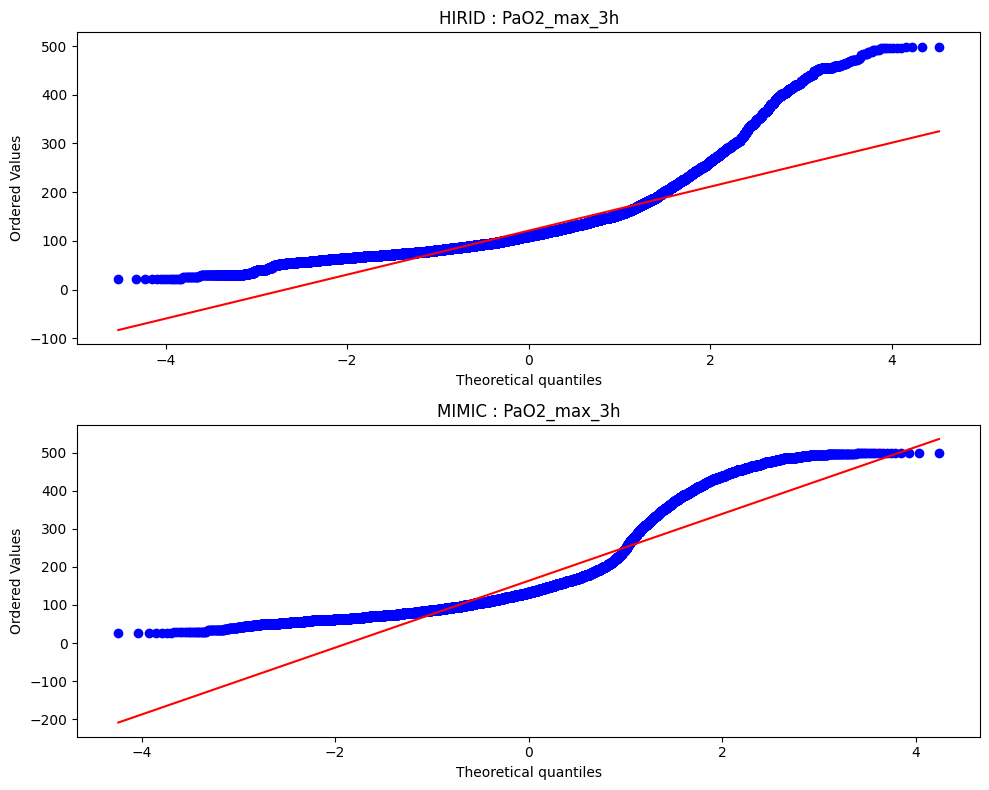

=== PaO2_min_3h T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | mimic normality : 0.0
T-Statistic: 5762679471.5  T_P-Value: 0.0



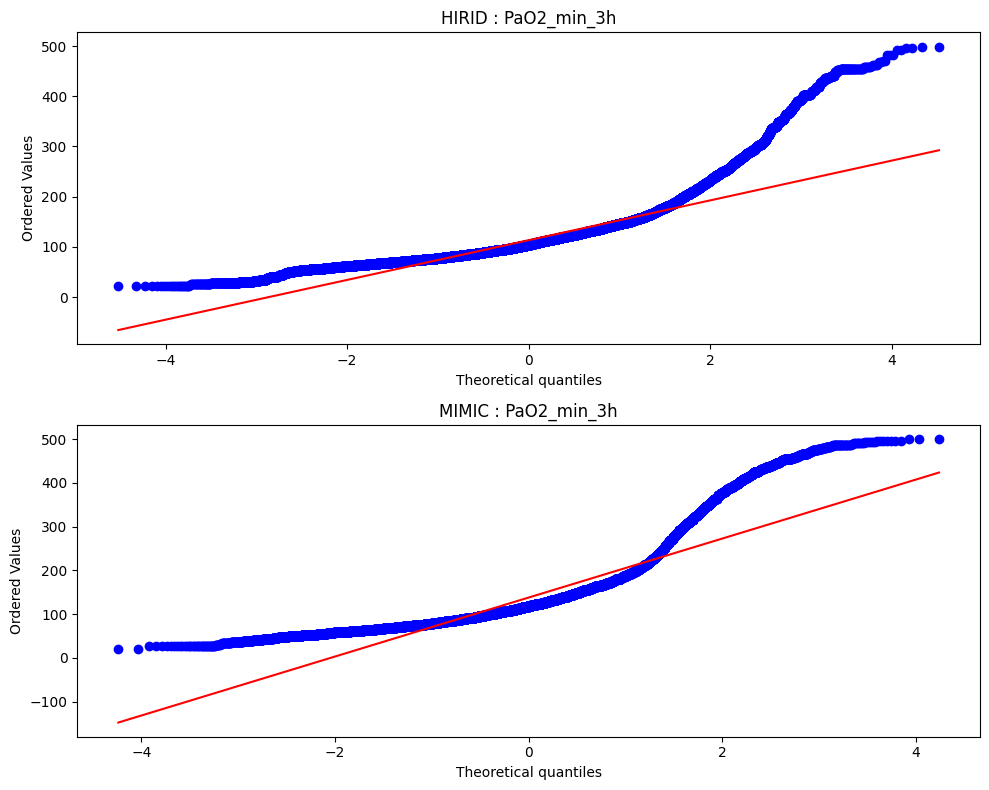

=== PaO2_5MA T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | mimic normality : 0.0
T-Statistic: 4576470058.5  T_P-Value: 0.0



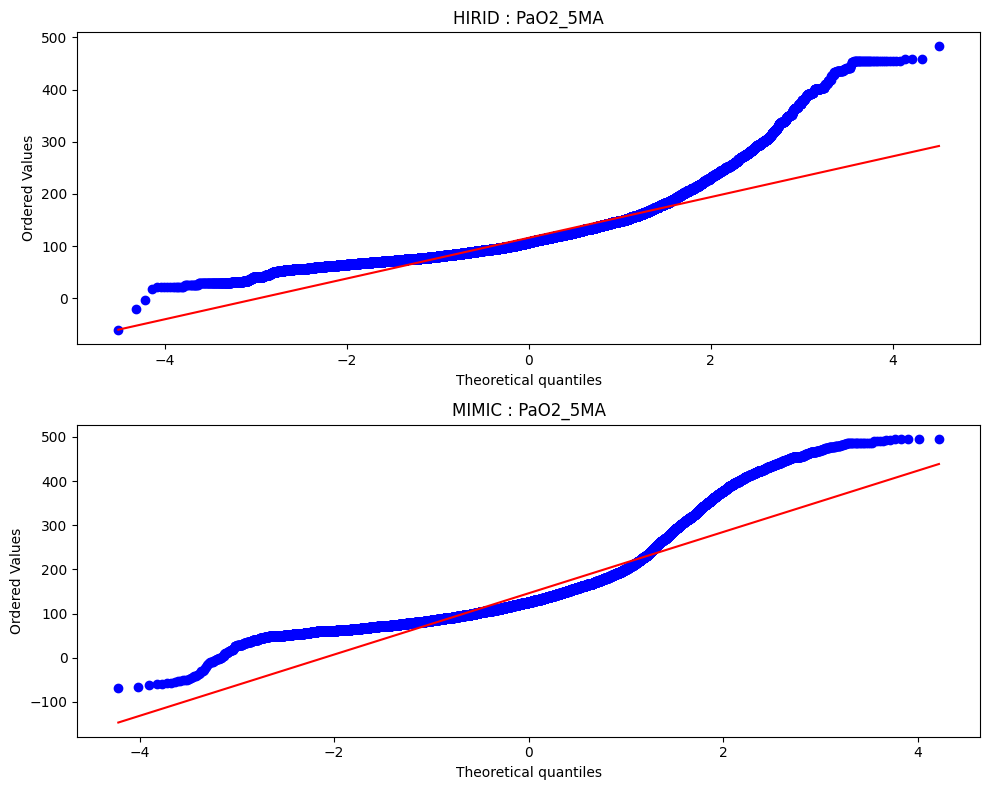

=== PaO2_10MA T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | mimic normality : 0.0
T-Statistic: 3300994602.0  T_P-Value: 0.0



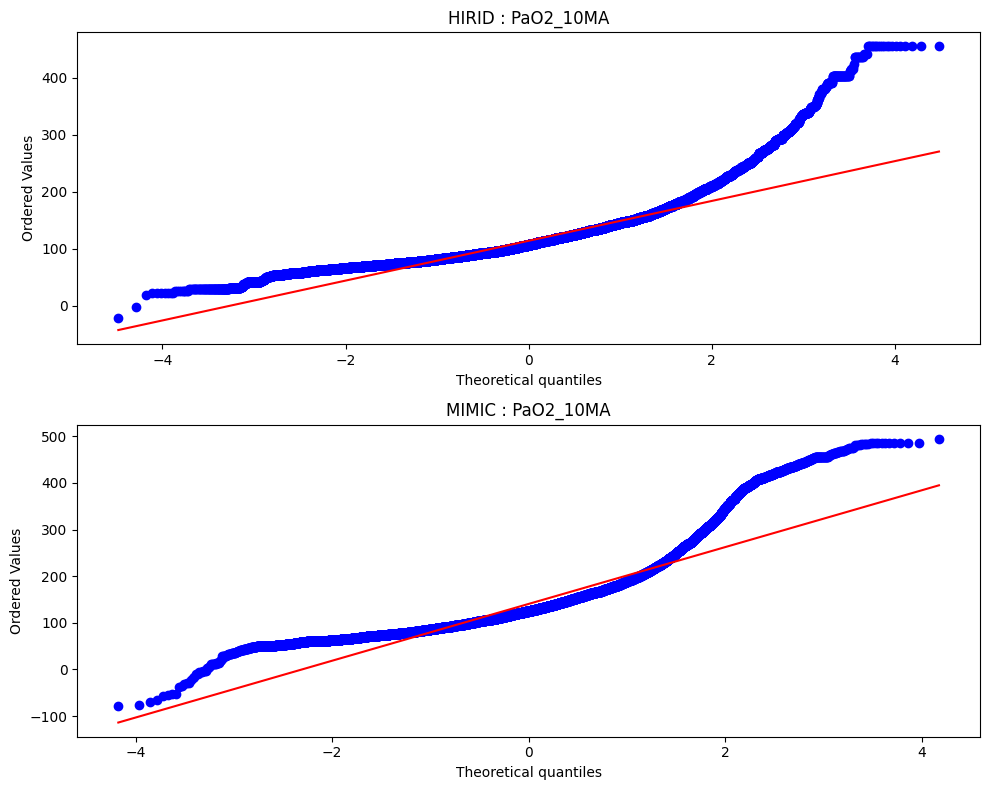

=== PaO2_20MA T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | mimic normality : 0.0
T-Statistic: 1824621729.5  T_P-Value: 0.0



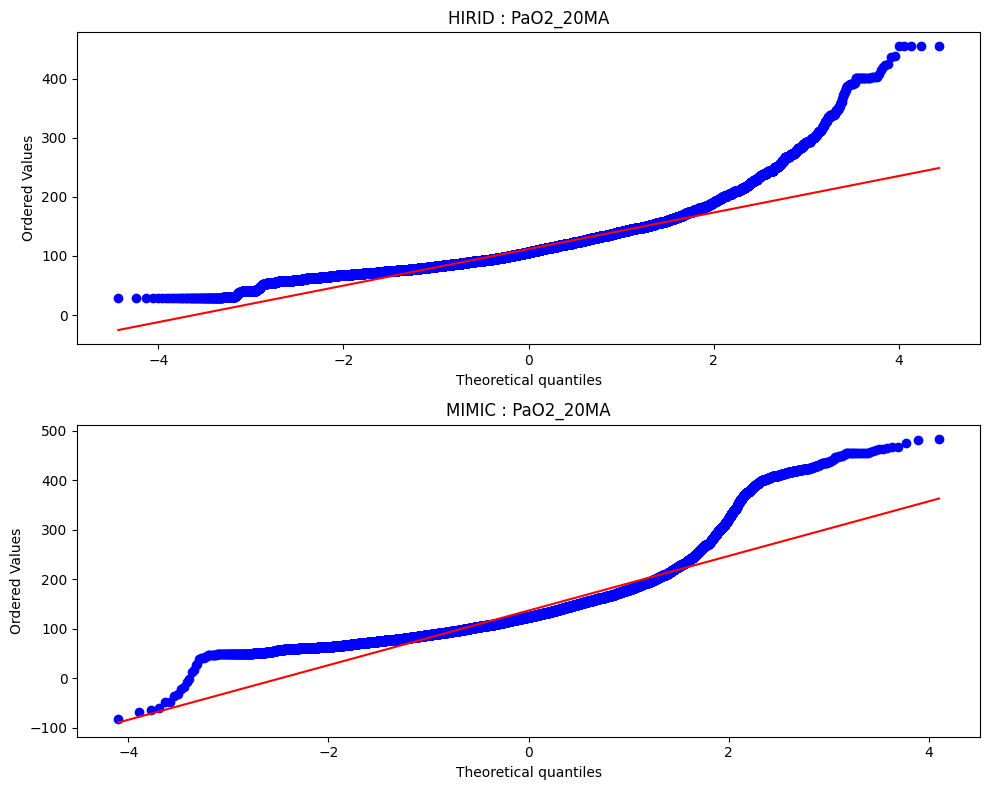

=== PaO2_RSI_3h T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | mimic normality : 0.0
T-Statistic: 673851250.0  T_P-Value: 0.0



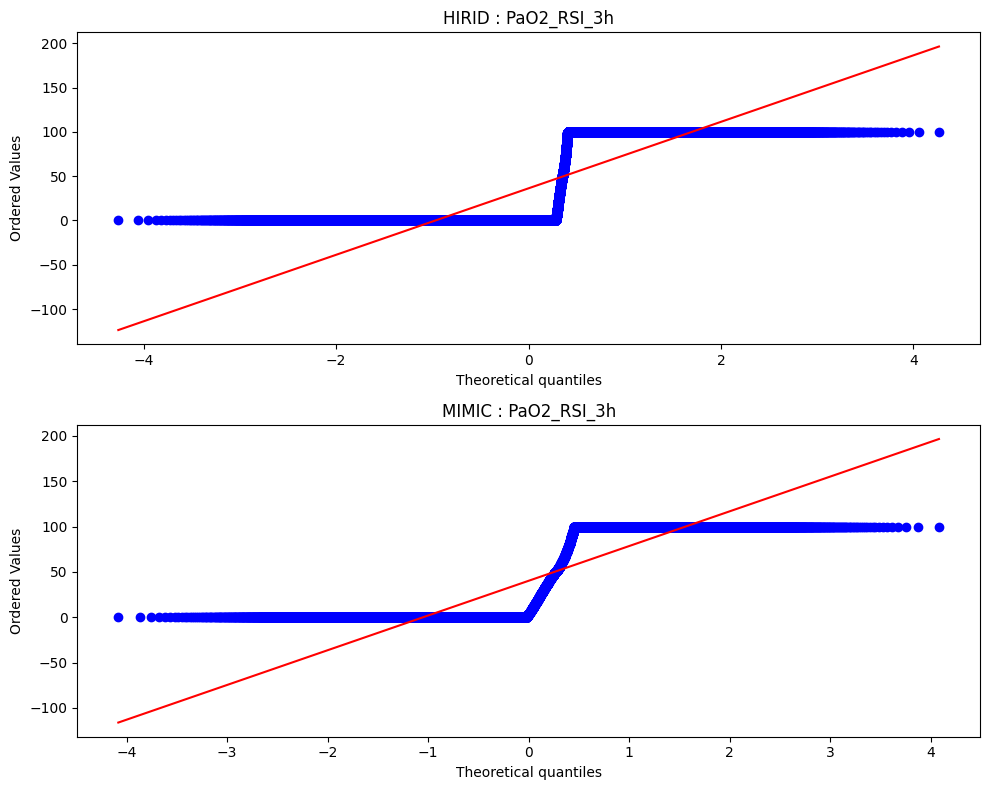

=== MAP_returns T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | mimic normality : 0.0
T-Statistic: 6742158927.5  T_P-Value: 0.4119640940135836



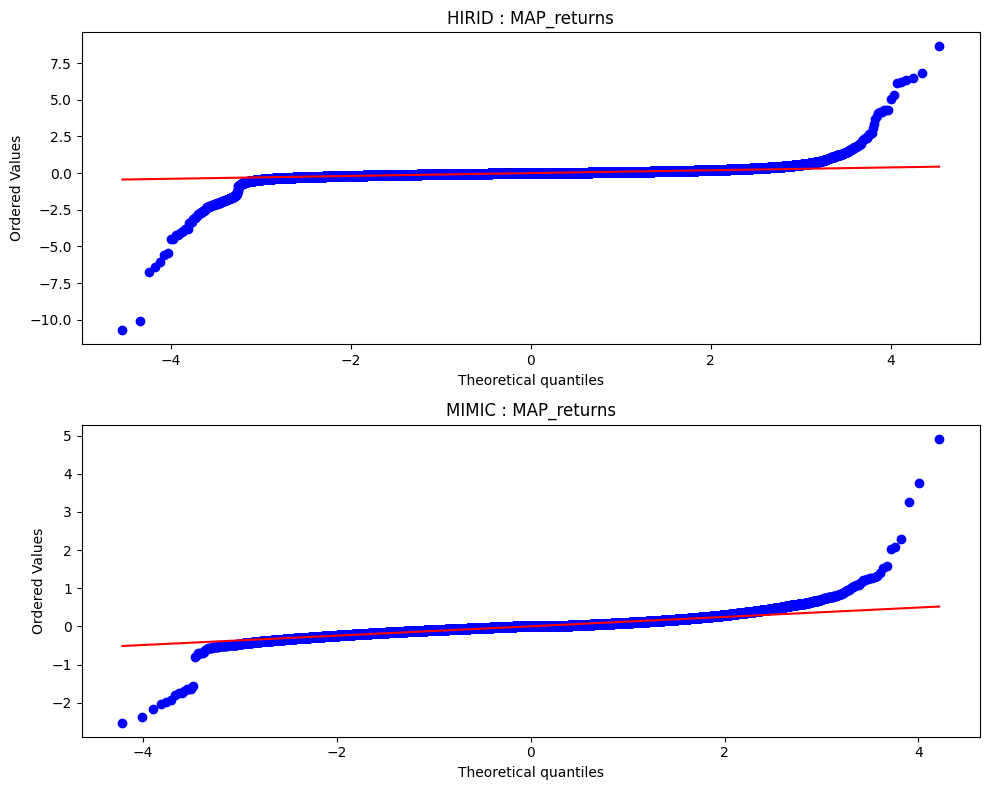

=== MAP_max_3h T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | mimic normality : 0.0
T-Statistic: 7275859187.5  T_P-Value: 0.0



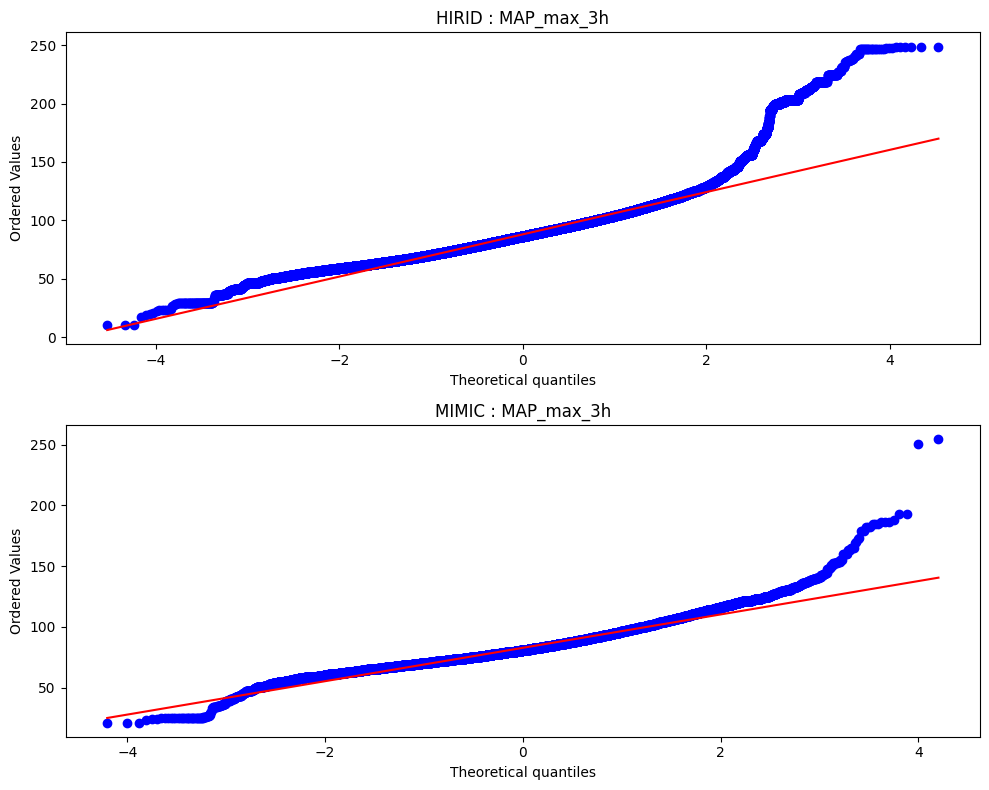

=== MAP_min_3h T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | mimic normality : 0.0
T-Statistic: 7745122599.5  T_P-Value: 0.0



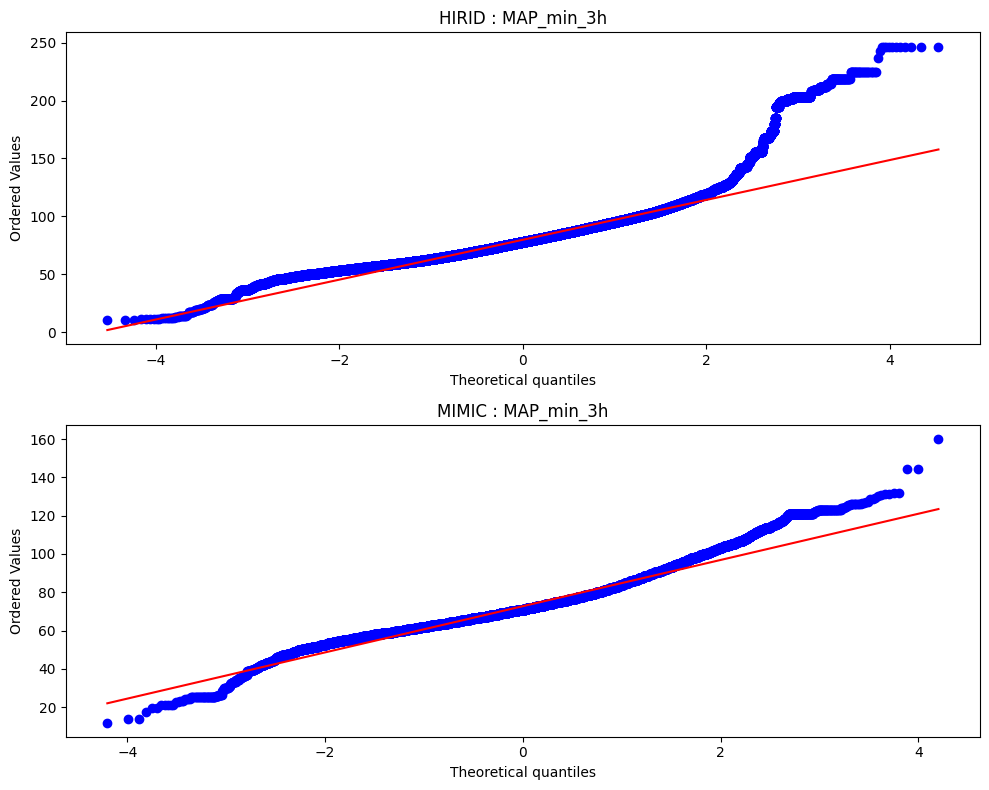

=== MAP_5MA T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | mimic normality : 0.0
T-Statistic: 6665589866.5  T_P-Value: 0.0



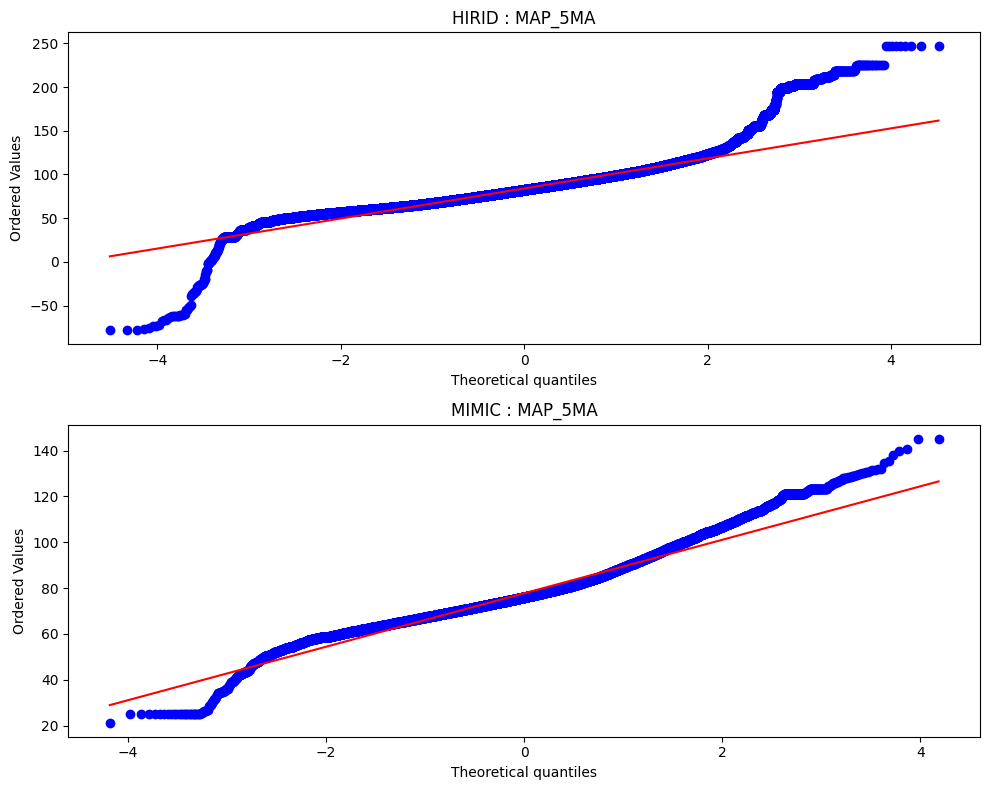

=== MAP_10MA T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | mimic normality : 0.0
T-Statistic: 5060391939.5  T_P-Value: 0.0



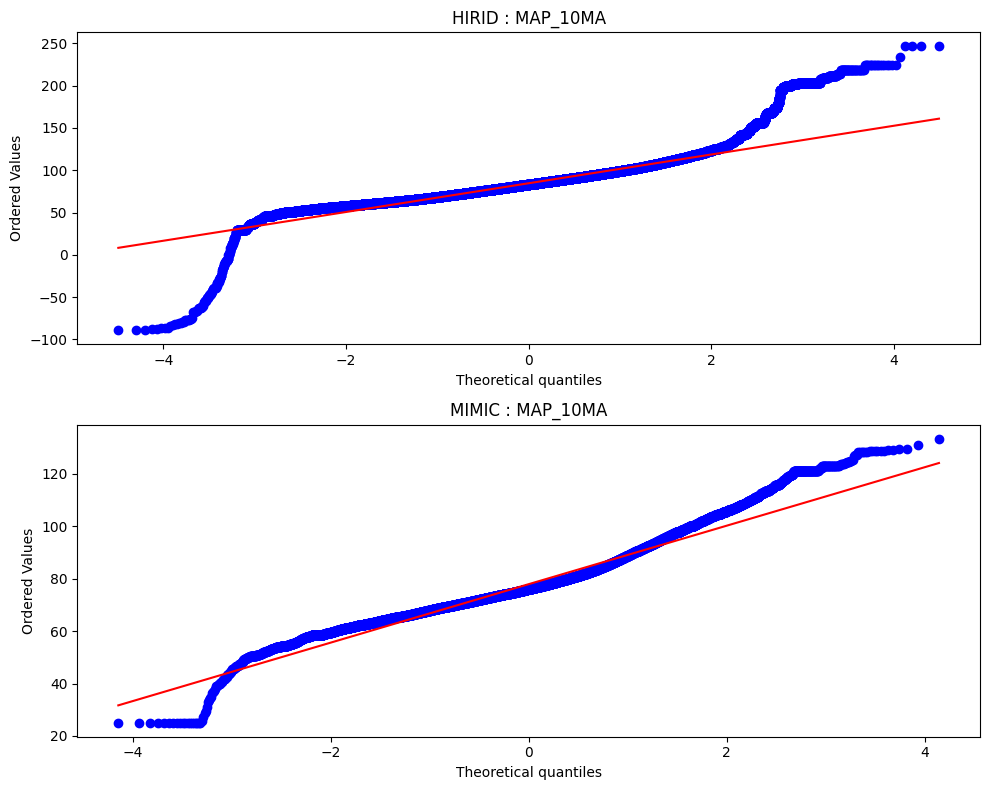

=== MAP_20MA T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | mimic normality : 0.0
T-Statistic: 2985970444.0  T_P-Value: 0.0



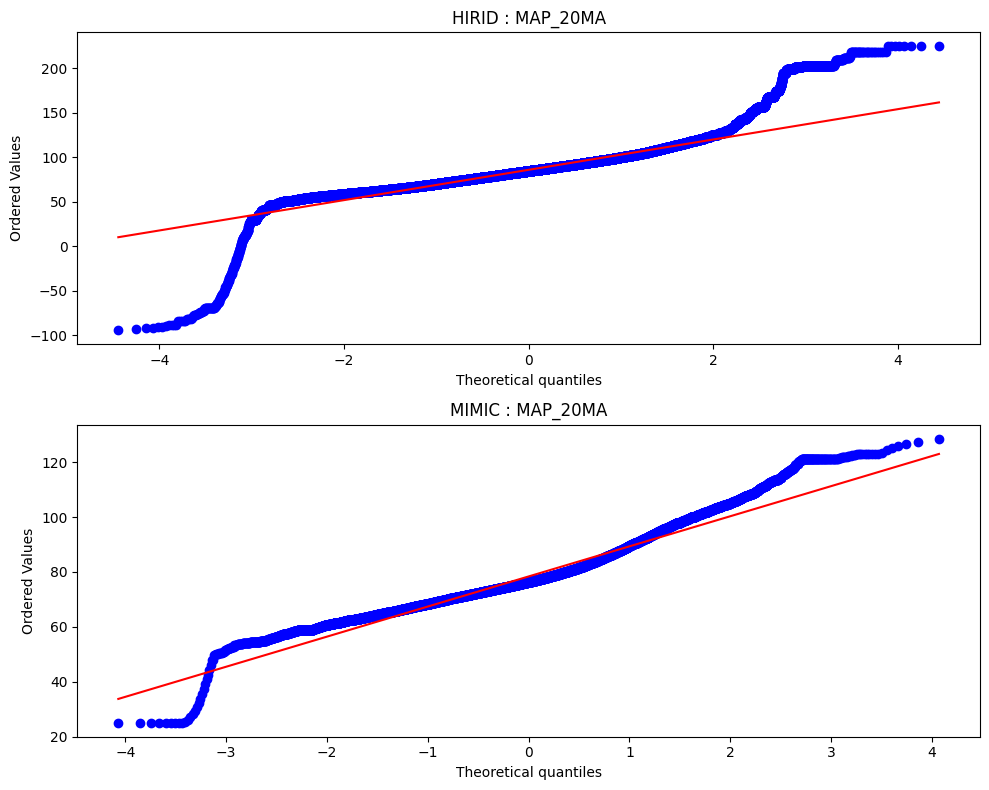

=== MAP_RSI_3h T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | mimic normality : 0.0
T-Statistic: 5535816703.0  T_P-Value: 0.051776040521649296



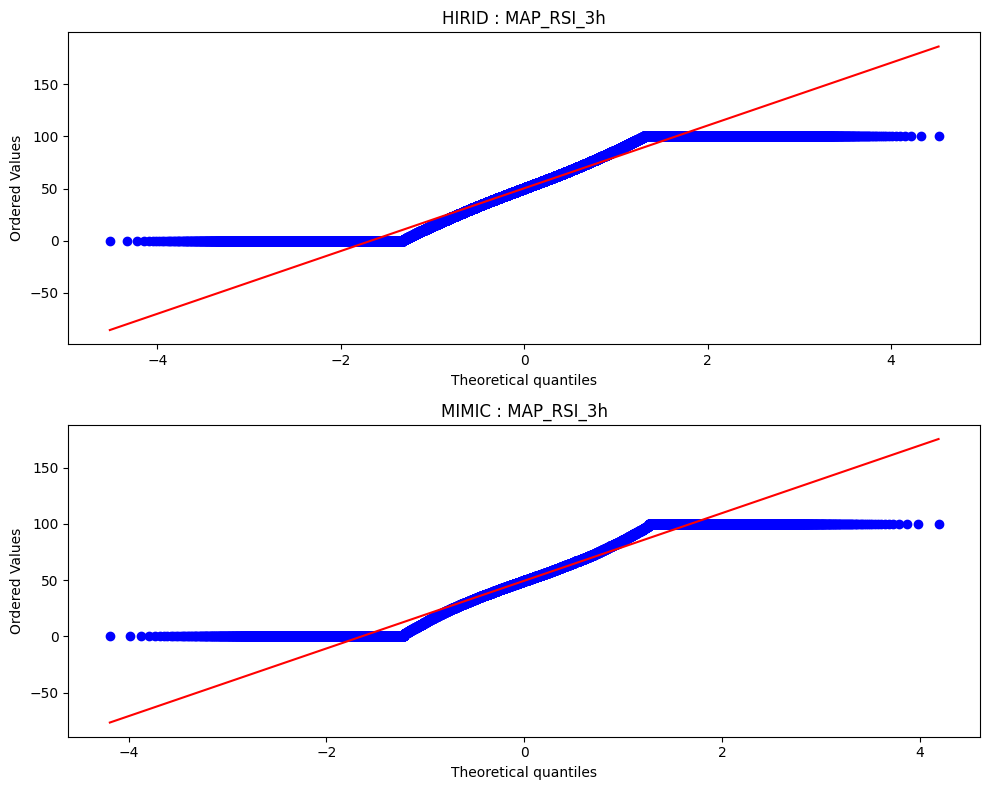

=== Respiratory_rate_returns T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | mimic normality : 0.0
T-Statistic: 8800809372.5  T_P-Value: 1.0995852967518763e-12



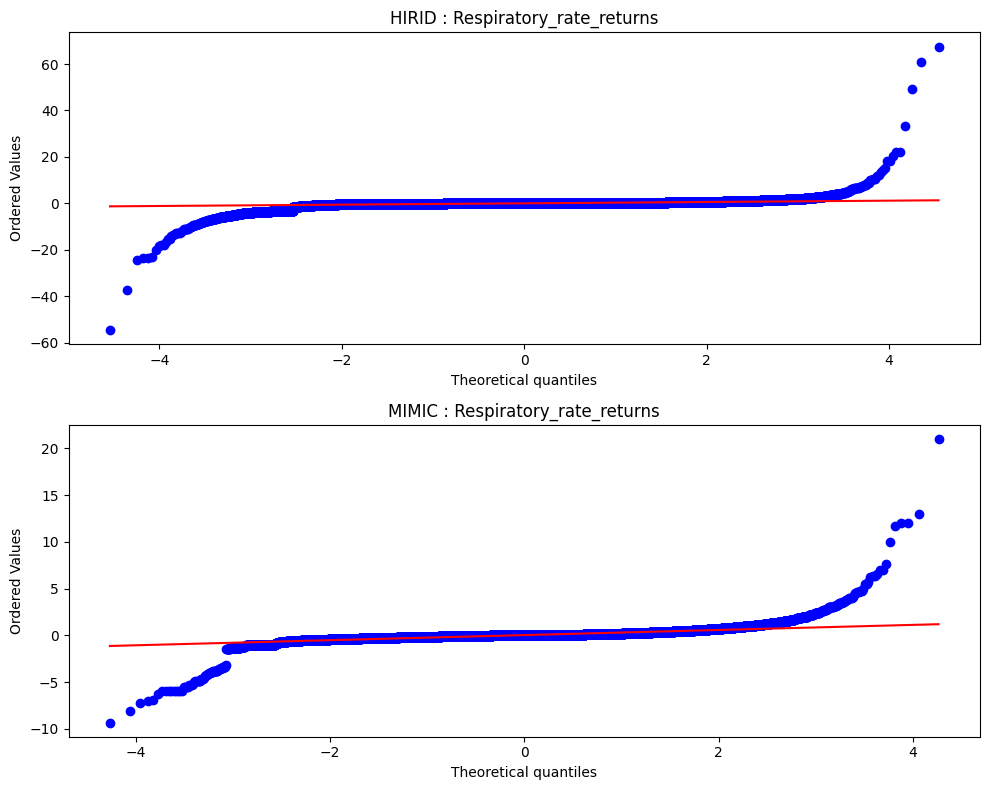

=== Respiratory_rate_max_3h T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | mimic normality : 0.0
T-Statistic: 5941766324.0  T_P-Value: 0.0



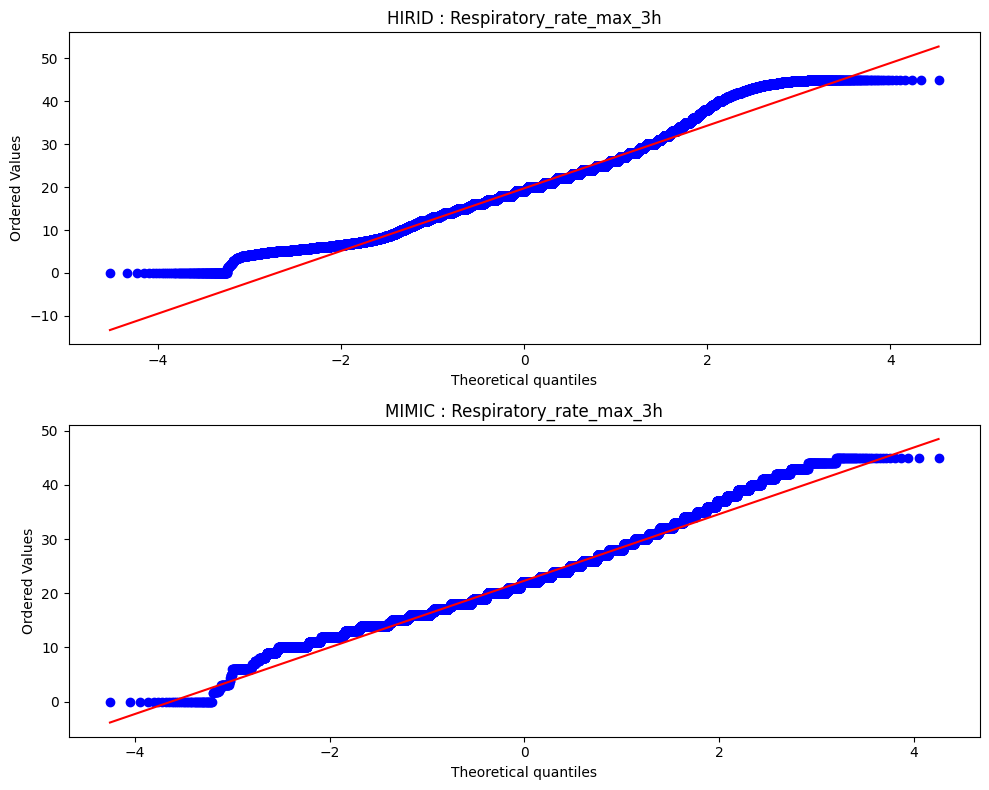

=== Respiratory_rate_min_3h T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | mimic normality : 5.177324516925318e-292
T-Statistic: 6300538017.0  T_P-Value: 0.0



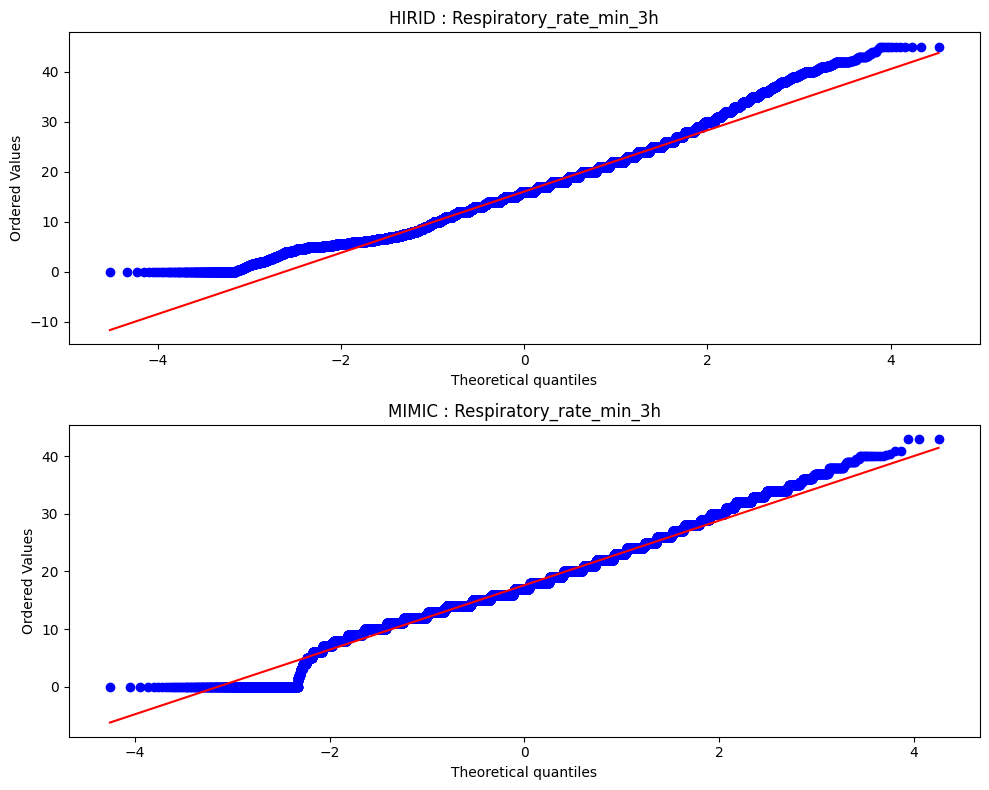

=== Respiratory_rate_5MA T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | mimic normality : 0.0
T-Statistic: 5227594617.0  T_P-Value: 0.0



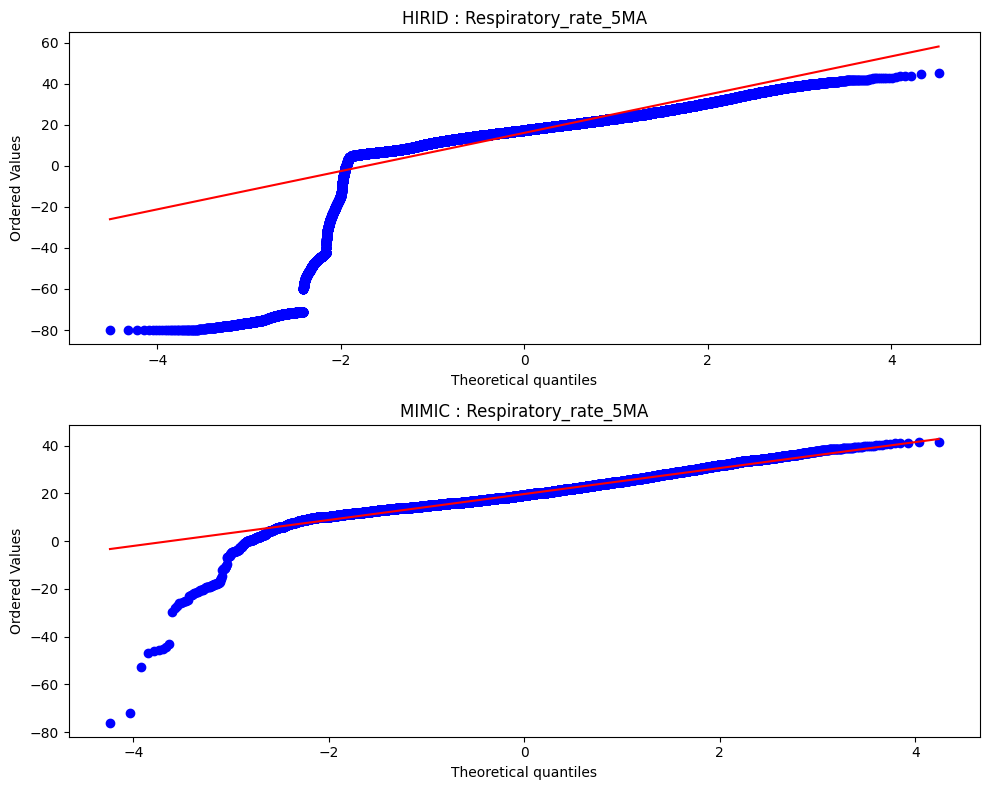

=== Respiratory_rate_10MA T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | mimic normality : 0.0
T-Statistic: 3866341015.0  T_P-Value: 0.0



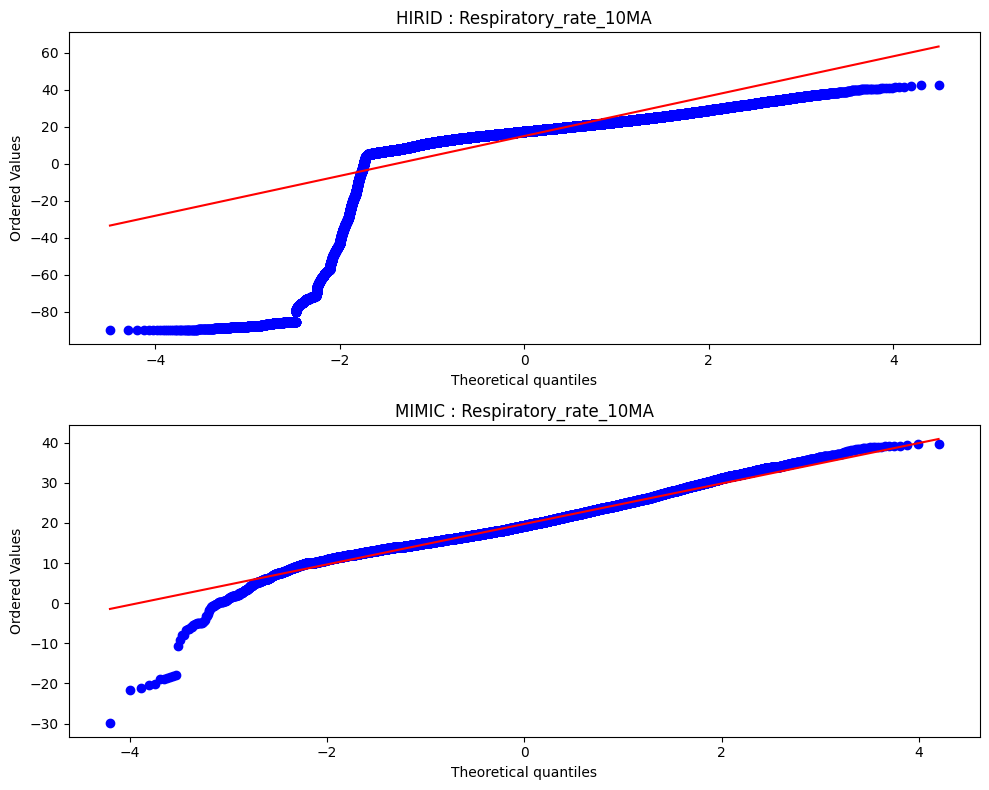

=== Respiratory_rate_20MA T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | mimic normality : 1.7081552302572023e-152
T-Statistic: 2165936378.5  T_P-Value: 0.0



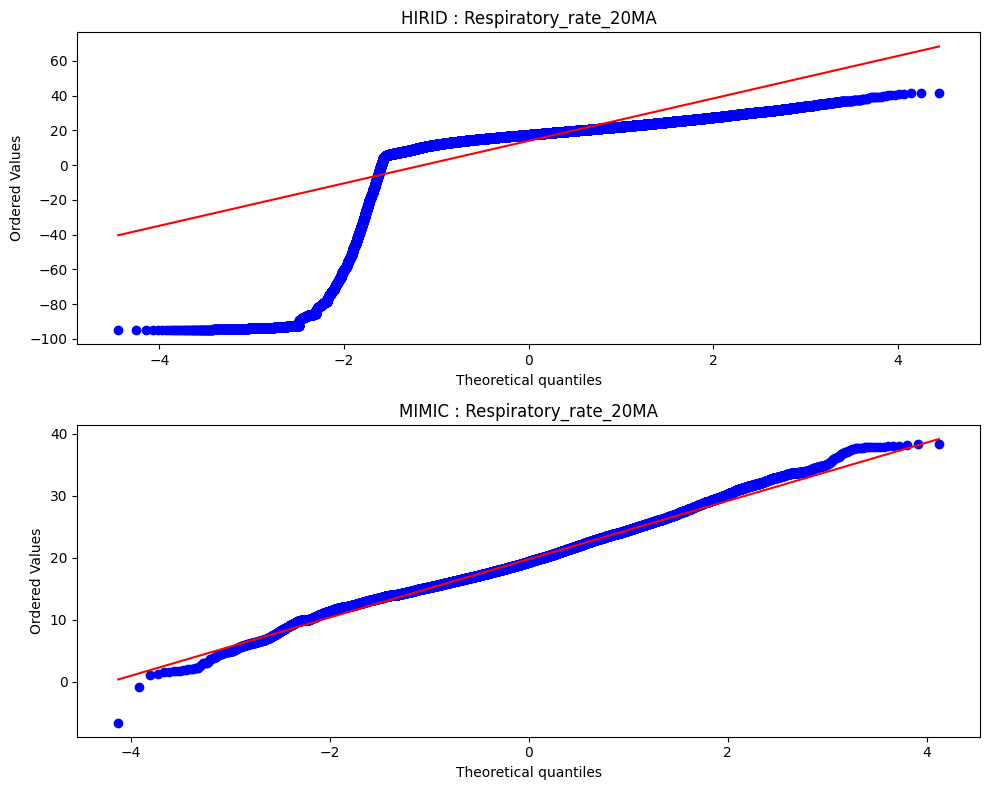

=== Respiratory_rate_RSI_3h T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | mimic normality : 0.0
T-Statistic: 6369397903.0  T_P-Value: 0.005923523233626104



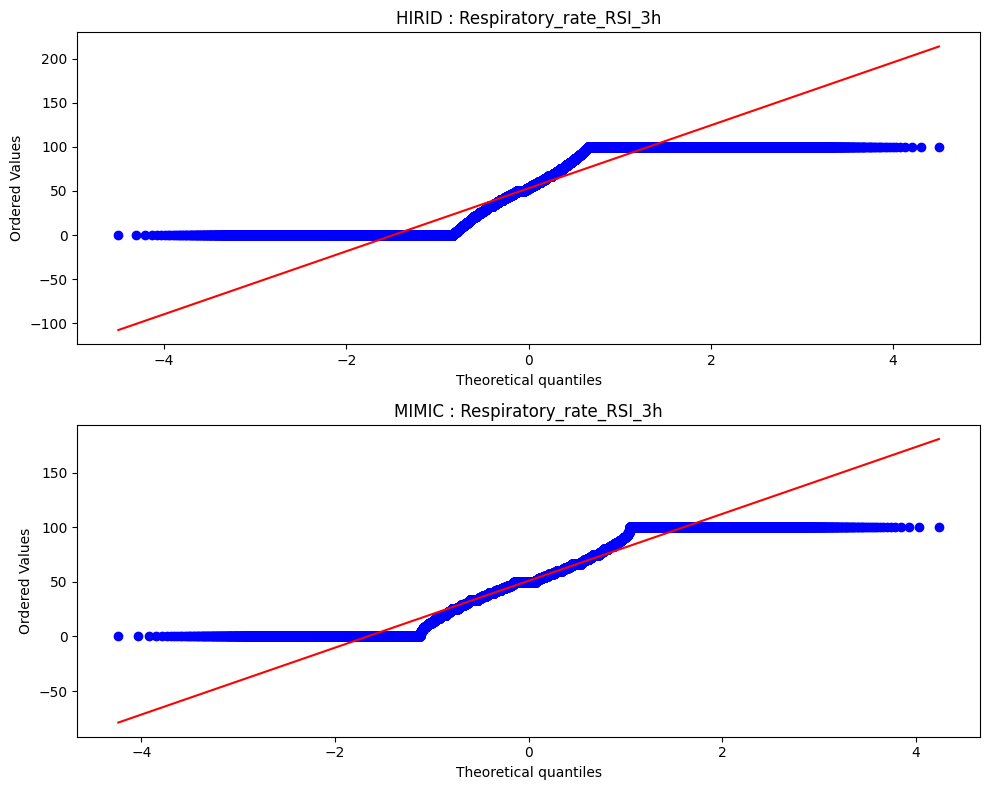

=== PP T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | mimic normality : 0.0
T-Statistic: 8765399824.0  T_P-Value: 0.0



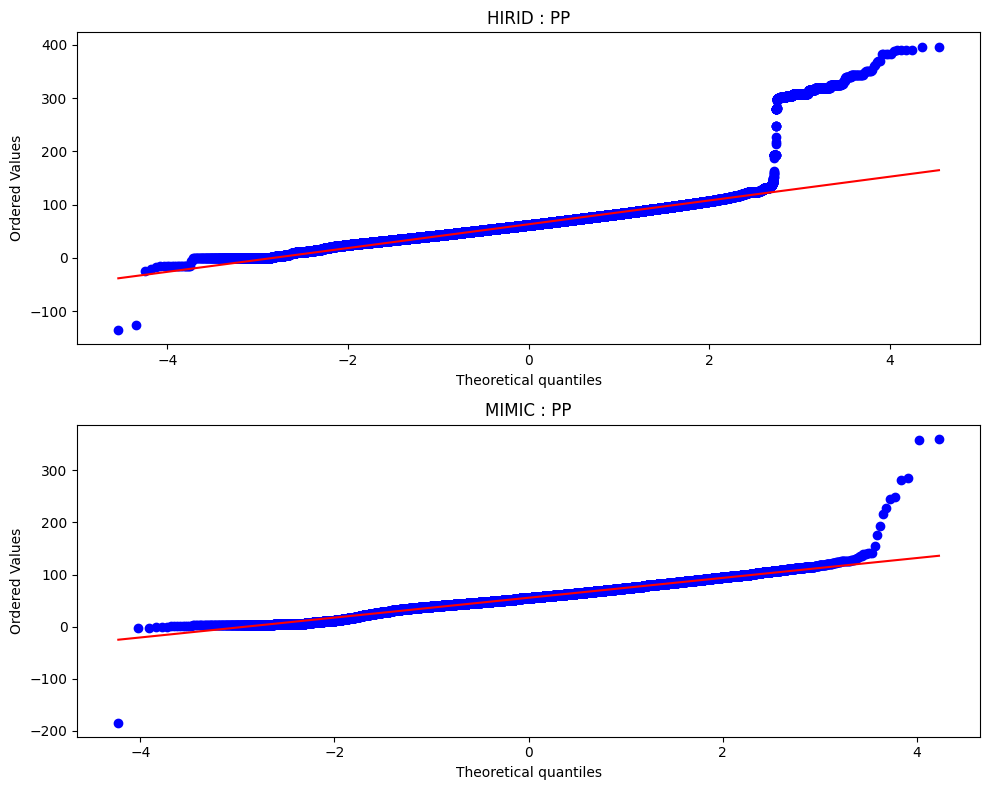

=== Creatinine T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | mimic normality : 0.0
T-Statistic: 119513397.5  T_P-Value: 0.0



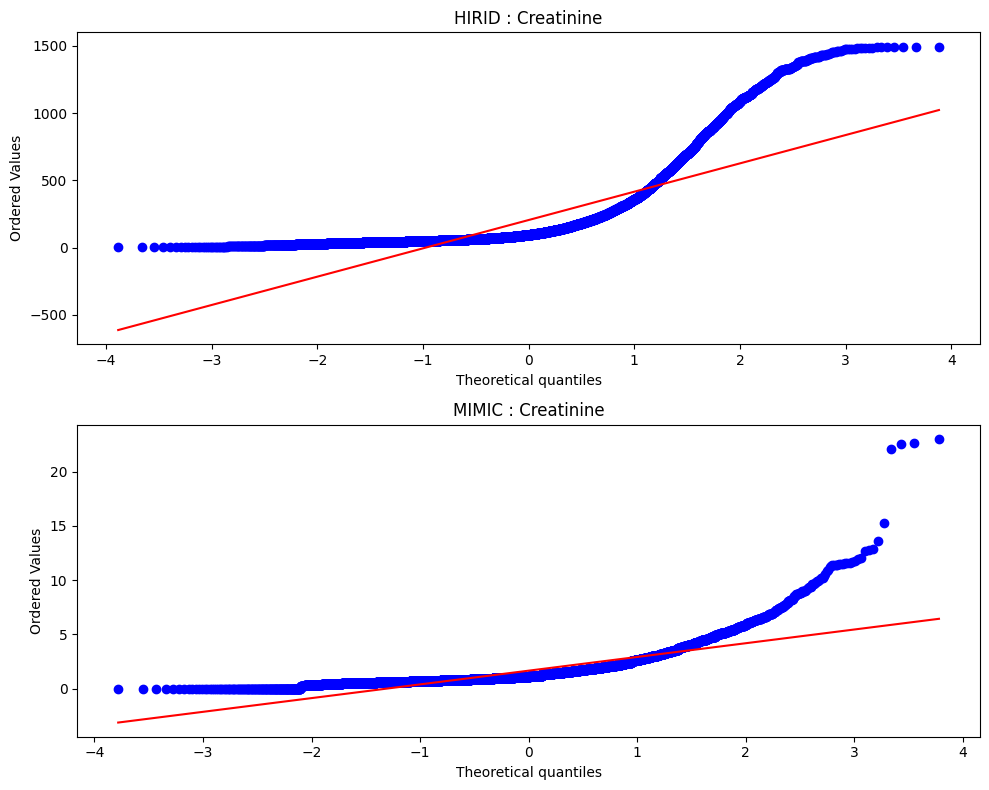

=== Lactate T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | mimic normality : 0.0
T-Statistic: 142360413.5  T_P-Value: 0.0



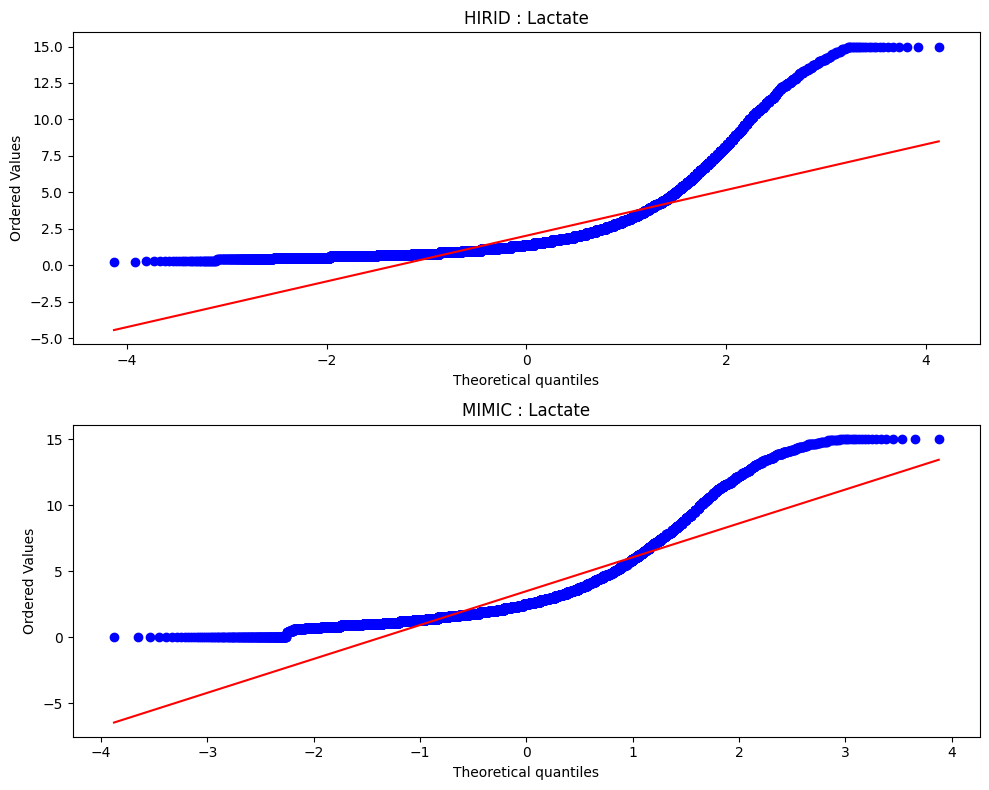

=== Platelet_Count T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | mimic normality : 0.0
T-Statistic: 87316754.5  T_P-Value: 6.694849006155435e-46



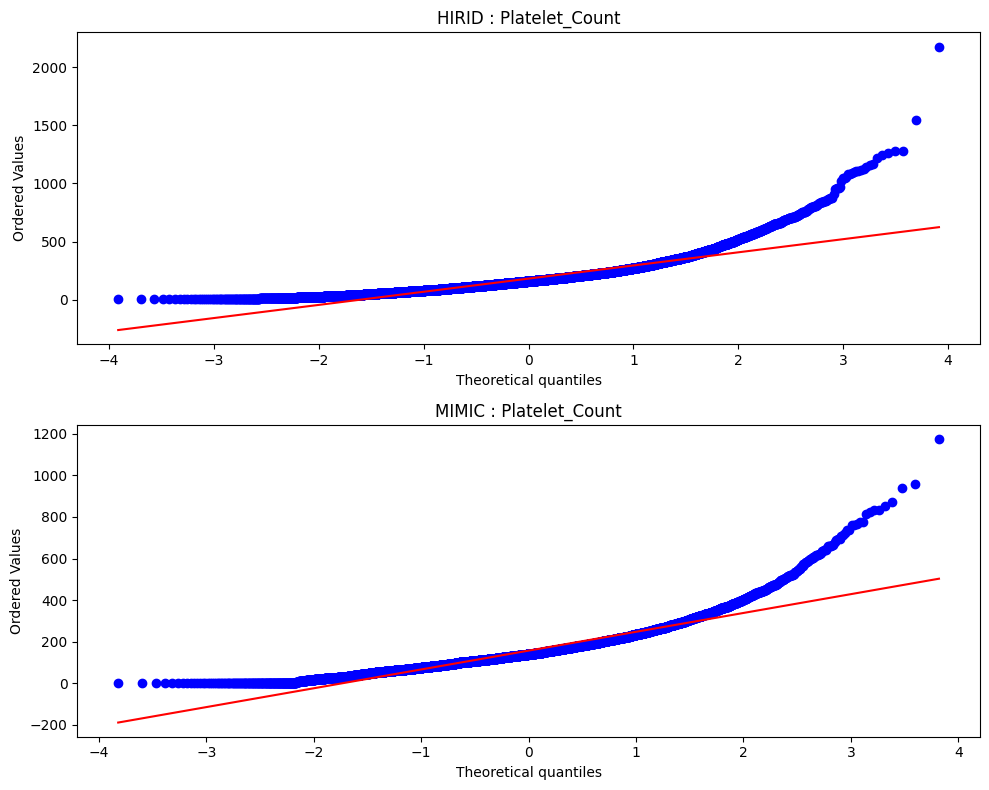

=== Bilirubin T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | mimic normality : 0.0
T-Statistic: 13603294.0  T_P-Value: 0.0



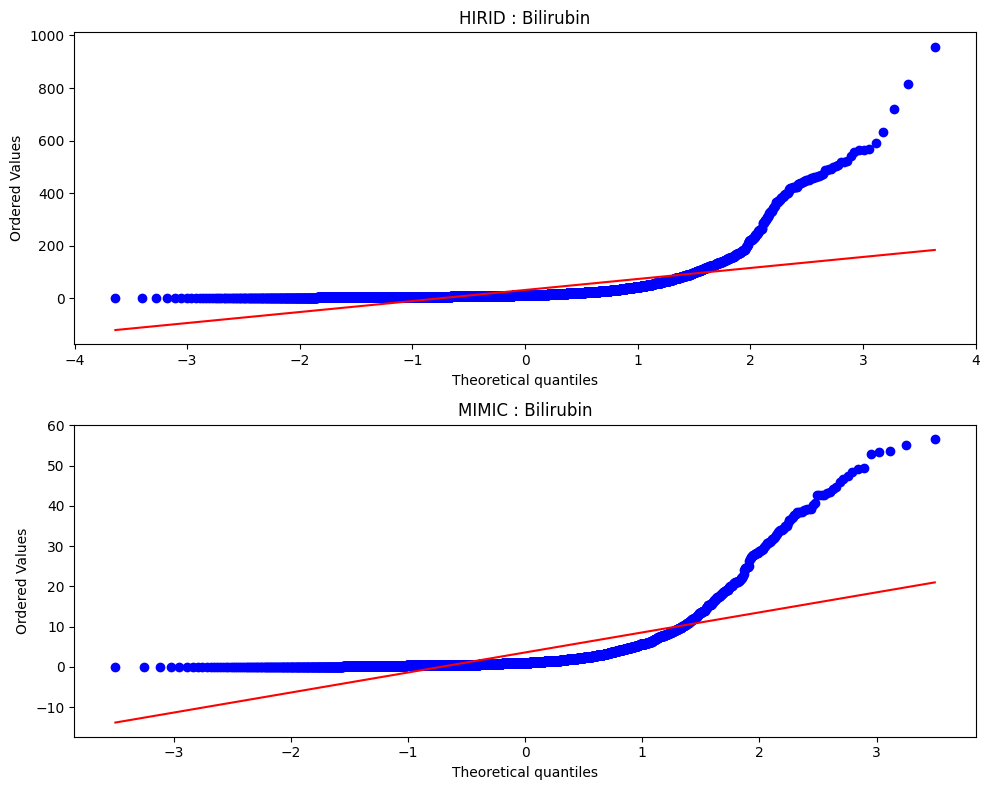

=== INR T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | mimic normality : 0.0
T-Statistic: 22182655.5  T_P-Value: 0.0



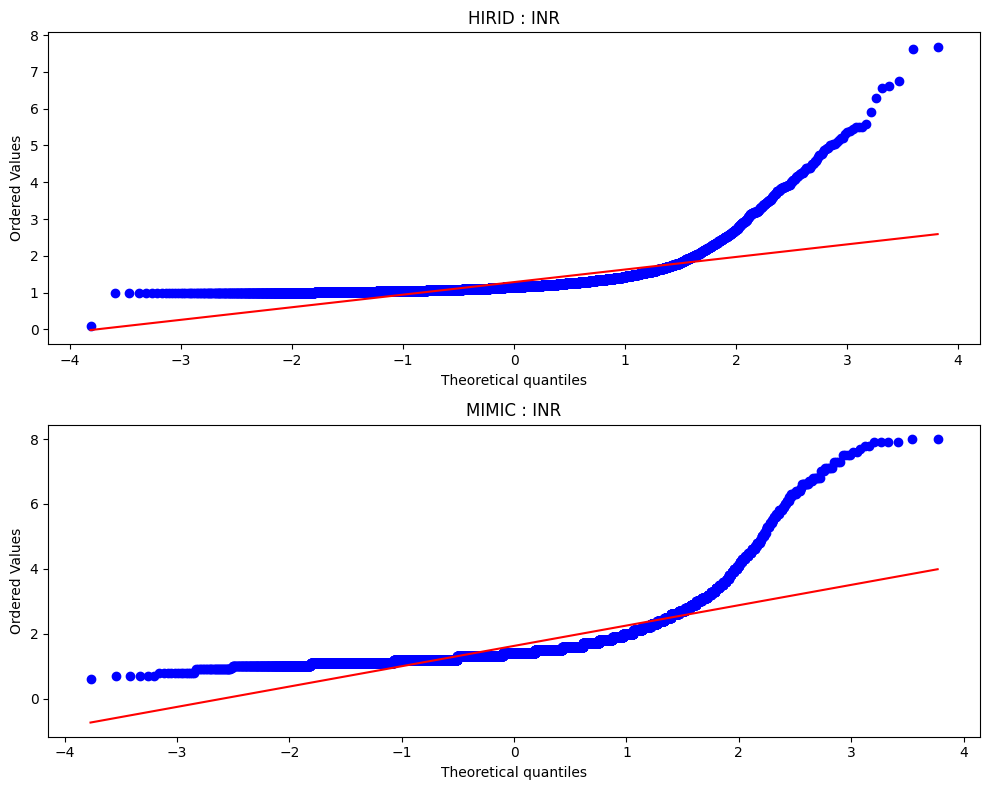

=== pH T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | mimic normality : 0.0
T-Statistic: 537817214.0  T_P-Value: 0.0



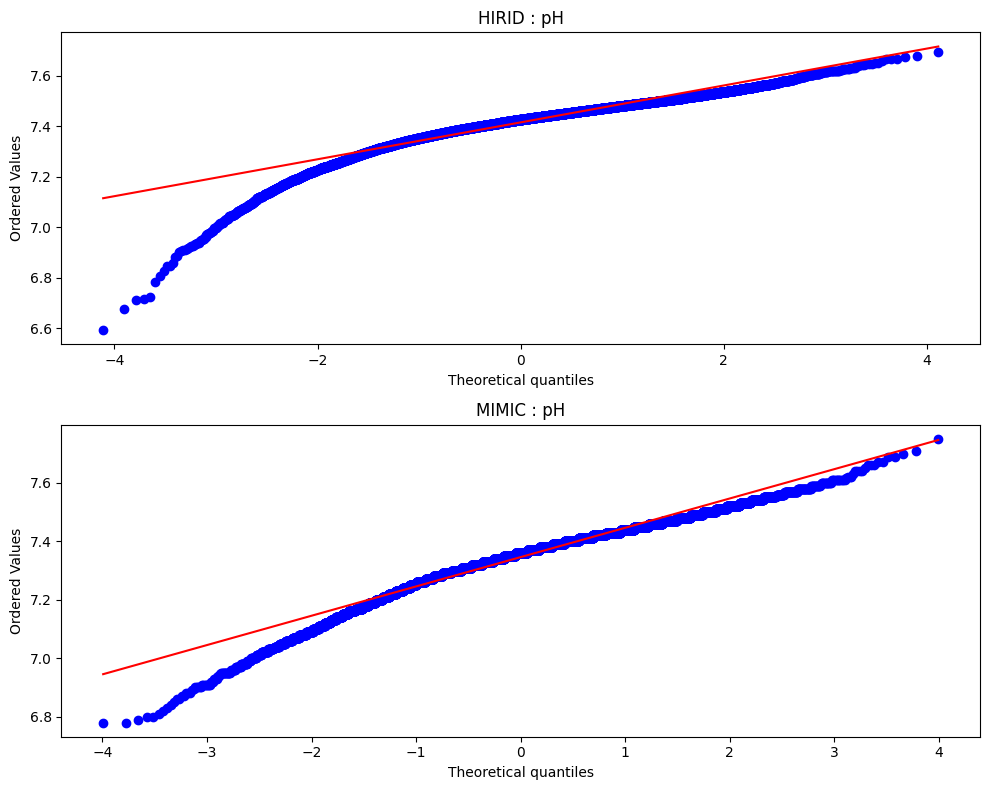

=== Fluid_Bolus T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | mimic normality : 0.0
T-Statistic: 3430348822.0  T_P-Value: 0.0



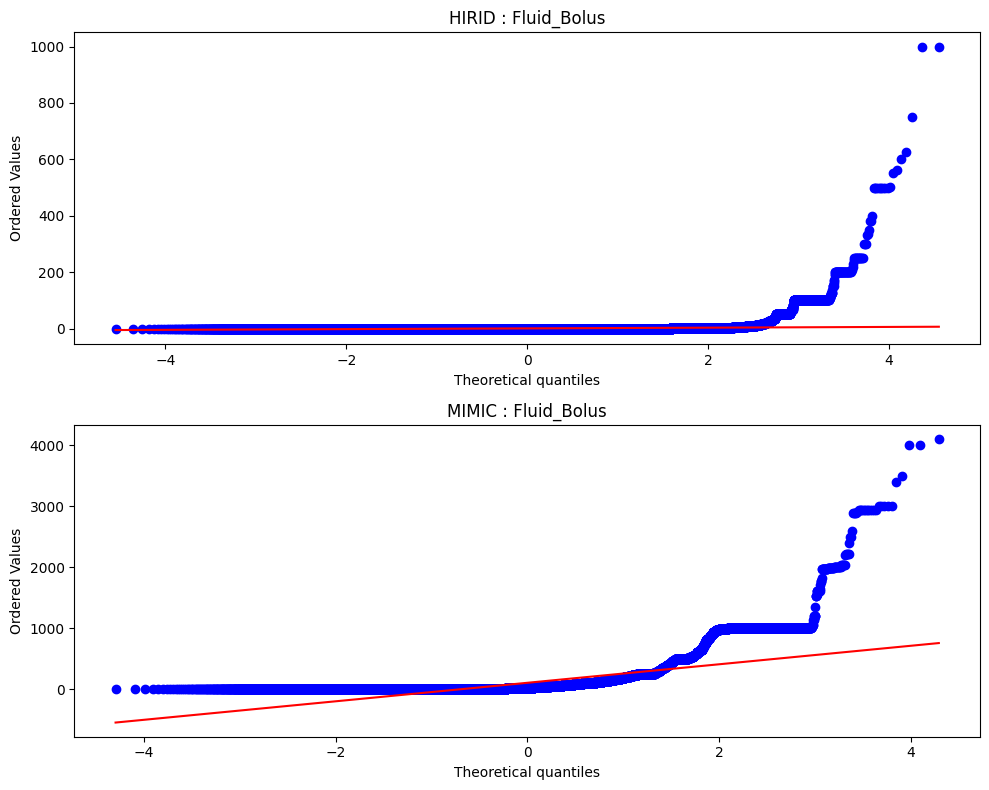

=== PaO2/FiO2 T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | mimic normality : 0.0
T-Statistic: 6687908899.0  T_P-Value: 9.636258833291872e-05



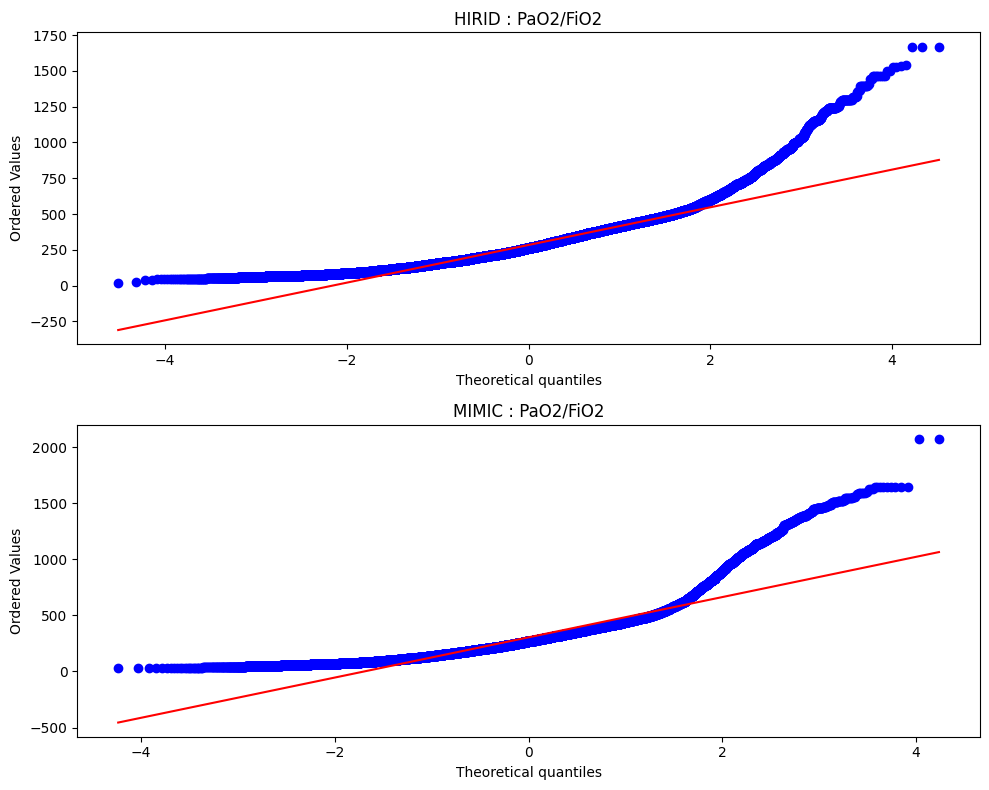

=== Age T-Test Result ===
Normality is not satisfied
hirid normality : 0.0 | mimic normality : 0.0
T-Statistic: 9391358089.0  T_P-Value: 1.5733609802931493e-293



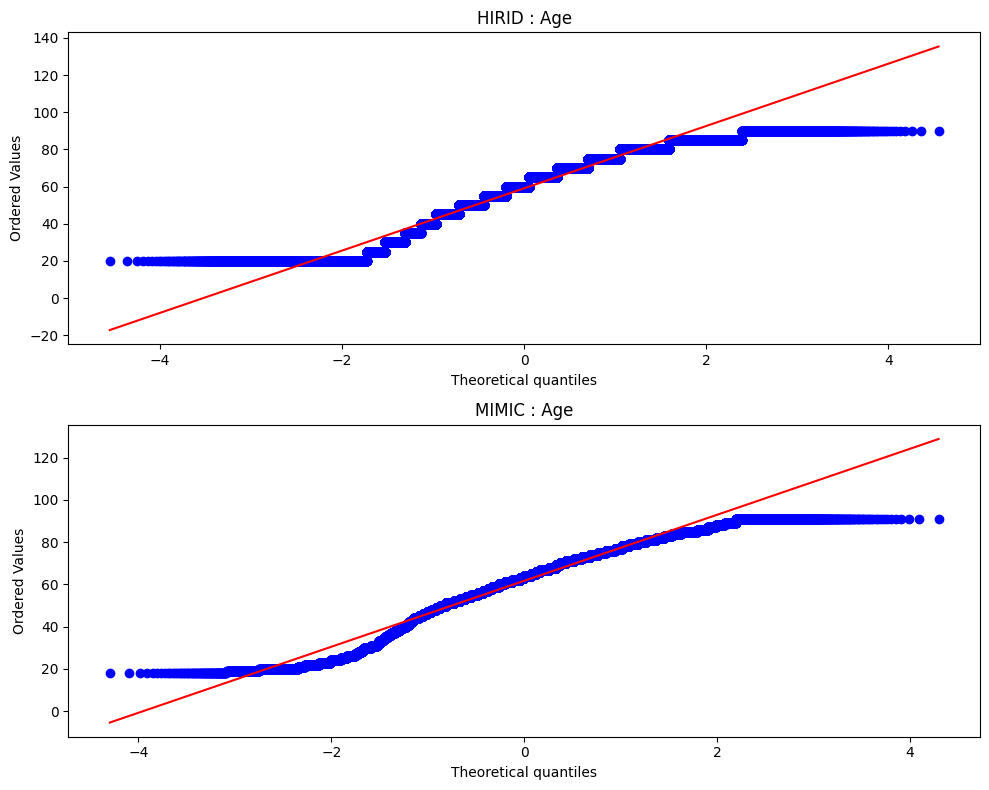

In [23]:
### HIRID vs MIMIC 가설검정
import matplotlib.pyplot as plt
import seaborn as sns

p_t_values = []
p_levene_values = []
diff_true = {}
diff_false = {}
alpha = 0.05

for i in cont_cols:
    try:
        print(f"=== {i} T-Test Result ===")

        hirid_values = hirid[hirid.loc[:,i] != -100].loc[:,i]
        mimic_values = mimic[mimic.loc[:,i] != -100].loc[:,i]

        # Normality Test (정규성 검정)
        hirid_normal_test_statistic, hirid_normal_test_p_values = stats.normaltest(hirid_values)
        mimic_normal_test_statistic, mimic_normal_test_p_values = stats.normaltest(mimic_values)
        
        if hirid_normal_test_p_values < 0.05 and mimic_normal_test_p_values < 0.05:
            ## 정규성을 만족하지 않는다면 맨 휘트니 검정을 수행.
            print('Normality is not satisfied')
            t_statistic,p = stats.mannwhitneyu(hirid_values, mimic_values)
            p_t_values.append(p)

        else:
            print('Normality is satisfied')
            f_statistic, p_levene = stats.levene(hirid_values, mimic_values) # 등분산성 검정
            p_levene_values.append(p_levene)

            if p_levene < alpha:
                t_statistic,p = stats.ttest_ind(hirid_values, mimic_values, equal_var=False) # 독립 표본 t-검정 수행, 이분산 상황
                p_t_values.append(p)
            else:
                t_statistic,p = stats.ttest_ind(hirid_values, mimic_values, equal_var=True) # 독립 표본 t-검정 수행, 등분산 상황
                p_t_values.append(p)
        
        print(f'hirid normality : {hirid_normal_test_p_values} | mimic normality : {mimic_normal_test_p_values}')
        print("T-Statistic:", t_statistic, f' T_P-Value: {p}')
        print()

        fig, ax = plt.subplots(2,1,figsize =(10,8))
        stats.probplot(hirid_values, plot = ax[0])
        stats.probplot(mimic_values, plot = ax[1])
        ax[0].set_title(f'HIRID : {i}')
        ax[1].set_title(f'MIMIC : {i}')
        plt.tight_layout()
        plt.show()

        if p < alpha:
            diff_true[i] = [t_statistic, p]
        else:
            diff_false[i] = [t_statistic, p]
    except:
        print(f"=== {i} T-Test Result Pass!!! ===")
        continue
    
# # 본페로니 교정 적용 
# reject, pvals_corrected, _, _ = sm.stats.multipletests(p_t_values, alpha=0.05, method='bonferroni')

# # 결과 출력
# print(reject)  # 교정 후 기각 여부: True는 귀무 가설이 기각됨을 의미, False는 기각되지 않음을 의미
# print(pvals_corrected)  # 교정된 p-값

# # 기각되지 않은 column 확인
# for col,i in zip(cont_cols,reject):
#     if not i:
#         print(f'After bonferroni the {col} is failed to add null hypothesis')
    


In [24]:
print(f'이상치 제거 전 분포의 차이가 존재함을 보이는 변수의 개수 {len(diff_true)} / {len(cont_cols)} 개')

p_list = np.mean([p for t,p in diff_true.values()])
print(f'p-value의 평균 값 : {p_list}')

이상치 제거 전 분포의 차이가 존재함을 보이는 변수의 개수 47 / 49 개
p-value의 평균 값 : 0.00012808295244911378


In [25]:
# ## 분위수에 따른 이상치 제거 후 차이 비교

# p_t_values_ao = []
# p_levene_values_ao = []
# diff_true_ao = {}
# diff_false_ao = {}
# alpha = 0.05

# def remove_outliers(data):
#     q1 = np.percentile(data, 25)  
#     q3 = np.percentile(data, 75) 
#     iqr = q3 - q1 
#     threshold = 1.5 * iqr  
    
#     # 이상치 식별
#     lower_bound = q1 - threshold
#     upper_bound = q3 + threshold
    
#     # 이상치 제거
#     outliers_removed = [x for x in data if x >= lower_bound and x <= upper_bound]
    
#     return outliers_removed

# for i in cont_cols:
    
#     # 정규성 검정
#     mimic_values, eicu_values = remove_outliers(mimic.loc[:,i]), remove_outliers(eicu.loc[:,i])
#     mimic_normal_test_statistic, mimic_normal_test_p_values = stats.normaltest(mimic_values)
#     eicu_normal_test_statistic, eicu_normal_test_p_values = stats.normaltest(eicu_values)
    
#     if mimic_normal_test_p_values < 0.05 and eicu_normal_test_p_values < 0.05:
#         print('Normality is not satisfied')
#         t_statistic,p = stats.mannwhitneyu(mimic_values, eicu_values)
#         p_t_values_ao.append(p)

#     else:
#         print('Normality is satisfied')
#         f_statistic, p_levene = stats.levene(mimic_values, eicu_values) # 등분산성 검정
#         p_levene_values_ao.append(p_levene)

#         if p_levene < alpha:
#             t_statistic,p = stats.ttest_ind(mimic_values, eicu_values, equal_var=False) # 독립 표본 t-검정 수행
#             p_t_values_ao.append(p)
#         else:
#             t_statistic,p = stats.ttest_ind(mimic_values, eicu_values, equal_var=True) # 독립 표본 t-검정 수행
#             p_t_values_ao.append(p)
    
#     print(f"=== {i} T-Test Result ===")
#     print(f'mimic normality : {mimic_normal_test_p_values} | eicu normality : {eicu_normal_test_p_values}')
#     print("T-Statistic:", t_statistic, f' T_P-Value: {p}')
#     print()

#     if p < alpha:
#         diff_true_ao[i] = [t_statistic, p]
#     else:
#         diff_false_ao[i] = [t_statistic, p]

# # # 본페로니 교정 적용 
# # reject, pvals_corrected, _, _ = sm.stats.multipletests(p_t_values_ao, alpha=0.05, method='bonferroni')

# # # 결과 출력
# # print(reject)  # 교정 후 기각 여부: True는 귀무 가설이 기각됨을 의미, False는 기각되지 않음을 의미
# # print(pvals_corrected)  # 교정된 p-값

# # # 기각되지 않은 column 확인
# # for col,i in zip(cont_cols,reject):
# #     if not i:
# #         print(f'After bonferroni the {col} is failed to add null hypothesis')


In [69]:
# # nan value 제외 총 2개가 존재.
# print(f'이상치 제거 전 분포의 차이가 존재함을 보이는 변수의 개수 {len(diff_true_ao)} / {len(cont_cols)} 개')
# print(diff_false_ao)
# p_list_ao = np.mean([p for t,p in diff_true_ao.values()])
# print(f'p-value의 평균 값 : {p_list_ao}')

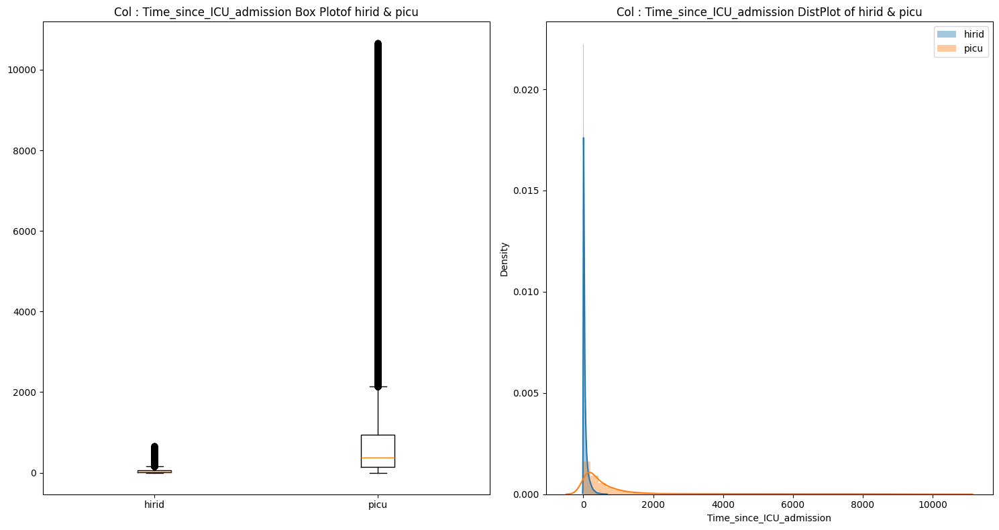

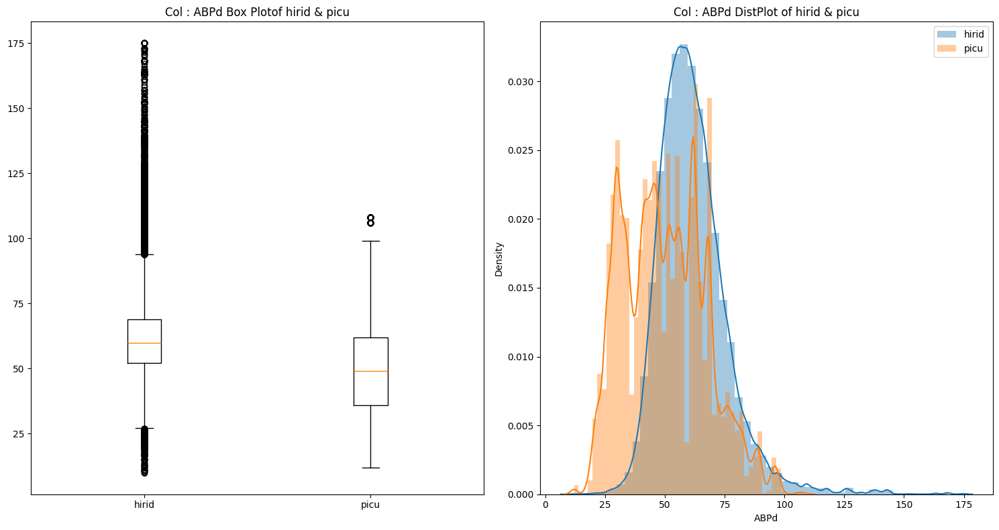

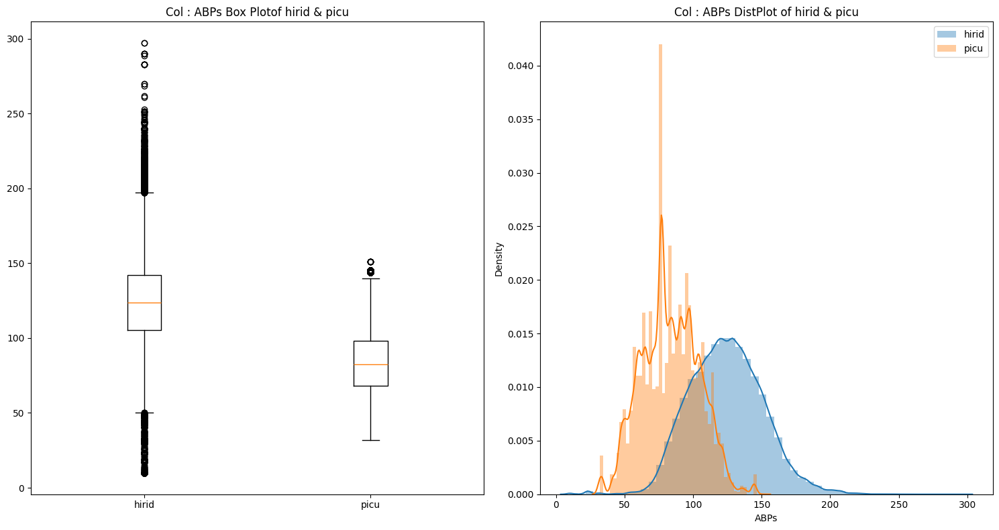

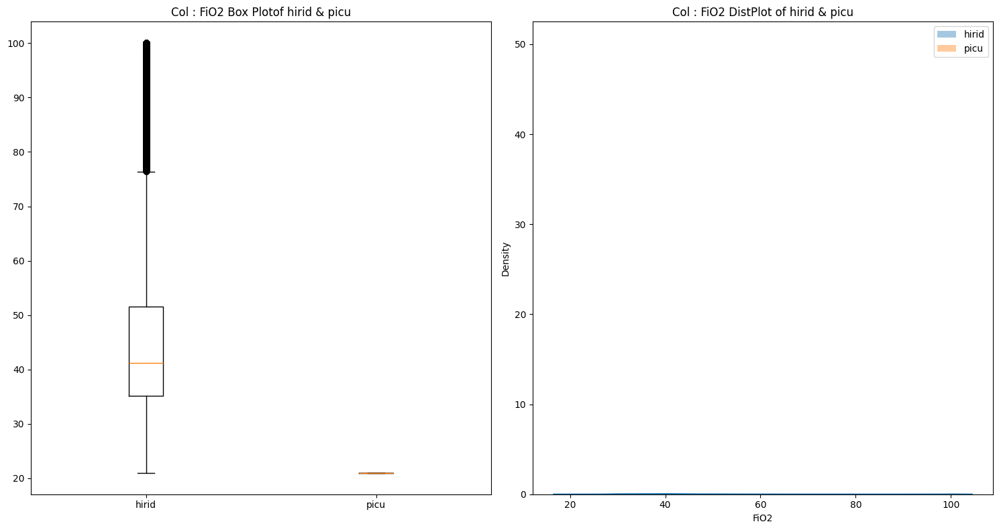

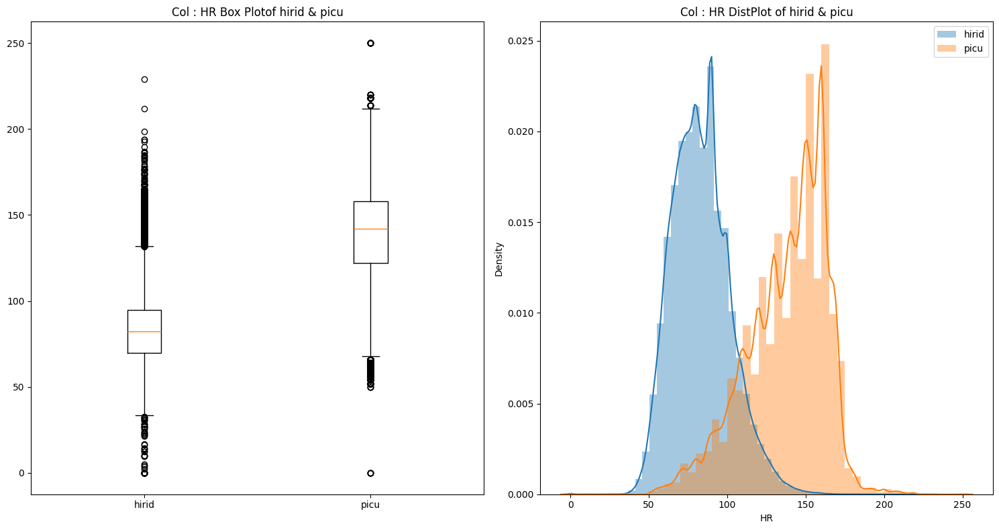

...

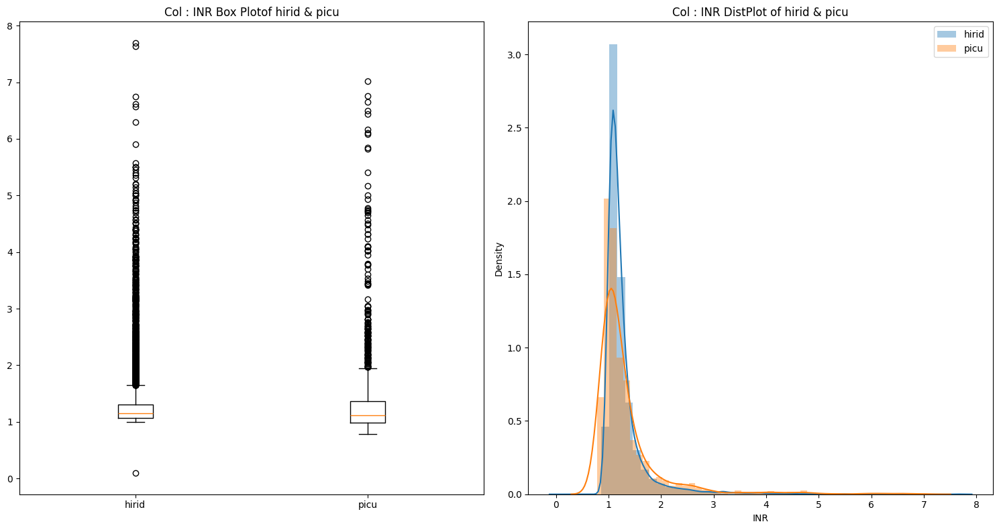

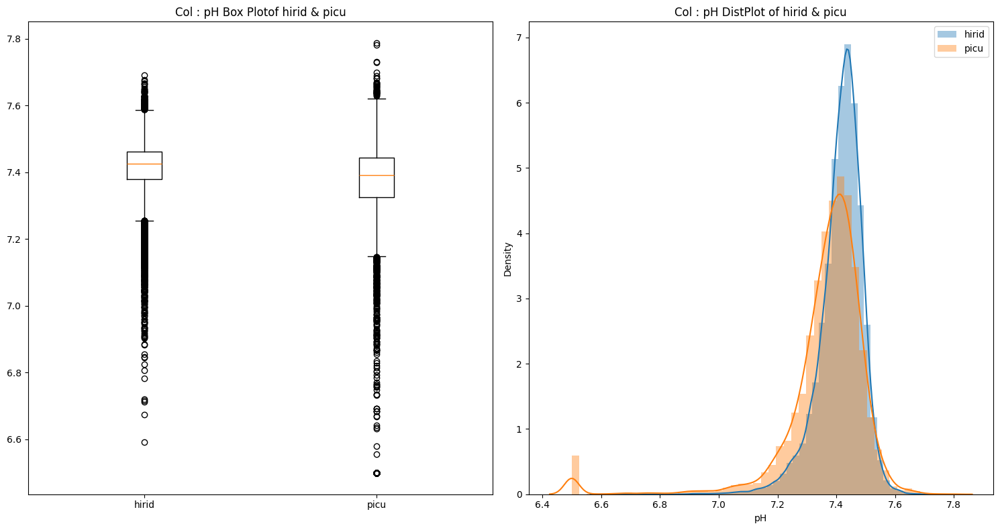

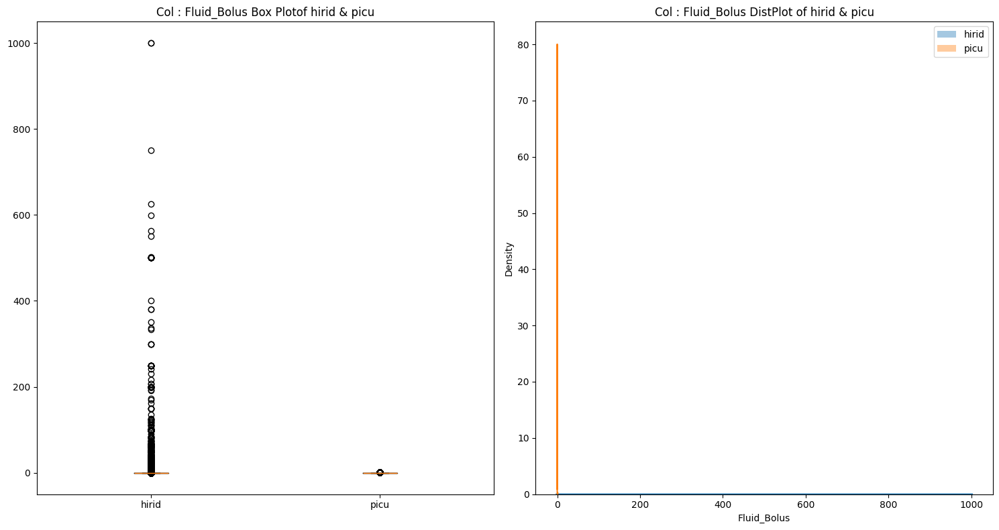

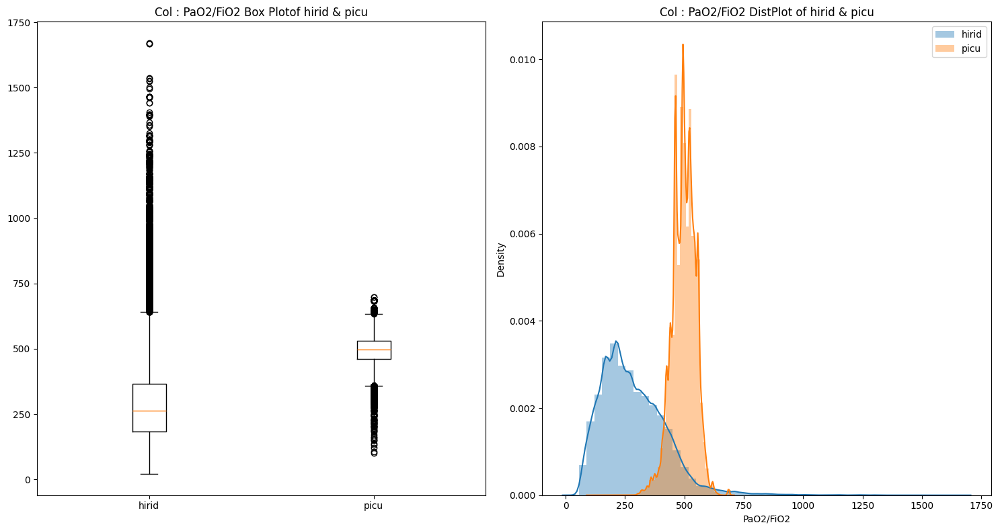

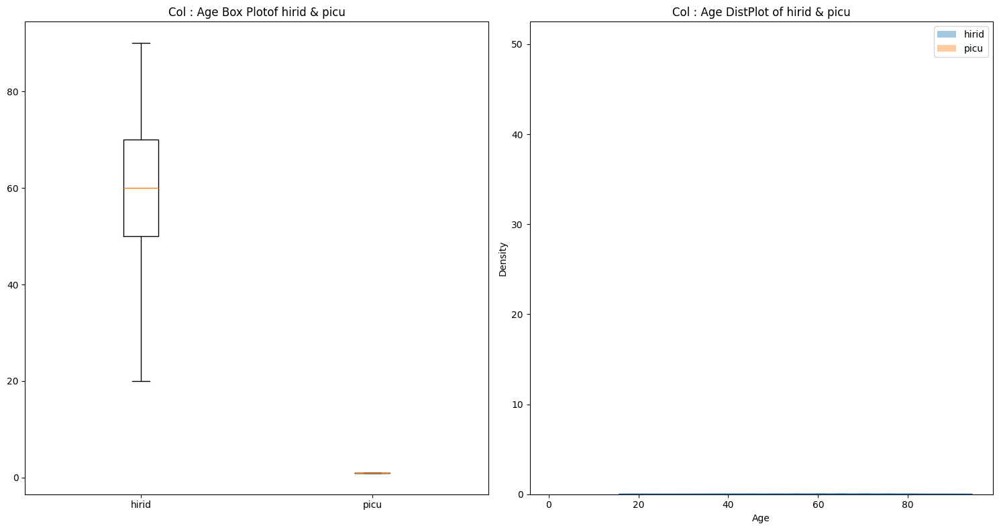

In [28]:
### HIRID vs MIMIC distplot 시각화
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
%matplotlib inline
warnings.filterwarnings('ignore')

for i in diff_true.keys():
    fig ,ax = plt.subplots(1,2,figsize = (15, 8))
    ax[0].boxplot([hirid[hirid.loc[:,i] != -100].loc[:,i], picu[picu.loc[:,i] != -100].loc[:,i]], labels = ["hirid","picu"])
    sns.distplot(hirid[hirid.loc[:,i] != -100].loc[:,i], ax = ax[1], label = 'hirid')
    sns.distplot(picu[picu.loc[:,i] != -100].loc[:,i], ax = ax[1], label = 'picu')
    ax[0].set_title(f'Col : {i} Box Plotof hirid & picu')
    ax[1].set_title(f'Col : {i} DistPlot of hirid & picu')
    plt.legend()
    plt.tight_layout()
    plt.show()
    

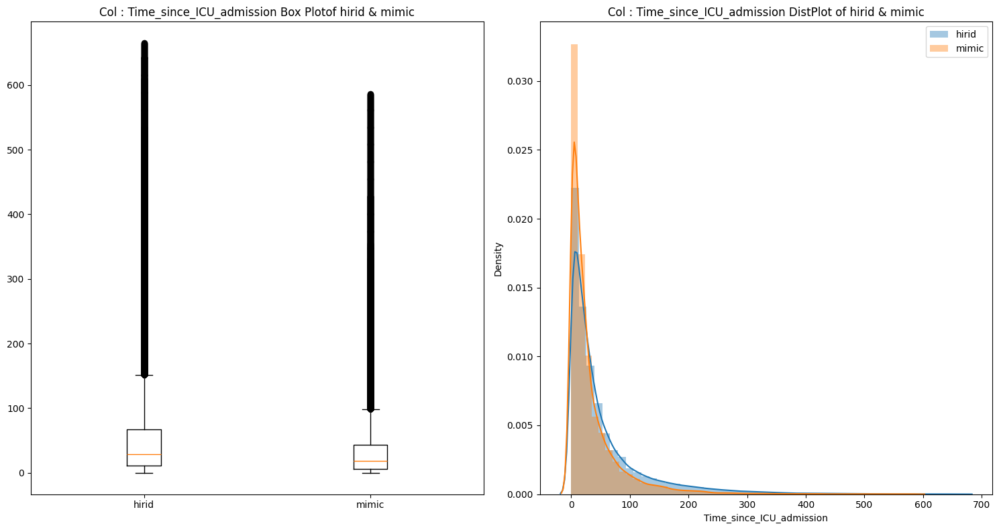

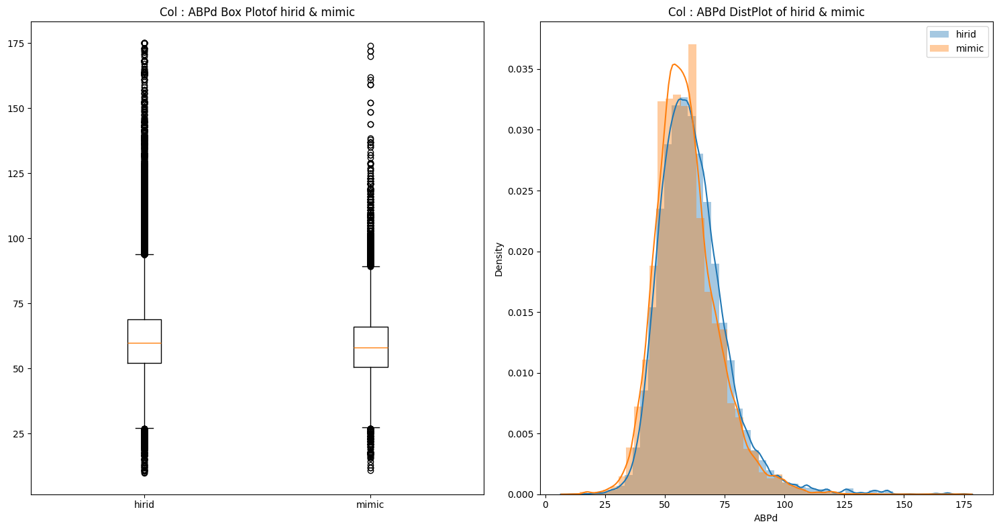

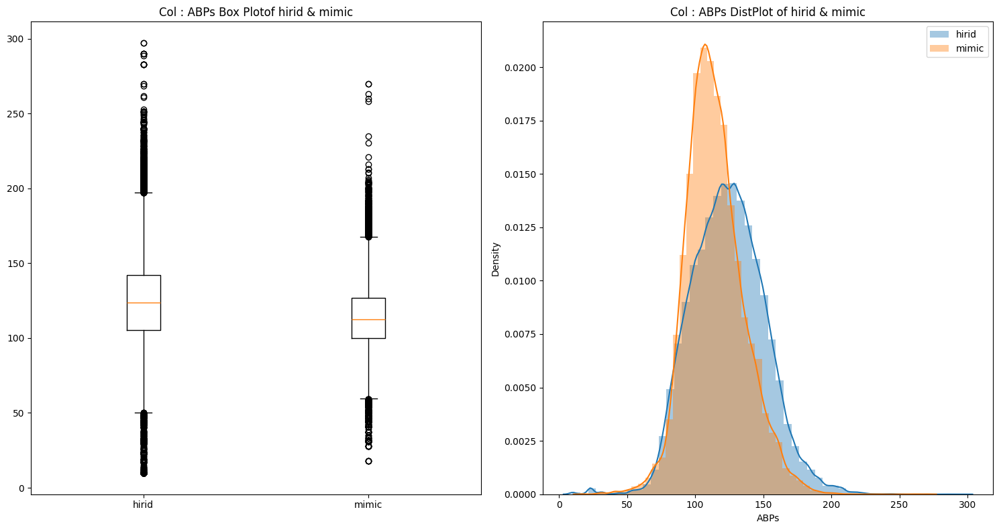

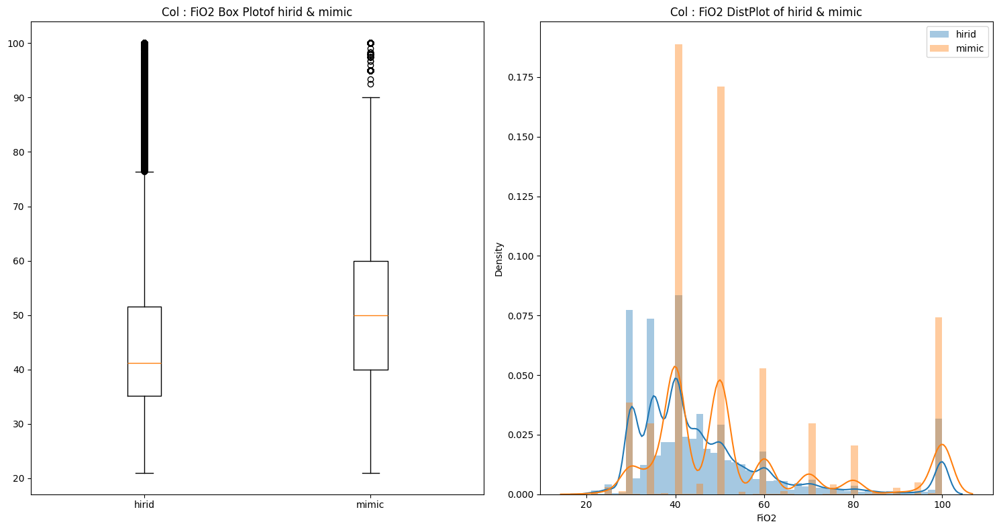

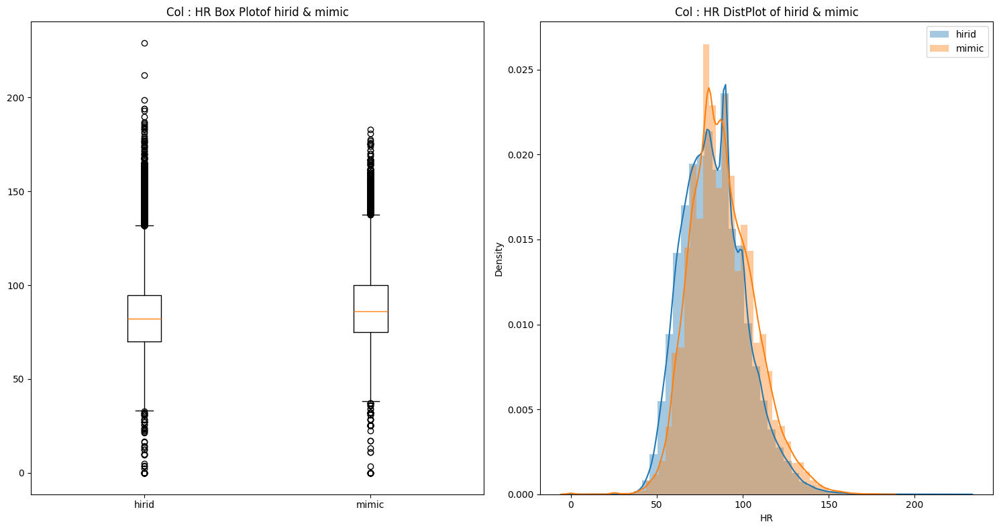

...

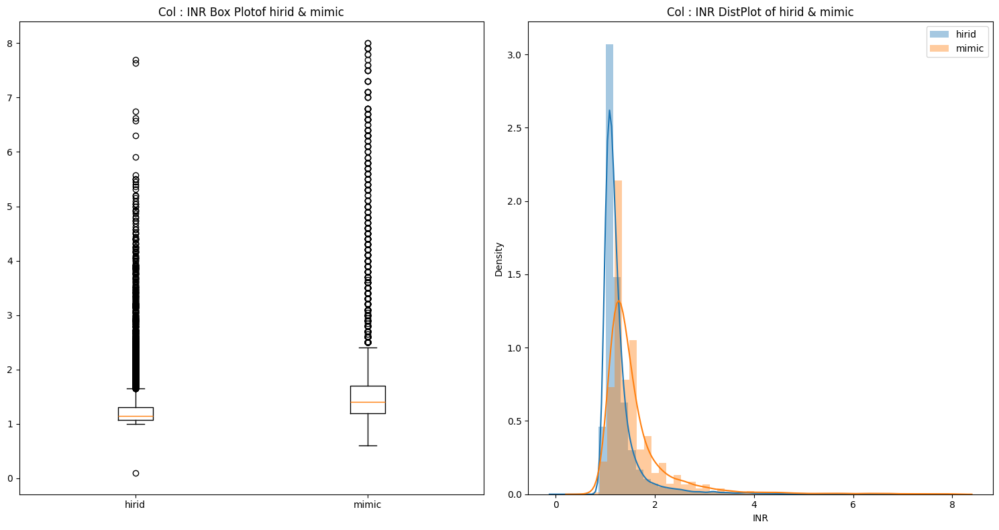

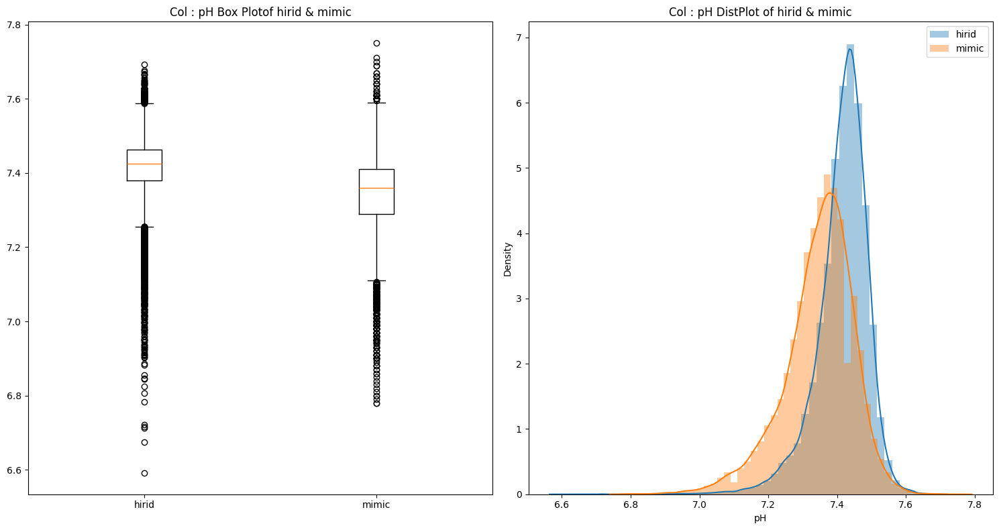

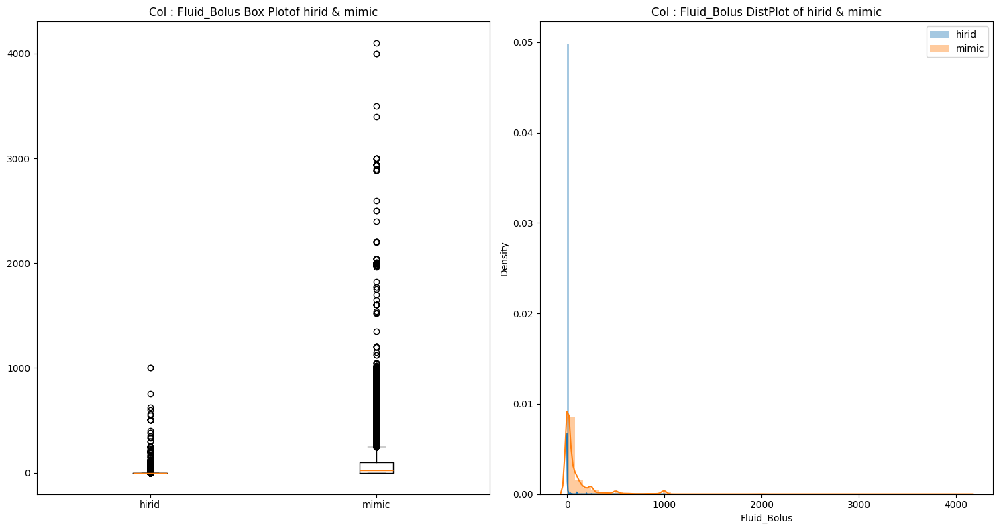

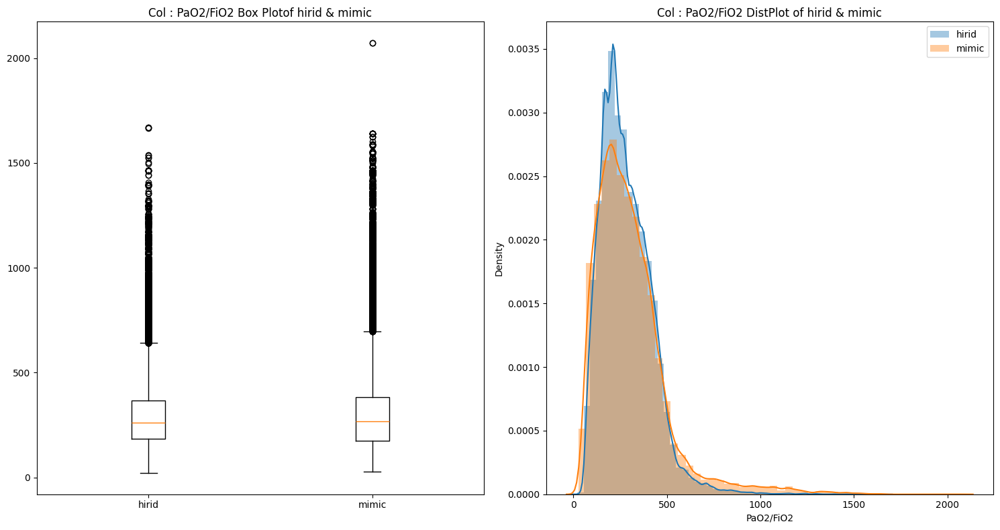

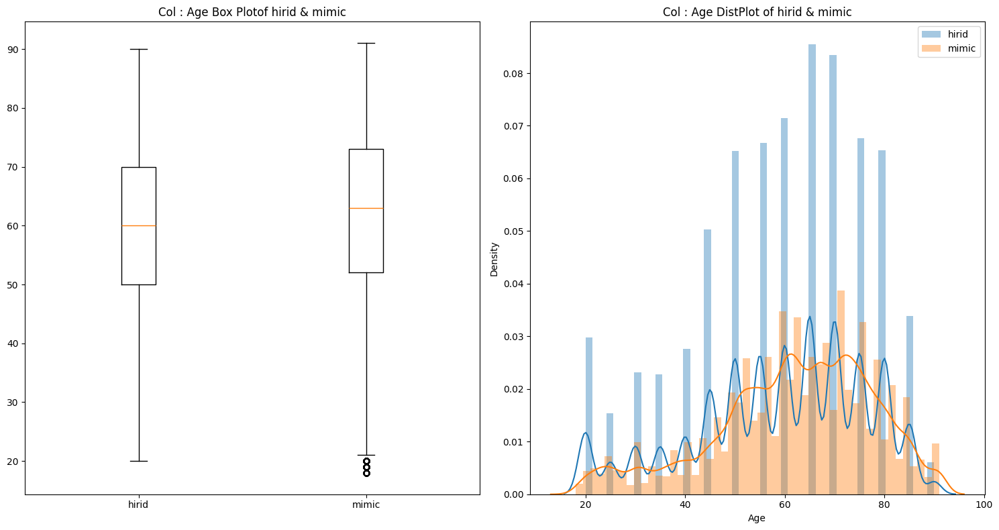

In [29]:
### HIRID vs MIMIC distplot 시각화
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
%matplotlib inline
warnings.filterwarnings('ignore')

for i in diff_true.keys():
    fig ,ax = plt.subplots(1,2,figsize = (15, 8))
    ax[0].boxplot([hirid[hirid.loc[:,i] != -100].loc[:,i], mimic[mimic.loc[:,i] != -100].loc[:,i]], labels = ["hirid","mimic"])
    sns.distplot(hirid[hirid.loc[:,i] != -100].loc[:,i], ax = ax[1], label = 'hirid')
    sns.distplot(mimic[mimic.loc[:,i] != -100].loc[:,i], ax = ax[1], label = 'mimic')
    ax[0].set_title(f'Col : {i} Box Plotof hirid & mimic')
    ax[1].set_title(f'Col : {i} DistPlot of hirid & mimic')
    plt.legend()
    plt.tight_layout()
    plt.show()
    

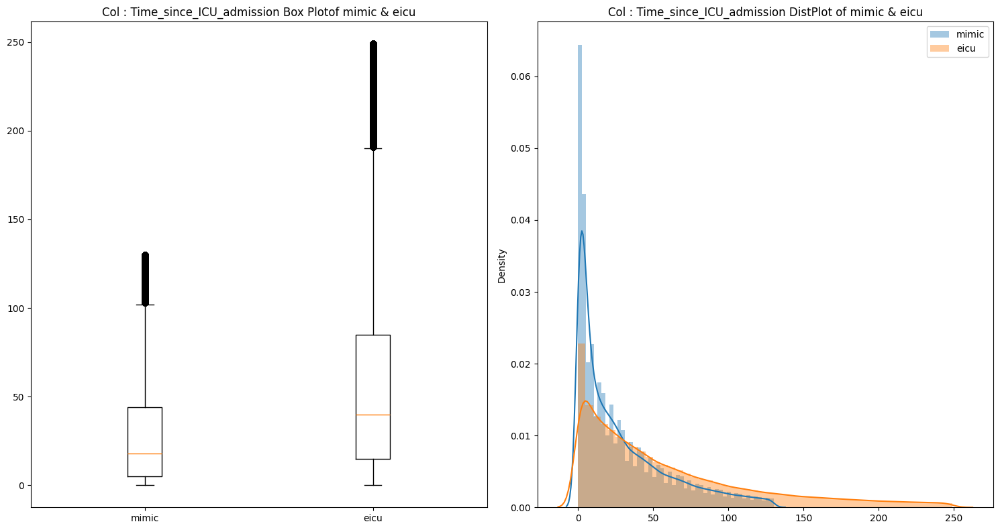

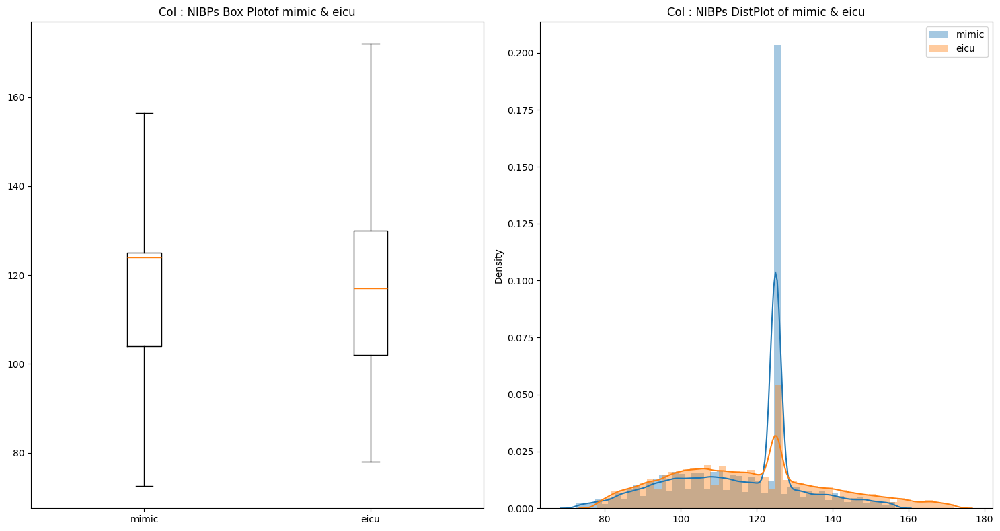

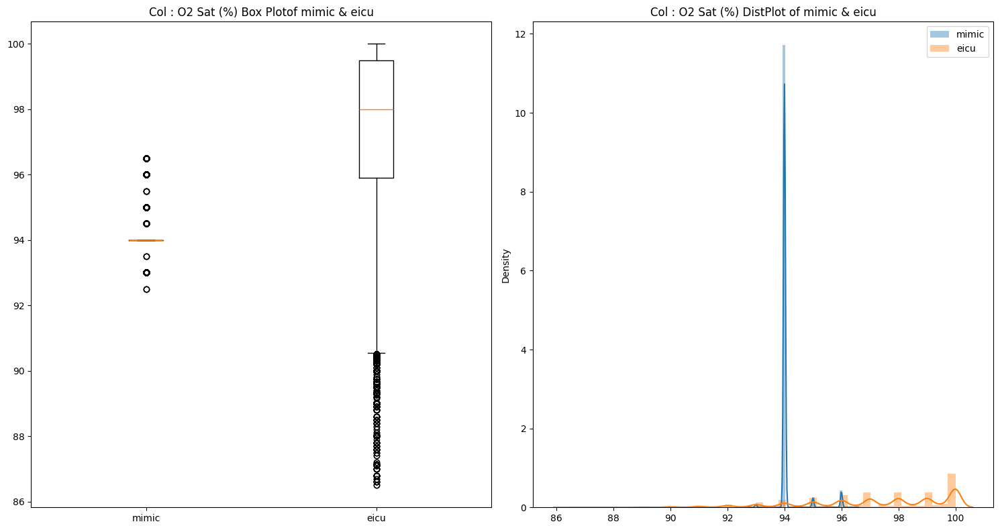

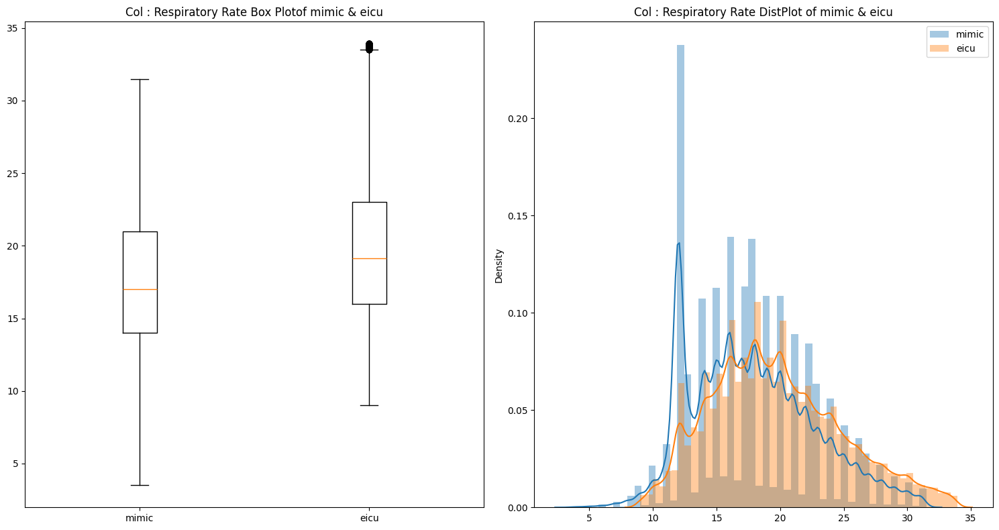

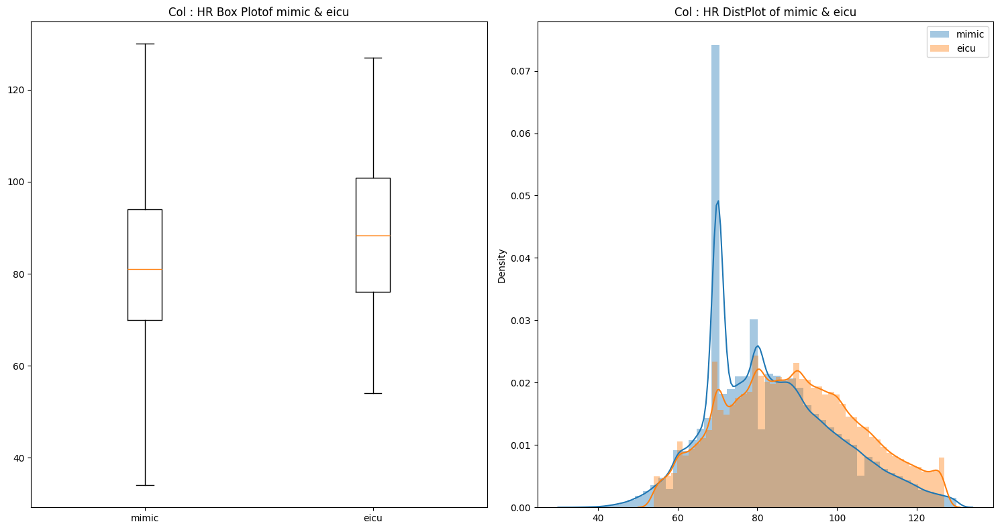

...

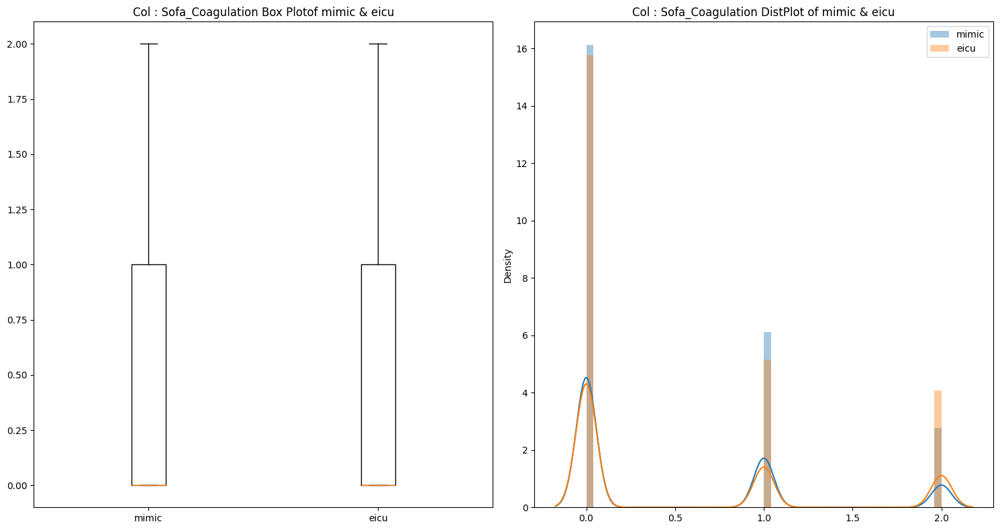

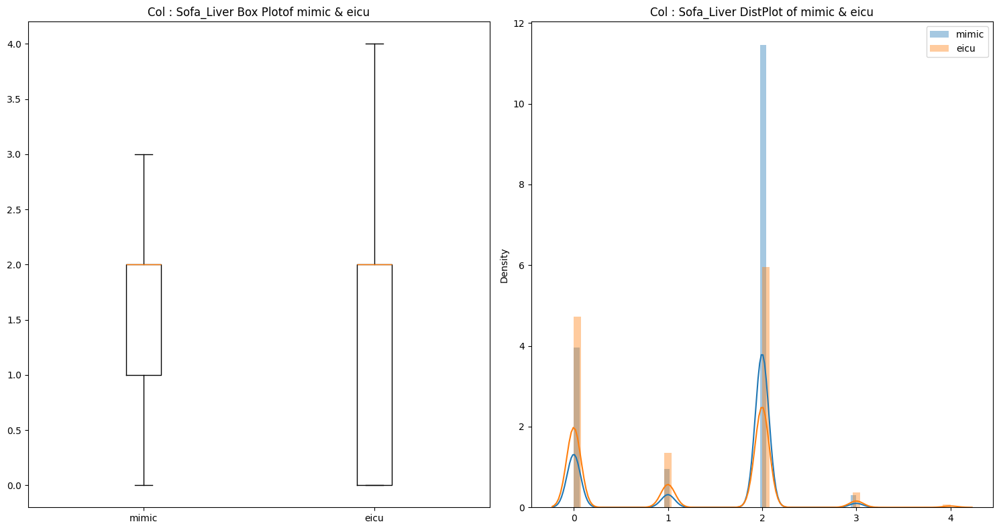

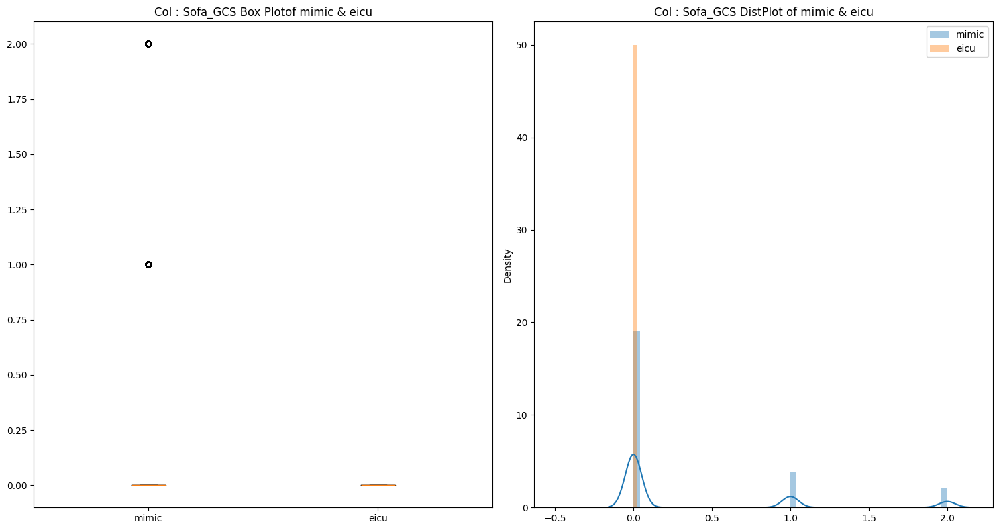

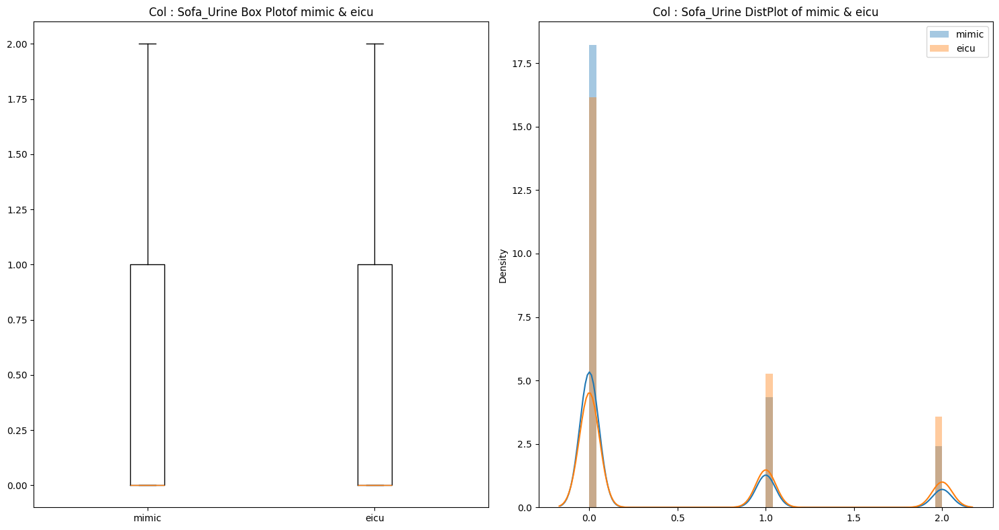

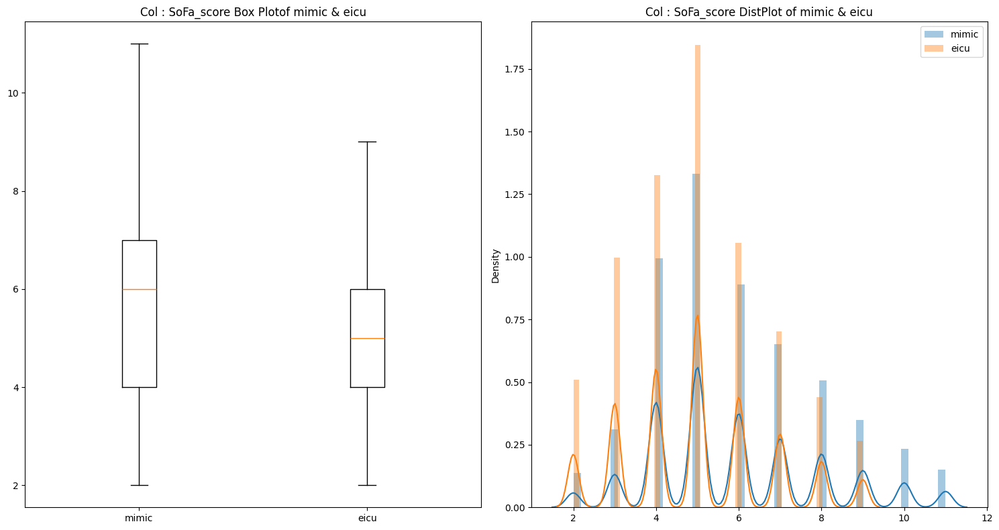

In [33]:
# 이상치 처리 후 시각화
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
%matplotlib inline
warnings.filterwarnings('ignore')

for i in diff_true_ao.keys():
    fig ,ax = plt.subplots(1,2,figsize = (15, 8))
    mimic_values, eicu_values = remove_outliers(mimic.loc[:,i]), remove_outliers(eicu.loc[:,i])
    ax[0].boxplot([mimic_values, eicu_values], labels = ["mimic","eicu"])
    sns.distplot(mimic_values, ax = ax[1], label = 'mimic')
    sns.distplot(eicu_values, ax = ax[1], label = 'eicu')
    ax[0].set_title(f'Col : {i} Box Plotof mimic & eicu')
    ax[1].set_title(f'Col : {i} DistPlot of mimic & eicu')
    plt.legend()
    plt.tight_layout()
    plt.show()
    

In [53]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
from scipy import stats
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt 

folder_name = './result/final_DA_Strict'
target_name = "ARDS_next_12h"

positive_latent_eicu_v = np.load(folder_name + '/positive_latent_vector.npy')
negative_latent_eicu_v = np.load(folder_name + '/negative_latent_vector.npy')

positive_result_eicu = pd.read_csv(folder_name + '/positive_eicu_result.csv')
negative_result_eicu = pd.read_csv(folder_name + '/negative_eicu_result.csv')

positive_latent_mimic_v = np.load(folder_name + '/positive_mimic_latent_vector.npy')
negative_latent_mimic_v = np.load(folder_name + '/negative_mimic_latent_vector.npy')

positive_result_mimic = pd.read_csv(folder_name + '/positive_mimic_result.csv')
negative_result_mimic = pd.read_csv(folder_name + '/negative_mimic_result.csv')

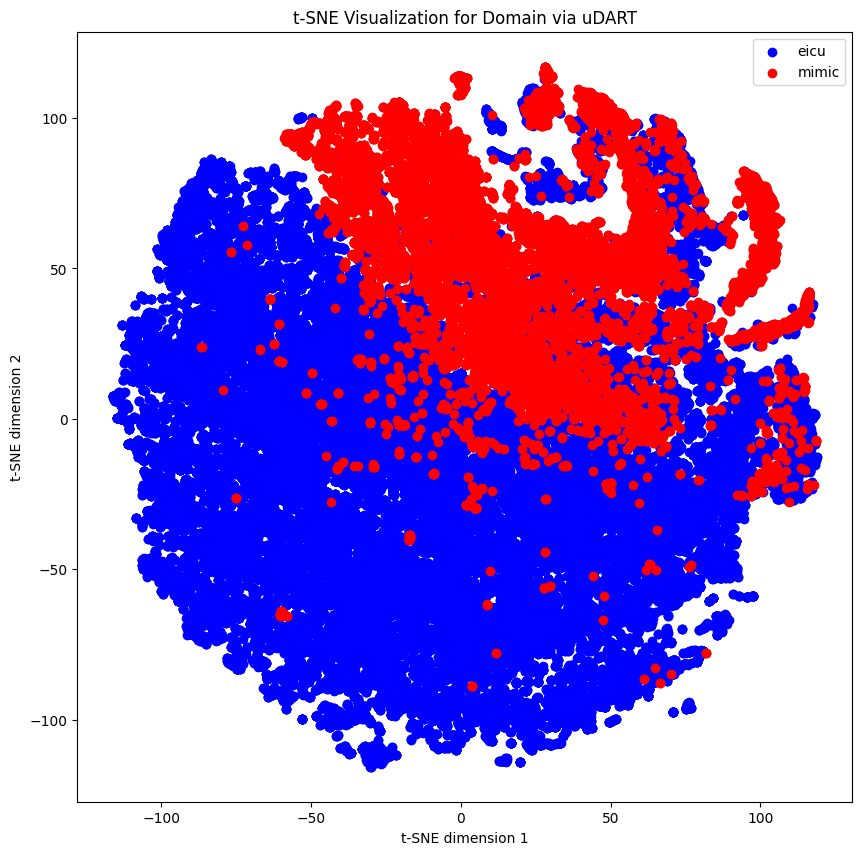

In [55]:
# # # ## DA 진행한 거 T-SNE
# from matplotlib.colors import ListedColormap
# from sklearn.model_selection import train_test_split

# unified_latent_eicu_v = np.concatenate((positive_latent_eicu_v,negative_latent_eicu_v))
# result_df_eicu = pd.concat([positive_result_eicu,negative_result_eicu],axis = 0)
# result_df_eicu['domain'] = 'eicu'

# unified_latent_mimic_v = np.concatenate((positive_latent_mimic_v,negative_latent_mimic_v))
# result_df_mimic = pd.concat([positive_result_mimic,negative_result_mimic],axis = 0)
# result_df_mimic['domain'] = 'mimic'

# final_latent_v = np.concatenate((unified_latent_eicu_v,unified_latent_mimic_v))
# final_df = pd.concat([result_df_eicu[[target_name,'domain']],result_df_mimic[[target_name,'domain']]],axis = 0)

# tsne = TSNE(n_components= 2, random_state = 0)

# tsne_input = pd.concat([pd.DataFrame(final_latent_v).reset_index(drop = True),final_df.reset_index(drop=True)],axis = 1)

# X_train, X_valid, y_train, y_valid = train_test_split(tsne_input.iloc[:,:-2], tsne_input['domain'], train_size = 0.8, stratify = tsne_input['domain'], random_state = 0)

# # print(X_valid)
# X_tsne = tsne.fit_transform(X_valid)

df = pd.DataFrame({'Feature1' : X_tsne[:,0], 'Feature2' : X_tsne[:,1], 'domain' : y_valid, 'label': tsne_input.loc[X_valid.index,target_name].values})

plt.figure(figsize=(10,10))
plt.scatter(df.loc[df['domain'] == 'eicu', 'Feature1'], df.loc[df['domain'] == 'eicu', 'Feature2'], c='b', label='eicu')
plt.scatter(df.loc[df['domain'] == 'mimic', 'Feature1'], df.loc[df['domain'] == 'mimic', 'Feature2'], c='r', label='mimic')
plt.xlabel('t-SNE dimension 1')
plt.ylabel('t-SNE dimension 2')
plt.title('t-SNE Visualization for Domain via uDART')
plt.legend()
plt.show()

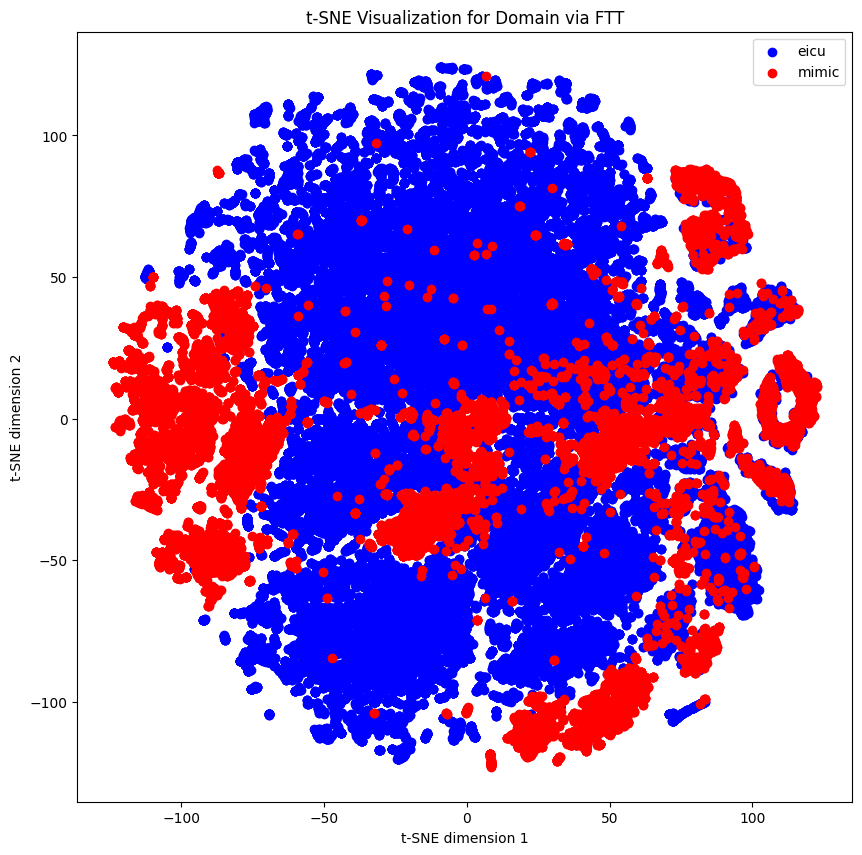

In [57]:
# import pandas as pd
# import numpy as np
# import statsmodels.api as sm
# from scipy import stats
# from sklearn.manifold import TSNE
# import matplotlib.pyplot as plt 
# from matplotlib.colors import ListedColormap
# from sklearn.model_selection import train_test_split

# folder_name = './result/final_uni_focal_Strict'
# target_name = "ARDS_next_12h"

# positive_latent_eicu_v = np.load(folder_name + '/positive_latent_vector.npy')
# negative_latent_eicu_v = np.load(folder_name + '/negative_latent_vector.npy')

# positive_result_eicu = pd.read_csv(folder_name + '/positive_eicu_result.csv')
# negative_result_eicu = pd.read_csv(folder_name + '/negative_eicu_result.csv')

# positive_latent_mimic_v = np.load(folder_name + '/positive_mimic_latent_vector.npy')
# negative_latent_mimic_v = np.load(folder_name + '/negative_mimic_latent_vector.npy')

# positive_result_mimic = pd.read_csv(folder_name + '/positive_mimic_result.csv')
# negative_result_mimic = pd.read_csv(folder_name + '/negative_mimic_result.csv')

# # DA 진행 X

# unified_latent_eicu_v = np.concatenate((positive_latent_eicu_v,negative_latent_eicu_v))
# result_df_eicu = pd.concat([positive_result_eicu,negative_result_eicu],axis = 0)
# result_df_eicu['domain'] = 'eicu'

# unified_latent_mimic_v = np.concatenate((positive_latent_mimic_v,negative_latent_mimic_v))
# result_df_mimic = pd.concat([positive_result_mimic,negative_result_mimic],axis = 0)
# result_df_mimic['domain'] = 'mimic'

# final_latent_v = np.concatenate((unified_latent_eicu_v,unified_latent_mimic_v))
# final_df = pd.concat([result_df_eicu[[target_name,'domain']],result_df_mimic[[target_name,'domain']]],axis = 0)

# tsne = TSNE(n_components= 2, random_state= 0)

# tsne_input = pd.concat([pd.DataFrame(final_latent_v).reset_index(drop = True),final_df.reset_index(drop=True)],axis = 1)

# X_train, X_valid, y_train, y_valid = train_test_split(tsne_input.iloc[:,:-2], tsne_input['domain'], train_size = 0.8, stratify = tsne_input['domain'], random_state = 0)


# X_tsne = tsne.fit_transform(X_valid)

# 예쁜 색상 팔레트를 정의

df = pd.DataFrame({'Feature1' : X_tsne[:,0], 'Feature2' : X_tsne[:,1], 'domain' : y_valid, 'label': tsne_input.loc[X_valid.index,target_name].values})

plt.figure(figsize=(10,10))
plt.scatter(df.loc[df['domain'] == 'eicu', 'Feature1'], df.loc[df['domain'] == 'eicu', 'Feature2'], c='b', label='eicu')
plt.scatter(df.loc[df['domain'] == 'mimic', 'Feature1'], df.loc[df['domain'] == 'mimic', 'Feature2'], c='r', label='mimic')
plt.xlabel('t-SNE dimension 1')
plt.ylabel('t-SNE dimension 2')
plt.title('t-SNE Visualization for Domain via FTT')
plt.legend()
plt.show()